# Goal
- Analyze the bias variance tradeoff of the dataset
- We adopt the setting from Cuarana 2009

In [1]:
import os
os.chdir('../')

import sys
sys.path.insert(0, './my_interpret/python')

In [2]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score
import loaddata_utils
import pickle
import copy
from general_utils import vector_in
from vis_utils import cal_statistics, highlight_min_max
# interpret.set_show_addr(("127.0.0.1", 7001))

In [3]:
random_state = 1377

## Load all the dataframes for qualitative purposes

In [4]:
all_record_df = pd.read_csv('./results/1108_ss.csv')
# Remove all the incremental part...
all_record_df = all_record_df[all_record_df.d_name.apply(lambda x: 'inc' not in x)]
all_record_df.tail()

,d_name,model_name,split_idx,n_splits,random_state,fit_time,test_size,test_auc,test_aupr,test_mse,test_acc,test_logloss,train_auc,train_aupr,train_mse,train_acc,train_logloss,model_path
2144,ss_mimiciii_b1_r1377_lr,ebm-bf-o100-i100-q,3,5,1377,3838.893389,0.15,0.740113,0.291972,0.079220,0.903729,0.281997,0.761601,0.336946,0.077040,0.906647,0.274444,models/1108_ss/ss_mimiciii_b1_r1377_lr_ebm-bf-...
2145,ss_mimiciii_b1_r1377_lr,xgb-d1-o100,3,5,1377,444.215401,0.15,0.749392,0.299427,0.078682,0.903729,0.279488,0.790856,0.380806,0.074312,0.909142,0.262902,models/1108_ss/ss_mimiciii_b1_r1377_lr_xgb-d1-...
2146,ss_mimiciii_b1_r1377_lr,ebm-o100-i100-q,4,5,1377,308.844948,0.15,0.749529,0.306158,0.078614,0.903729,0.278888,0.783627,0.373212,0.074920,0.907808,0.266140,models/1108_ss/ss_mimiciii_b1_r1377_lr_ebm-o10...
2147,ss_mimiciii_b1_r1377_lr,ebm-bf-o100-i100-q,4,5,1377,3914.152672,0.15,0.746203,0.291713,0.079352,0.902754,0.281390,0.759451,0.332986,0.077166,0.906604,0.275091,models/1108_ss/ss_mimiciii_b1_r1377_lr_ebm-bf-...
2148,ss_mimiciii_b1_r1377_lr,xgb-d1-o100,4,5,1377,438.956669,0.15,0.755122,0.321062,0.077836,0.906410,0.276413,0.789416,0.378033,0.074409,0.908453,0.263461,models/1108_ss/ss_mimiciii_b1_r1377_lr_xgb-d1-...


## Check

In [5]:
all_record_df.model_name.unique()

array(['ebm-o50-i50-q', 'ebm-bf-o50-q', 'lr', 'spline-v2', 'flam',
       'xgb-d1-o20-cols1', 'ilr-q', 'mlr-q', 'xgb-d1-o100',
       'ebm-bf-o100-i100-q', 'ebm-o100-i100-q'], dtype=object)

In [6]:
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 500)
all_record_df.groupby(['d_name']).apply(lambda x: len(x))

d_name
ss_adult_b1_r1377_ebm-o50-i50-q           34
ss_adult_b1_r1377_flam                    45
ss_adult_b1_r1377_lr                      45
ss_adult_b1_r1377_spline-v2               40
ss_adult_b1_r1377_xgb-d1-o20-cols1        35
ss_breast_b1_r1377_ebm-o100-i100-q        40
ss_breast_b1_r1377_ebm-o50-i50            40
ss_breast_b1_r1377_flam                   55
ss_breast_b1_r1377_lr                     55
ss_breast_b1_r1377_spline-v2              55
ss_breast_b1_r1377_xgb-d1-o100            40
ss_breast_b1_r1377_xgb-d1-o20-cols1       40
ss_churn_b1_r1377_ebm-o100-i100-q         40
ss_churn_b1_r1377_ebm-o50-i50-q           40
ss_churn_b1_r1377_flam                    55
ss_churn_b1_r1377_lr                      55
ss_churn_b1_r1377_spline-v2               55
ss_churn_b1_r1377_xgb-d1-o100             40
ss_churn_b1_r1377_xgb-d1-o20-cols1        40
ss_heart_b1_r1377_ebm-o100-i100-q         40
ss_heart_b1_r1377_ebm-o50-i50-q           40
ss_heart_b1_r1377_flam                    55
ss_

In [7]:
all_record_df.groupby(['d_name', 'model_name']).apply(lambda x: len(x))

d_name                                  model_name        
ss_adult_b1_r1377_ebm-o50-i50-q         ebm-bf-o50-q           5
                                        ebm-o50-i50-q          5
                                        flam                   4
                                        ilr-q                  5
                                        lr                     5
                                        mlr-q                  5
                                        xgb-d1-o20-cols1       5
ss_adult_b1_r1377_flam                  ebm-bf-o50-q           5
                                        ebm-o50-i50-q         10
                                        flam                   5
                                        ilr-q                  5
                                        lr                     5
                                        mlr-q                  5
                                        spline-v2              5
                               

## All Performance (only compare the GAM model)

In [8]:
all_record_df.model_name.unique()

array(['ebm-o50-i50-q', 'ebm-bf-o50-q', 'lr', 'spline-v2', 'flam',
       'xgb-d1-o20-cols1', 'ilr-q', 'mlr-q', 'xgb-d1-o100',
       'ebm-bf-o100-i100-q', 'ebm-o100-i100-q'], dtype=object)

In [9]:
# Filter out the unwanted models
all_record_df = all_record_df[
    vector_in(all_record_df.model_name, 
#               ['ebm-o50-i50', 'ebm-bf-o50', 'xgb-d1-o20-cv', 'mlr', 'lr', 'ilr', 'rspline-v2', 'rspline-v2-s', 'flam', 'spline-v2'])
              ['ebm-o100-i100-q', 'ebm-bf-o100-i100-q', 'xgb-d1-o100', 'mlr-q', 'lr', 'ilr-q', 'flam', 'spline-v2'])
]
# Filter out the rspline datasets
all_record_df = all_record_df[
    all_record_df.d_name.apply(lambda x: 'rspline' not in x and 'spline-b' not in x)
]
# Filter out the old datasets
all_record_df = all_record_df[
    all_record_df.d_name.apply(lambda x: 'ebm-o50-i50-q' not in x and 'xgb-d1-o20-cols1' not in x and 'ebm-o50-i50' not in x)
]

all_record_df = all_record_df[
    all_record_df.d_name.apply(lambda x: not('adult' in x))
]

all_record_df = all_record_df.sort_values('model_name')

In [10]:
all_record_df.d_name.unique()

array(['ss_breast_b1_r1377_xgb-d1-o100', 'ss_mimicii_b1_r1377_lr',
       'ss_heart_b1_r1377_xgb-d1-o100',
       'ss_heart_b1_r1377_ebm-o100-i100-q',
       'ss_mimiciii_b1_r1377_ebm-o100-i100-q', 'ss_churn_b1_r1377_lr',
       'ss_mimiciii_b1_r1377_xgb-d1-o100', 'ss_pneumonia_b1_r1377_lr',
       'ss_pneumonia_b1_r1377_spline-v2', 'ss_mimicii_b1_r1377_spline-v2',
       'ss_churn_b1_r1377_ebm-o100-i100-q', 'ss_churn_b1_r1377_spline-v2',
       'ss_breast_b1_r1377_ebm-o100-i100-q', 'ss_pneumonia_b1_r1377_flam',
       'ss_mimicii_b1_r1377_flam', 'ss_breast_b1_r1377_flam',
       'ss_mimiciii_b1_r1377_flam',
       'ss_pneumonia_b1_r1377_ebm-o100-i100-q',
       'ss_mimiciii_b1_r1377_spline-v2', 'ss_heart_b1_r1377_lr',
       'ss_mimicii_b1_r1377_ebm-o100-i100-q',
       'ss_mimicii_b1_r1377_xgb-d1-o100',
       'ss_pneumonia_b1_r1377_xgb-d1-o100', 'ss_mimiciii_b1_r1377_lr',
       'ss_churn_b1_r1377_xgb-d1-o100', 'ss_heart_b1_r1377_spline-v2',
       'ss_heart_b1_r1377_flam', 'ss_brea

In [11]:
all_record_df.model_name.unique()

array(['ebm-bf-o100-i100-q', 'ebm-o100-i100-q', 'flam', 'ilr-q', 'lr',
       'mlr-q', 'spline-v2', 'xgb-d1-o100'], dtype=object)

### Classification

In [12]:
from vis_utils import rank, normalized_score, add_new_row, highlight_min_max
from general_utils import vector_in

cls_record_df = all_record_df[~vector_in(all_record_df.d_name, ['calhousing', 'bikeshare'])]
# cls_record_df = cls_record_df[cls_record_df.d_name != 'diabetes']

all_tables = {}
for metric in ['test_auc', 'test_mse', 'test_aupr', 'test_logloss', 'test_acc']:
# for metric in ['avg_test_auc', 'error_test_mse', 'avg_test_aupr', 'avg_test_logloss', 'avg_test_acc']:

# for metric in ['test_auc', 'test_mse', 'test_aupr', 'test_logloss', 'test_acc', 'train_auc', 'train_aupr', 'train_logloss', 'train_acc']:
    print(metric)
    the_format = '%.4f +- %.4f' if 'mse' not in metric else '%.5f +- %.5f'
    tmp = cls_record_df.groupby(['d_name', 'model_name'], as_index=False)[metric].agg(['mean', 'std']).apply(lambda x: the_format % (x['mean'], x['std']), axis=1)
    
    results = []
    for d_name in tmp.index.levels[0]:
        tmp_df = pd.DataFrame(tmp[d_name]).T
        tmp_df.index = [d_name]
        results.append(tmp_df)
    table = pd.concat(results, axis=0, sort=False)
    all_tables[metric] = table

test_auc
test_mse
test_aupr
test_logloss
test_acc


In [13]:
from vis_utils import cal_statistics

In [14]:
for metric in ['test_auc', 'test_mse']:
    print(metric)
    table = all_tables[metric]
    
    is_metric_higher_better = (metric in ['test_auc', 'test_aupr', 'test_acc'])
    new_table = cal_statistics(table, metric, is_metric_higher_better)

    display(new_table.style.apply(highlight_min_max, axis=1))

test_auc


model_name,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.9889 +- 0.0114,0.9935 +- 0.0066,0.9936 +- 0.0064,0.9795 +- 0.0141,0.9946 +- 0.0056,0.9848 +- 0.0115,0.9878 +- 0.0110,0.9934 +- 0.0065
ss_breast_b1_r1377_flam,0.9955 +- 0.0052,0.9969 +- 0.0047,0.9977 +- 0.0031,0.9811 +- 0.0053,0.9968 +- 0.0042,0.9851 +- 0.0053,0.9876 +- 0.0100,0.9969 +- 0.0045
ss_breast_b1_r1377_lr,0.9893 +- 0.0106,0.9867 +- 0.0141,0.9885 +- 0.0132,0.9688 +- 0.0285,0.9867 +- 0.0153,0.9736 +- 0.0268,0.9767 +- 0.0188,0.9886 +- 0.0127
ss_breast_b1_r1377_spline-v2,0.9037 +- 0.0258,0.9076 +- 0.0246,0.9426 +- 0.0089,0.9019 +- 0.0261,0.9225 +- 0.0265,0.9057 +- 0.0298,0.9443 +- 0.0093,0.8987 +- 0.0224
ss_breast_b1_r1377_xgb-d1-o100,0.9916 +- 0.0074,0.9955 +- 0.0044,0.9947 +- 0.0061,0.9812 +- 0.0164,0.9961 +- 0.0038,0.9867 +- 0.0109,0.9894 +- 0.0078,0.9958 +- 0.0059
ss_churn_b1_r1377_ebm-o100-i100-q,0.8354 +- 0.0141,0.8393 +- 0.0126,0.8372 +- 0.0130,0.8336 +- 0.0121,0.8330 +- 0.0141,0.8245 +- 0.0149,0.8374 +- 0.0139,0.8382 +- 0.0138
ss_churn_b1_r1377_flam,0.8164 +- 0.0158,0.8192 +- 0.0171,0.8174 +- 0.0215,0.8144 +- 0.0182,0.8172 +- 0.0178,0.8021 +- 0.0124,0.8200 +- 0.0174,0.8196 +- 0.0168
ss_churn_b1_r1377_lr,0.8330 +- 0.0117,0.8374 +- 0.0135,0.8371 +- 0.0141,0.8335 +- 0.0152,0.8394 +- 0.0124,0.8257 +- 0.0151,0.8381 +- 0.0129,0.8377 +- 0.0119
ss_churn_b1_r1377_spline-v2,0.8470 +- 0.0057,0.8497 +- 0.0041,0.8443 +- 0.0160,0.8435 +- 0.0039,0.8392 +- 0.0154,0.8329 +- 0.0064,0.8457 +- 0.0145,0.8502 +- 0.0059
ss_churn_b1_r1377_xgb-d1-o100,0.8438 +- 0.0079,0.8458 +- 0.0089,0.8449 +- 0.0088,0.8393 +- 0.0098,0.8389 +- 0.0092,0.8284 +- 0.0073,0.8460 +- 0.0088,0.8473 +- 0.0076


test_mse


model_name,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.02590 +- 0.00941,0.02130 +- 0.01224,0.02142 +- 0.01059,0.05157 +- 0.02579,0.02251 +- 0.01467,0.09772 +- 0.03233,0.04187 +- 0.00868,0.01649 +- 0.00883
ss_breast_b1_r1377_flam,0.02266 +- 0.01285,0.01926 +- 0.01370,0.01399 +- 0.01052,0.04956 +- 0.01821,0.01785 +- 0.01341,0.09835 +- 0.02864,0.04374 +- 0.01315,0.01285 +- 0.01129
ss_breast_b1_r1377_lr,0.03266 +- 0.01409,0.03991 +- 0.02261,0.03282 +- 0.01621,0.05838 +- 0.02800,0.03343 +- 0.01750,0.07811 +- 0.01481,0.05107 +- 0.01695,0.03432 +- 0.01869
ss_breast_b1_r1377_spline-v2,0.09869 +- 0.00967,0.09551 +- 0.00858,0.07733 +- 0.00833,0.12466 +- 0.01624,0.08654 +- 0.01056,0.11349 +- 0.01329,0.08071 +- 0.01015,0.10168 +- 0.01387
ss_breast_b1_r1377_xgb-d1-o100,0.03585 +- 0.02069,0.02874 +- 0.02094,0.02471 +- 0.02066,0.05304 +- 0.02764,0.02016 +- 0.01349,0.09765 +- 0.03118,0.04146 +- 0.01733,0.02096 +- 0.01996
ss_churn_b1_r1377_ebm-o100-i100-q,0.14018 +- 0.00562,0.13834 +- 0.00550,0.13919 +- 0.00530,0.14094 +- 0.00451,0.14102 +- 0.00615,0.14495 +- 0.00607,0.13911 +- 0.00629,0.13870 +- 0.00607
ss_churn_b1_r1377_flam,0.14630 +- 0.00619,0.14470 +- 0.00728,0.14520 +- 0.00824,0.14701 +- 0.00750,0.14591 +- 0.00684,0.15222 +- 0.00647,0.14434 +- 0.00731,0.14462 +- 0.00705
ss_churn_b1_r1377_lr,0.14237 +- 0.00417,0.14059 +- 0.00594,0.14046 +- 0.00575,0.14205 +- 0.00605,0.13959 +- 0.00557,0.14669 +- 0.00592,0.14017 +- 0.00596,0.14036 +- 0.00536
ss_churn_b1_r1377_spline-v2,0.13532 +- 0.00185,0.13379 +- 0.00133,0.13614 +- 0.00650,0.13660 +- 0.00137,0.13841 +- 0.00657,0.14122 +- 0.00328,0.13557 +- 0.00647,0.13340 +- 0.00173
ss_churn_b1_r1377_xgb-d1-o100,0.13718 +- 0.00262,0.13586 +- 0.00347,0.13612 +- 0.00338,0.13873 +- 0.00357,0.13858 +- 0.00368,0.14362 +- 0.00314,0.13580 +- 0.00351,0.13540 +- 0.00295


## Create all the dfs

In [15]:
all_dfs = {}

for d_name in np.sort(all_record_df.d_name.unique()):
#     if 'lr' not in d_name:
#         continue
    if 'adult' in d_name:
        continue

    path = 'results/1112-1108_ss-df/%s.pkl' % d_name
    if os.path.exists(path):
        print(d_name)
        all_dfs[d_name] = pickle.load(open(path, 'rb'))

ss_breast_b1_r1377_ebm-o100-i100-q
ss_breast_b1_r1377_flam
ss_breast_b1_r1377_lr
ss_breast_b1_r1377_spline-v2
ss_breast_b1_r1377_xgb-d1-o100
ss_churn_b1_r1377_ebm-o100-i100-q
ss_churn_b1_r1377_flam
ss_churn_b1_r1377_lr
ss_churn_b1_r1377_spline-v2
ss_churn_b1_r1377_xgb-d1-o100
ss_heart_b1_r1377_ebm-o100-i100-q
ss_heart_b1_r1377_flam
ss_heart_b1_r1377_lr
ss_heart_b1_r1377_spline-v2
ss_heart_b1_r1377_xgb-d1-o100
ss_mimicii_b1_r1377_ebm-o100-i100-q
ss_mimicii_b1_r1377_flam
ss_mimicii_b1_r1377_lr
ss_mimicii_b1_r1377_spline-v2
ss_mimicii_b1_r1377_xgb-d1-o100
ss_mimiciii_b1_r1377_ebm-o100-i100-q
ss_mimiciii_b1_r1377_flam
ss_mimiciii_b1_r1377_lr
ss_mimiciii_b1_r1377_spline-v2
ss_mimiciii_b1_r1377_xgb-d1-o100
ss_pneumonia_b1_r1377_ebm-o100-i100-q
ss_pneumonia_b1_r1377_flam
ss_pneumonia_b1_r1377_lr
ss_pneumonia_b1_r1377_spline-v2
ss_pneumonia_b1_r1377_xgb-d1-o100


## Caculate graph MAE

In [16]:
# calculate the importance of the features for gnd_truth model
for d_name, df_per_datasets in all_dfs.items():
    all_dfs[d_name]['gnd_truth']['importance'] = df_per_datasets['gnd_truth'].apply(
        lambda row: -1 if row.feat_name == 'offset' else np.average(np.abs(row.y), weights=row.sample_weights), axis=1)

### MAE of the graph, weighted by the samples
1. Here we sum over all the errors. But in the table, we should normalize by number_of_examples and num_features

In [18]:
maes = {}
ommision_maes = {}
commision_maes = {}

for d_name, df_per_datasets in all_dfs.items():
    gt_lookup = df_per_datasets['gnd_truth'].set_index('feat_name')
    
    maes[d_name] = {}
    ommision_maes[d_name] = {}
    commision_maes[d_name] = {}
    for model_name in all_record_df[all_record_df.d_name == d_name].model_name.unique():
        model_df = df_per_datasets[model_name]
        if model_name in ['gnd_truth', 'rspline', 'rspline-v2', 'rspline-v2-s', 'spline-b']:
            continue

        maes[d_name][model_name] = {}
        ommision_maes[d_name][model_name] = {}
        commision_maes[d_name][model_name] = {}
            
        for _, row in model_df[model_df.feat_name != 'offset'].iterrows():
            gt_row = gt_lookup.loc[row.feat_name]
            
            error = np.abs(row.y - gt_row.y)
            ''' First, handle those that has the same sign '''
            is_same_sign = (row.y * gt_row.y >= 0) 
            ''' If |model's score| < |true score|: ommision_mae error '''
            ''' If |model's score| > |true score|: commision_mae error '''
            ommis_selector = is_same_sign & (np.abs(row.y) < np.abs(gt_row.y))
            ommision_mae = np.dot(error[ommis_selector], gt_row.sample_weights[ommis_selector])
            
            ''' Second, handle those with different sign '''
            if np.any(~is_same_sign):
                ommision_mae += np.dot(np.abs(np.array(gt_row.y)[~is_same_sign]), 
                                       np.array(gt_row.sample_weights)[~is_same_sign])
            
            all_mae = np.dot(error, gt_row.sample_weights)
            commision_mae = all_mae - ommision_mae
            
            maes[d_name][model_name][row.feat_name] = all_mae
            ommision_maes[d_name][model_name][row.feat_name] = ommision_mae
            commision_maes[d_name][model_name][row.feat_name] = commision_mae

In [19]:
def get_graph_mae_df(top_k=None, d_name_filtered_fn=None):    
    return get_graph_metric_df(top_k=top_k, d_name_filtered_fn=d_name_filtered_fn, metric=maes)

def get_graph_ommision_mae_df(top_k=None, d_name_filtered_fn=None):    
    return get_graph_metric_df(top_k=top_k, d_name_filtered_fn=d_name_filtered_fn, metric=ommision_maes)

def get_graph_commision_mae_df(top_k=None, d_name_filtered_fn=None):    
    return get_graph_metric_df(top_k=top_k, d_name_filtered_fn=d_name_filtered_fn, metric=commision_maes)

def get_graph_metric_df(top_k=None, d_name_filtered_fn=None, metric=maes):    
    # The total graph mae
#     total_mae = copy.deepcopy(mae)
    total_metric = {}
    d_names = metric.keys()
    if d_name_filtered_fn is not None:
        d_names = pd.Series(iter(d_names))
        d_names = d_names[d_names.apply(d_name_filtered_fn)].values
    
    for d_name in d_names:
        methods_metric = metric[d_name]
        
        total_metric[d_name] = {}
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name
        num_examples = all_dfs[d_name]['gnd_truth'].sample_weights.iloc[1].sum() # avoid "offset" feature
        
        top_num = top_k
        if top_k is not None and 0. <= top_k < 1.:
            top_num = int(np.ceil(top_k * len(feat_rank)))

        for m_name, feat_metric_dict in methods_metric.items():
            arr = list(feat_metric_dict.values()) if top_k is None else [feat_metric_dict[k1] for k1 in feat_metric_dict if k1 in feat_rank.iloc[:top_num].values]
            total_metric[d_name][m_name] = np.mean(arr) / num_examples  # Avereae across number of features and number of examples

    total_metric = pd.DataFrame(total_metric).T
    return total_metric

def cal_worst_case(col, rank=0):
    # Remove the dataset generated by the same model    
    def get_min(col):
        retained_idxes = [dname for dname in col.index if not dname.endswith(col.name)]
        filtered = col.loc[retained_idxes]

        # Take the case corresponding to the thing
        return np.sort(filtered)[rank]
    
    return col.apply(get_min, axis=0)

#### Average graph MAE

In [20]:
total_mae = get_graph_mae_df(top_k=None)
total_mae = total_mae[[c for c in total_mae.columns if c not in ['rspline-v2', 'rspline-v2-s', 'spline-b']]]
new_total_mae = cal_statistics(total_mae, is_metric_higher_better=False)

display(new_total_mae.style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.285549,0.112827,0.265982,0.294516,0.225791,0.359555,0.294542,0.211985
ss_breast_b1_r1377_flam,0.649695,0.398951,0.425017,0.706589,0.558776,0.764724,0.716151,0.471393
ss_breast_b1_r1377_lr,0.301226,0.256108,0.298633,0.334564,0.177531,0.327276,0.292847,0.286983
ss_breast_b1_r1377_spline-v2,0.113544,0.072161,0.136188,0.257758,0.127732,0.104221,0.051363,0.148014
ss_breast_b1_r1377_xgb-d1-o100,0.258020,0.403709,0.169611,0.394513,0.297382,0.358473,0.322177,0.153734
ss_churn_b1_r1377_ebm-o100-i100-q,0.096985,0.032922,0.055214,0.063049,0.122979,0.107358,0.090429,0.058340
ss_churn_b1_r1377_flam,0.076169,0.060309,0.035610,0.058160,0.124656,0.102024,0.115793,0.050046
ss_churn_b1_r1377_lr,0.268751,0.243168,0.227795,0.248265,0.137687,0.272585,0.152573,0.240135
ss_churn_b1_r1377_spline-v2,0.272554,0.243581,0.227656,0.237885,0.146698,0.275677,0.038803,0.250760
ss_churn_b1_r1377_xgb-d1-o100,0.075434,0.062196,0.059660,0.087300,0.142525,0.099941,0.164190,0.044014


#### Calculating the correlation to the bias/variance results

In [21]:
ss_bias_var_df = pd.read_csv('./results/060220_ss_bias_var.csv')
# Remove all the incremental part...
ss_bias_var_df.tail()

,d_name,model_name,split_idx,n_splits,random_state,fit_time,test_size,bias,variance,error_test_mse,avg_test_auc,avg_test_aupr,avg_test_acc,avg_test_logloss,n_subsamples,subsample_ratio
984,ss_breast_b1_r1377_lr,xgb-d1-o100,1,5,1377,54.421214,0.15,0.037183,0.002544,0.039726,0.992619,0.996265,0.937209,0.120494,5,0.5
985,ss_mimiciii_b1_r1377_xgb-d1-o100,flam,2,5,1377,4302.093333,0.15,0.070690,0.000833,0.071523,0.787322,0.394124,0.912503,0.256642,5,0.5
986,ss_mimiciii_b1_r1377_xgb-d1-o100,lr,2,5,1377,8.233088,0.15,0.073106,0.000264,0.073371,0.777221,0.357009,0.909335,0.262349,5,0.5
987,ss_breast_b1_r1377_lr,ebm-o100-i100-q,1,5,1377,873.956681,0.15,0.046421,0.007264,0.053685,0.989405,0.994457,0.934884,0.322261,5,0.5
988,ss_mimiciii_b1_r1377_ebm-o100-i100-q,spline-v2,3,5,1377,11821.363355,0.15,0.075102,0.000667,0.075768,0.781651,0.340460,0.907434,0.267442,5,0.5


In [22]:
def get_2d_table(record_dfs, row_name='d_name', col_name='model_name', value='bias'):
    '''
    Aggregate the value based on row and col name and take average value. Then organize them into a 2d table.
    '''
    tmp = record_dfs.groupby([row_name, col_name], as_index=False)[value].agg(['mean'])['mean']
    
    results = []
    for d_name in tmp.index.levels[0]:
        tmp_df = pd.DataFrame(tmp[d_name]).T
        tmp_df.index = [d_name]
        results.append(tmp_df)
    table = pd.concat(results, axis=0, sort=False)
    return table

In [23]:
from vis_utils import cal_statistics

tmp = ss_bias_var_df
# tmp = ss_bias_var_df[ss_bias_var_df.d_name.apply(lambda x: 'heart' in x)]


bias_table = get_2d_table(tmp, row_name='d_name', col_name='model_name', value='bias')
var_table = get_2d_table(tmp, row_name='d_name', col_name='model_name', value='variance')
error_table = get_2d_table(tmp, row_name='d_name', col_name='model_name', value='error_test_mse')

# bias_table['xgb-l-d1-o20-cols1'] = bias_table.apply(lambda row: row['xgb-d1-o20-cols1'] if pd.isna(row['xgb-l-d1-o20-cols1']) else row['xgb-l-d1-o20-cols1'], axis=1)
# var_table['xgb-l-d1-o20-cols1'] = var_table.apply(lambda row: row['xgb-d1-o20-cols1'] if pd.isna(row['xgb-l-d1-o20-cols1']) else row['xgb-l-d1-o20-cols1'], axis=1)
# error_table['xgb-l-d1-o20-cols1'] = error_table.apply(lambda row: row['xgb-d1-o20-cols1'] if pd.isna(row['xgb-l-d1-o20-cols1']) else row['xgb-l-d1-o20-cols1'], axis=1)

display(cal_statistics(bias_table, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.029916,0.020923,0.017786,0.233521,0.022214,0.154015,0.054831,0.017483
ss_breast_b1_r1377_flam,0.028442,nan,nan,0.233513,nan,0.153844,nan,nan
ss_breast_b1_r1377_lr,0.037535,0.042053,0.031857,0.227034,0.019276,0.155405,0.048845,0.032988
ss_breast_b1_r1377_spline-v2,0.099042,nan,nan,0.230452,nan,0.174910,nan,nan
ss_breast_b1_r1377_xgb-d1-o100,0.034461,0.027320,0.021776,0.230419,0.021356,0.152888,0.050205,0.024109
ss_churn_b1_r1377_ebm-o100-i100-q,0.141312,0.138298,0.138684,0.140378,0.140880,0.148062,0.138928,0.138385
ss_churn_b1_r1377_flam,0.147252,0.144992,0.144752,0.146854,0.145981,0.155091,0.144320,0.144712
ss_churn_b1_r1377_lr,0.143538,0.140888,0.140752,0.143029,0.139678,0.150336,0.140116,0.140903
ss_churn_b1_r1377_spline-v2,0.136473,0.134306,0.134108,0.137214,0.135371,0.142793,0.133262,0.133247
ss_churn_b1_r1377_xgb-d1-o100,0.138137,0.136104,0.136316,0.138998,0.138560,0.144840,0.136063,0.135405


In [24]:
# heart_mae = total_mae.loc[total_mae.reset_index()['index'].apply(lambda x: 'heart' in x).values]
display(cal_statistics(total_mae, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.285549,0.112827,0.265982,0.294516,0.225791,0.359555,0.294542,0.211985
ss_breast_b1_r1377_flam,0.649695,0.398951,0.425017,0.706589,0.558776,0.764724,0.716151,0.471393
ss_breast_b1_r1377_lr,0.301226,0.256108,0.298633,0.334564,0.177531,0.327276,0.292847,0.286983
ss_breast_b1_r1377_spline-v2,0.113544,0.072161,0.136188,0.257758,0.127732,0.104221,0.051363,0.148014
ss_breast_b1_r1377_xgb-d1-o100,0.258020,0.403709,0.169611,0.394513,0.297382,0.358473,0.322177,0.153734
ss_churn_b1_r1377_ebm-o100-i100-q,0.096985,0.032922,0.055214,0.063049,0.122979,0.107358,0.090429,0.058340
ss_churn_b1_r1377_flam,0.076169,0.060309,0.035610,0.058160,0.124656,0.102024,0.115793,0.050046
ss_churn_b1_r1377_lr,0.268751,0.243168,0.227795,0.248265,0.137687,0.272585,0.152573,0.240135
ss_churn_b1_r1377_spline-v2,0.272554,0.243581,0.227656,0.237885,0.146698,0.275677,0.038803,0.250760
ss_churn_b1_r1377_xgb-d1-o100,0.075434,0.062196,0.059660,0.087300,0.142525,0.099941,0.164190,0.044014


In [25]:
from vis_utils import rank

# Remove the row that's not complete!
filter_bias_table = bias_table[bias_table.apply(lambda x: ~pd.isna(x).any(), axis=1)]
filter_bias_rank = filter_bias_table.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
filter_bias_rank

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,5.0,3.0,2.0,8.0,4.0,7.0,6.0,1.0
ss_breast_b1_r1377_lr,4.0,5.0,2.0,8.0,1.0,7.0,6.0,3.0
ss_breast_b1_r1377_xgb-d1-o100,5.0,4.0,2.0,8.0,1.0,7.0,6.0,3.0
ss_churn_b1_r1377_ebm-o100-i100-q,7.0,1.0,3.0,5.0,6.0,8.0,4.0,2.0
ss_churn_b1_r1377_flam,7.0,4.0,3.0,6.0,5.0,8.0,1.0,2.0
ss_churn_b1_r1377_lr,7.0,4.0,3.0,6.0,1.0,8.0,2.0,5.0
ss_churn_b1_r1377_spline-v2,6.0,4.0,3.0,7.0,5.0,8.0,2.0,1.0
ss_churn_b1_r1377_xgb-d1-o100,5.0,3.0,4.0,7.0,6.0,8.0,2.0,1.0
ss_heart_b1_r1377_ebm-o100-i100-q,7.0,2.0,3.0,4.0,5.0,8.0,6.0,1.0
ss_heart_b1_r1377_flam,6.0,3.0,2.0,7.0,4.0,8.0,5.0,1.0


In [26]:
from vis_utils import rank

# Remove the row that's not complete!
filter_error_table = error_table[error_table.apply(lambda x: ~pd.isna(x).any(), axis=1)]
filter_error_rank = filter_error_table.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
filter_error_rank

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,5.0,4.0,2.0,8.0,3.0,7.0,6.0,1.0
ss_breast_b1_r1377_lr,4.0,5.0,3.0,8.0,1.0,7.0,6.0,2.0
ss_breast_b1_r1377_xgb-d1-o100,5.0,4.0,3.0,8.0,1.0,7.0,6.0,2.0
ss_churn_b1_r1377_ebm-o100-i100-q,7.0,1.0,3.0,5.0,6.0,8.0,4.0,2.0
ss_churn_b1_r1377_flam,6.0,3.0,4.0,7.0,5.0,8.0,1.0,2.0
ss_churn_b1_r1377_lr,6.0,3.0,5.0,7.0,1.0,8.0,2.0,4.0
ss_churn_b1_r1377_spline-v2,6.0,3.0,4.0,7.0,5.0,8.0,1.0,2.0
ss_churn_b1_r1377_xgb-d1-o100,5.0,2.0,4.0,7.0,6.0,8.0,3.0,1.0
ss_heart_b1_r1377_ebm-o100-i100-q,7.0,1.0,6.0,5.0,3.0,8.0,4.0,2.0
ss_heart_b1_r1377_flam,6.0,1.0,3.0,7.0,4.0,8.0,5.0,2.0


In [27]:
from vis_utils import rank

# Remove the row that's not complete!
filter_var_table = var_table[var_table.apply(lambda x: ~pd.isna(x).any(), axis=1)]
filter_var_rank = filter_var_table.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
filter_var_rank

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,5.0,7.0,8.0,1.0,4.0,2.0,6.0,3.0
ss_breast_b1_r1377_lr,6.0,8.0,7.0,1.0,3.0,2.0,5.0,4.0
ss_breast_b1_r1377_xgb-d1-o100,5.0,7.0,8.0,1.0,4.0,2.0,6.0,3.0
ss_churn_b1_r1377_ebm-o100-i100-q,2.0,1.0,6.0,7.0,3.0,8.0,4.0,5.0
ss_churn_b1_r1377_flam,2.0,1.0,6.0,7.0,3.0,8.0,5.0,4.0
ss_churn_b1_r1377_lr,3.0,2.0,6.0,7.0,1.0,8.0,4.0,5.0
ss_churn_b1_r1377_spline-v2,2.0,1.0,6.0,7.0,4.0,8.0,3.0,5.0
ss_churn_b1_r1377_xgb-d1-o100,1.0,2.0,7.0,6.0,3.0,8.0,4.0,5.0
ss_heart_b1_r1377_ebm-o100-i100-q,3.0,4.0,7.0,5.0,2.0,8.0,1.0,6.0
ss_heart_b1_r1377_flam,2.0,3.0,6.0,7.0,4.0,8.0,1.0,5.0


In [28]:
total_mae_rank = total_mae.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
total_mae_rank

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,5.0,1.0,4.0,6.0,3.0,8.0,7.0,2.0
ss_breast_b1_r1377_flam,5.0,1.0,2.0,6.0,4.0,8.0,7.0,3.0
ss_breast_b1_r1377_lr,6.0,2.0,5.0,8.0,1.0,7.0,4.0,3.0
ss_breast_b1_r1377_spline-v2,4.0,2.0,6.0,8.0,5.0,3.0,1.0,7.0
ss_breast_b1_r1377_xgb-d1-o100,3.0,8.0,2.0,7.0,4.0,6.0,5.0,1.0
ss_churn_b1_r1377_ebm-o100-i100-q,6.0,1.0,2.0,4.0,8.0,7.0,5.0,3.0
ss_churn_b1_r1377_flam,5.0,4.0,1.0,3.0,8.0,6.0,7.0,2.0
ss_churn_b1_r1377_lr,7.0,5.0,3.0,6.0,1.0,8.0,2.0,4.0
ss_churn_b1_r1377_spline-v2,7.0,5.0,3.0,4.0,2.0,8.0,1.0,6.0
ss_churn_b1_r1377_xgb-d1-o100,4.0,3.0,2.0,5.0,7.0,6.0,8.0,1.0


In [29]:
results = []
for model_name in filter_bias_rank.columns:
    for d_name in filter_bias_rank.index:
        result = {}
        result['d_name'] = d_name
        result['model_name'] = model_name
        result['bias_rank'] = filter_bias_rank[model_name].loc[d_name]
        result['var_rank'] = filter_var_rank[model_name].loc[d_name]
        result['error_rank'] = filter_error_rank[model_name].loc[d_name]
        result['mae_rank'] = total_mae_rank[model_name].loc[d_name]
        results.append(result)

bias_mae_df = pd.DataFrame(results)
bias_mae_df.head()

,d_name,model_name,bias_rank,var_rank,error_rank,mae_rank
0,ss_breast_b1_r1377_ebm-o100-i100-q,ebm-bf-o100-i100-q,5.0,5.0,5.0,5.0
1,ss_breast_b1_r1377_lr,ebm-bf-o100-i100-q,4.0,6.0,4.0,6.0
2,ss_breast_b1_r1377_xgb-d1-o100,ebm-bf-o100-i100-q,5.0,5.0,5.0,3.0
3,ss_churn_b1_r1377_ebm-o100-i100-q,ebm-bf-o100-i100-q,7.0,2.0,7.0,6.0
4,ss_churn_b1_r1377_flam,ebm-bf-o100-i100-q,7.0,2.0,6.0,5.0


Pearson correlation 0.7470238095238095


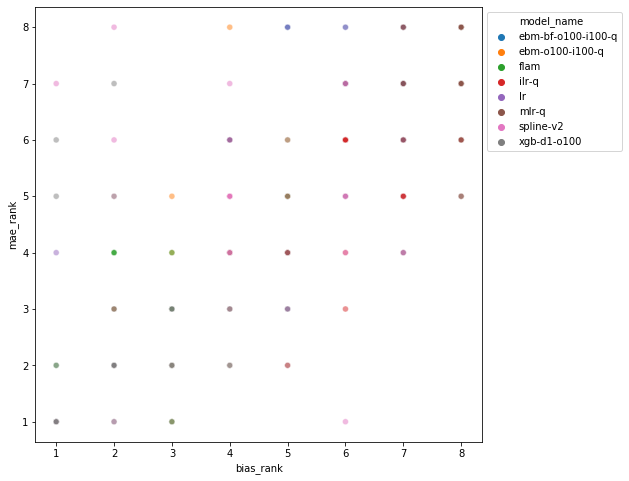

In [30]:
from scipy.stats import pearsonr

plt.figure(figsize=(8, 8))
sns.scatterplot(x='bias_rank', y='mae_rank', hue='model_name', data=bias_mae_df, alpha=0.5)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

corr = pearsonr(bias_mae_df['bias_rank'], bias_mae_df['mae_rank'])[0]
print('Pearson correlation', corr)

Pearson correlation 0.7519841269841269


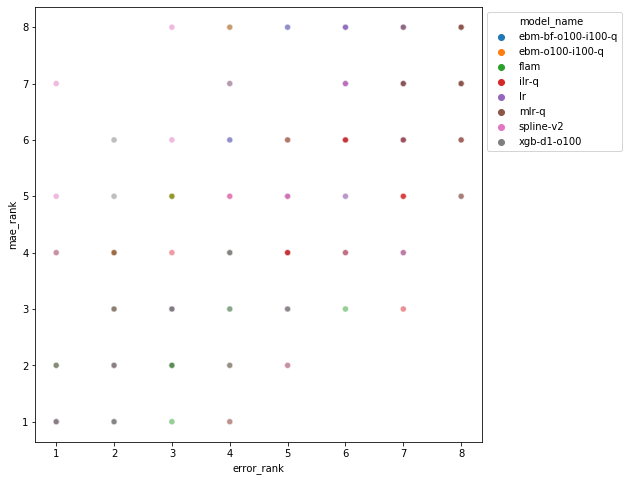

In [31]:
from scipy.stats import pearsonr

plt.figure(figsize=(8, 8))
sns.scatterplot(x='error_rank', y='mae_rank', hue='model_name', data=bias_mae_df, alpha=0.5)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

corr = pearsonr(bias_mae_df['error_rank'], bias_mae_df['mae_rank'])[0]
print('Pearson correlation', corr)

Pearson correlation 0.09821428571428571


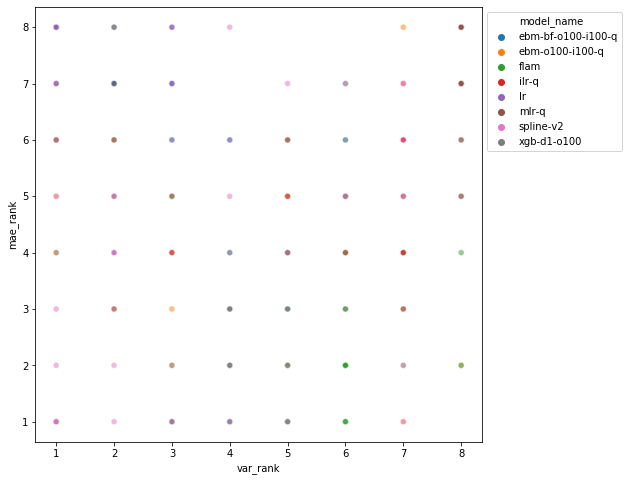

In [32]:
from scipy.stats import pearsonr

plt.figure(figsize=(8, 8))
sns.scatterplot(x='var_rank', y='mae_rank', hue='model_name', data=bias_mae_df, alpha=0.5)
plt.legend(loc="upper left", bbox_to_anchor=(1,1))

corr = pearsonr(bias_mae_df['var_rank'], bias_mae_df['mae_rank'])[0]
print('Pearson correlation', corr)

#### Rest of average graph MAE

In [148]:
total_ommision_mae = get_graph_ommision_mae_df(top_k=None)
total_ommision_mae = total_ommision_mae[[c for c in total_ommision_mae.columns if c not in ['rspline-v2', 'rspline-v2-s', 'spline-b']]]
new_total_ommision_mae = cal_statistics(total_ommision_mae, is_metric_higher_better=False)

display(new_total_ommision_mae.style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.262552,0.012440,0.075349,0.180261,0.133916,0.350577,0.278814,0.132643
ss_breast_b1_r1377_flam,0.644746,0.299190,0.419402,0.590179,0.497730,0.752740,0.687507,0.460582
ss_breast_b1_r1377_lr,0.252447,0.110251,0.180823,0.182929,0.117178,0.308602,0.261396,0.173075
ss_breast_b1_r1377_spline-v2,0.083515,0.050265,0.070009,0.034454,0.071157,0.052739,0.036855,0.048714
ss_breast_b1_r1377_xgb-d1-o100,0.227579,0.036311,0.100963,0.218261,0.158439,0.341955,0.283205,0.112876
ss_churn_b1_r1377_ebm-o100-i100-q,0.073664,0.021077,0.035254,0.042902,0.042779,0.048671,0.042762,0.034752
ss_churn_b1_r1377_flam,0.058422,0.034177,0.025629,0.036201,0.049998,0.036215,0.050244,0.030363
ss_churn_b1_r1377_lr,0.240852,0.206498,0.204144,0.213072,0.124347,0.216999,0.137895,0.205839
ss_churn_b1_r1377_spline-v2,0.242531,0.207350,0.200776,0.207870,0.080247,0.214190,0.027194,0.211306
ss_churn_b1_r1377_xgb-d1-o100,0.062268,0.034844,0.039566,0.051196,0.048522,0.045560,0.054554,0.026880


In [149]:
total_commision_mae = get_graph_commision_mae_df(top_k=None)
total_commision_mae = total_commision_mae[[c for c in total_commision_mae.columns if c not in ['rspline-v2', 'rspline-v2-s', 'spline-b']]]
new_total_commision_mae = cal_statistics(total_commision_mae, is_metric_higher_better=False)

display(new_total_commision_mae.style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.022997,0.100387,0.190633,0.114254,0.091875,0.008979,0.015729,0.079342
ss_breast_b1_r1377_flam,0.004949,0.099761,0.005615,0.116409,0.061046,0.011984,0.028644,0.010811
ss_breast_b1_r1377_lr,0.048778,0.145857,0.117811,0.151635,0.060353,0.018674,0.031451,0.113908
ss_breast_b1_r1377_spline-v2,0.030029,0.021896,0.066179,0.223304,0.056575,0.051482,0.014508,0.099299
ss_breast_b1_r1377_xgb-d1-o100,0.030442,0.367398,0.068649,0.176252,0.138943,0.016518,0.038972,0.040858
ss_churn_b1_r1377_ebm-o100-i100-q,0.023321,0.011844,0.019960,0.020146,0.080199,0.058687,0.047667,0.023588
ss_churn_b1_r1377_flam,0.017747,0.026133,0.009981,0.021958,0.074658,0.065809,0.065549,0.019684
ss_churn_b1_r1377_lr,0.027900,0.036669,0.023651,0.035193,0.013339,0.055586,0.014678,0.034296
ss_churn_b1_r1377_spline-v2,0.030022,0.036232,0.026880,0.030015,0.066452,0.061487,0.011609,0.039454
ss_churn_b1_r1377_xgb-d1-o100,0.013166,0.027352,0.020094,0.036104,0.094003,0.054381,0.109636,0.017133


#### Worse-case raw graph MSE

In [19]:
worst_mae_rank = total_mae.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_mae_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,0.649695,0.403709,0.298633,0.706589,0.558776,0.764724,0.716151,0.471393
churn,0.272554,0.243581,0.227795,0.248265,0.146698,0.275677,0.164190,0.250760
heart,0.486345,0.360380,0.160320,0.372349,0.407295,0.557633,0.357481,0.270664
mimicii,0.052606,0.046188,0.038179,0.084785,0.092380,0.090218,0.050712,0.038204
mimiciii,0.081513,0.076816,0.061357,0.102496,0.062172,0.099286,0.048956,0.062727
pneumonia,0.062134,0.050121,0.042256,0.052946,0.045384,0.055721,0.039884,0.044670
average,0.267474,0.196799,0.138090,0.261238,0.218784,0.307210,0.229562,0.189736
average_rank,7.000000,3.000000,1.000000,6.000000,4.000000,8.000000,5.000000,2.000000
avg_rank,6.33,3.83,1.67,6.00,4.33,7.50,3.00,3.33
avg_rank_rank,7.000000,4.000000,1.000000,6.000000,5.000000,8.000000,2.000000,3.000000


#### Worst case graph MSE and compare in rank / normalized score

##### Rank

In [150]:
graph_mae_rank = total_mae.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
display(cal_statistics(graph_mae_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,5.000000,1.000000,4.000000,6.000000,3.000000,8.000000,7.000000,2.000000
ss_breast_b1_r1377_flam,5.000000,1.000000,2.000000,6.000000,4.000000,8.000000,7.000000,3.000000
ss_breast_b1_r1377_lr,6.000000,2.000000,5.000000,8.000000,1.000000,7.000000,4.000000,3.000000
ss_breast_b1_r1377_spline-v2,4.000000,2.000000,6.000000,8.000000,5.000000,3.000000,1.000000,7.000000
ss_breast_b1_r1377_xgb-d1-o100,3.000000,8.000000,2.000000,7.000000,4.000000,6.000000,5.000000,1.000000
ss_churn_b1_r1377_ebm-o100-i100-q,6.000000,1.000000,2.000000,4.000000,8.000000,7.000000,5.000000,3.000000
ss_churn_b1_r1377_flam,5.000000,4.000000,1.000000,3.000000,8.000000,6.000000,7.000000,2.000000
ss_churn_b1_r1377_lr,7.000000,5.000000,3.000000,6.000000,1.000000,8.000000,2.000000,4.000000
ss_churn_b1_r1377_spline-v2,7.000000,5.000000,3.000000,4.000000,2.000000,8.000000,1.000000,6.000000
ss_churn_b1_r1377_xgb-d1-o100,4.000000,3.000000,2.000000,5.000000,7.000000,6.000000,8.000000,1.000000


In [151]:
worst_graph_mae_rank = graph_mae_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_mae_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,6.000000,8.000000,6.000000,8.000000,5.000000,8.000000,7.000000,7.000000
churn,7.000000,5.000000,3.000000,6.000000,8.000000,8.000000,8.000000,6.000000
heart,7.000000,4.000000,4.000000,6.000000,6.000000,8.000000,5.000000,7.000000
mimicii,6.000000,5.000000,4.000000,7.000000,8.000000,8.000000,5.000000,3.000000
mimiciii,6.000000,5.000000,3.000000,8.000000,7.000000,8.000000,6.000000,4.000000
pneumonia,8.000000,6.000000,4.000000,6.000000,8.000000,7.000000,7.000000,3.000000
average,6.666667,5.500000,4.000000,6.833333,7.000000,7.833333,6.333333,5.000000
average_rank,5.000000,3.000000,1.000000,6.000000,7.000000,8.000000,4.000000,2.000000
avg_rank,5.17,3.42,1.67,5.33,5.58,7.08,4.67,3.08
avg_rank_rank,5.000000,3.000000,1.000000,6.000000,7.000000,8.000000,4.000000,2.000000


In [152]:
graph_ommision_mae_rank = total_ommision_mae.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_ommision_mae_rank, 'graph ommision_mae rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_graph_ommision_mae_rank = graph_ommision_mae_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_ommision_mae_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,8.000000,4.000000,6.000000,5.000000,7.000000,8.000000,7.000000,3.000000
churn,8.000000,5.000000,3.000000,6.000000,6.000000,7.000000,7.000000,6.000000
heart,8.000000,4.000000,5.000000,7.000000,7.000000,7.000000,6.000000,3.000000
mimicii,6.000000,5.000000,4.000000,8.000000,8.000000,7.000000,4.000000,3.000000
mimiciii,8.000000,5.000000,4.000000,8.000000,6.000000,6.000000,2.000000,4.000000
pneumonia,8.000000,6.000000,5.000000,5.000000,7.000000,7.000000,1.000000,4.000000
average,7.666667,4.833333,4.500000,6.500000,6.833333,7.000000,4.500000,3.833333
average_rank,8.000000,4.000000,2.500000,5.000000,6.000000,7.000000,2.500000,1.000000
avg_rank,7.33,3.17,2.75,5.25,5.83,6.33,3.42,1.92
avg_rank_rank,8.000000,3.000000,2.000000,5.000000,6.000000,7.000000,4.000000,1.000000


In [153]:
graph_commision_mae_rank = total_commision_mae.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_commision_mae_rank, 'graph commision_mae rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_graph_commision_mae_rank = graph_commision_mae_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_commision_mae_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,3.000000,8.000000,8.000000,8.000000,6.000000,4.000000,5.000000,7.000000
churn,4.000000,7.000000,3.000000,6.000000,8.000000,8.000000,8.000000,6.000000
heart,5.000000,6.000000,6.000000,6.000000,6.000000,8.000000,3.000000,7.000000
mimicii,3.000000,5.000000,6.000000,7.000000,8.000000,8.000000,5.000000,4.000000
mimiciii,1.000000,4.000000,6.000000,7.000000,7.000000,8.000000,7.000000,5.000000
pneumonia,1.000000,5.000000,3.000000,6.000000,7.000000,7.000000,8.000000,4.000000
average,2.833333,5.833333,5.333333,6.666667,7.000000,7.166667,6.000000,5.500000
average_rank,1.000000,4.000000,2.000000,6.000000,7.000000,8.000000,5.000000,3.000000
avg_rank,1.33,4.33,3.92,5.33,5.92,6.50,4.75,3.92
avg_rank_rank,1.000000,4.000000,2.500000,6.000000,7.000000,8.000000,5.000000,2.500000


In [154]:
for metric in ['worst_graph_mae_rank', 'graph_mae_rank', 'graph_ommision_mae_rank', 'worst_graph_ommision_mae_rank', 'graph_commision_mae_rank', 'worst_graph_commision_mae_rank']:
    cal_statistics(eval(metric), is_metric_higher_better=False).to_csv('notebooks/figures/%s.csv' % metric)

##### Normalized score

In [155]:
graph_mae_normalized_score = total_mae.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
display(cal_statistics(graph_mae_normalized_score, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
ss_breast_b1_r1377_ebm-o100-i100-q,0.299950,1.000000,0.379257,0.263608,0.542153,0.000000,0.263500,0.598108
ss_breast_b1_r1377_flam,0.314481,1.000000,0.928739,0.158938,0.563048,0.000000,0.132796,0.801949
ss_breast_b1_r1377_lr,0.212301,0.499615,0.228809,0.000000,1.000000,0.046410,0.265655,0.303002
ss_breast_b1_r1377_spline-v2,0.698727,0.899232,0.589016,0.000000,0.629984,0.743899,1.000000,0.531719
ss_breast_b1_r1377_xgb-d1-o100,0.582813,0.000000,0.936484,0.036787,0.425351,0.180963,0.326162,1.000000
ss_churn_b1_r1377_ebm-o100-i100-q,0.288637,1.000000,0.752467,0.665466,0.000000,0.173450,0.361435,0.717747
ss_churn_b1_r1377_flam,0.544511,0.722623,1.000000,0.746764,0.000000,0.254164,0.099528,0.837876
ss_churn_b1_r1377_lr,0.028417,0.218071,0.332024,0.180285,1.000000,0.000000,0.889645,0.240550
ss_churn_b1_r1377_spline-v2,0.013187,0.135498,0.202731,0.159546,0.544505,0.000000,1.000000,0.105191
ss_churn_b1_r1377_xgb-d1-o100,0.738549,0.848705,0.869805,0.639809,0.180273,0.534617,0.000000,1.000000


In [156]:
worst_graph_mae_normalized_score = graph_mae_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_graph_mae_normalized_score, is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,0.212301,0.000000,0.228809,0.000000,0.425351,0.000000,0.132796,0.303002
churn,0.013187,0.135498,0.202731,0.159546,0.000000,0.000000,0.000000,0.105191
heart,0.248419,0.687368,0.868546,0.645660,0.523883,0.000000,0.697470,0.682188
mimicii,0.526066,0.611629,0.629278,0.065693,0.000000,0.000000,0.727451,0.738620
mimiciii,0.370094,0.452939,0.652269,0.000000,0.269541,0.000000,0.512037,0.701431
pneumonia,0.000000,0.400379,0.643928,0.267657,0.000000,0.063897,0.035587,0.602457
average,0.228344,0.381302,0.537593,0.189759,0.203129,0.010649,0.350890,0.522148
average_rank,5.000000,3.000000,1.000000,7.000000,6.000000,8.000000,4.000000,2.000000
avg_rank,5.58,4.00,1.83,5.25,5.83,7.00,4.17,2.33
avg_rank_rank,6.000000,3.000000,1.000000,5.000000,7.000000,8.000000,4.000000,2.000000


In [157]:
graph_ommision_mae_normalized_score = total_ommision_mae.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_ommision_mae_normalized_score, 'graph ommision_mae rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_graph_ommision_mae_normalized_score = graph_ommision_mae_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_graph_ommision_mae_normalized_score, is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,0.000000,0.677720,0.275283,0.358418,0.251878,0.000000,0.143828,0.644159
churn,0.000000,0.163380,0.193909,0.160965,0.256876,0.131614,0.217992,0.145006
heart,0.000000,0.582435,0.370843,0.126391,0.035780,0.134406,0.397346,0.825226
mimicii,0.238670,0.516839,0.564290,0.000000,0.000000,0.018278,0.811337,0.694655
mimiciii,0.000000,0.196668,0.447641,0.000000,0.351599,0.120334,0.881420,0.420380
pneumonia,0.000000,0.328450,0.418084,0.378816,0.622401,0.295279,1.000000,0.417506
average,0.039778,0.410915,0.378342,0.170765,0.253089,0.116652,0.575320,0.524488
average_rank,8.000000,3.000000,4.000000,6.000000,5.000000,7.000000,1.000000,2.000000
avg_rank,7.33,3.67,3.17,5.67,4.42,6.42,2.33,3.00
avg_rank_rank,8.000000,4.000000,3.000000,6.000000,5.000000,7.000000,1.000000,2.000000


In [158]:
graph_commision_mae_normalized_score = total_commision_mae.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_commision_mae_normalized_score, 'graph commision_mae rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_graph_commision_mae_normalized_score = graph_commision_mae_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_graph_commision_mae_normalized_score, is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-bf-o100-i100-q,ebm-o100-i100-q,flam,ilr-q,lr,mlr-q,spline-v2,xgb-d1-o100
breast,0.773587,0.000000,0.000000,0.000000,0.496705,0.822919,0.787414,0.283748
churn,0.655354,0.447769,0.721547,0.482719,0.000000,0.000000,0.000000,0.492277
heart,0.934479,0.808328,0.839787,0.910782,0.857595,0.000000,0.969082,0.683537
mimicii,0.848923,0.722739,0.707538,0.102273,0.000000,0.000000,0.552672,0.791774
mimiciii,1.000000,0.747761,0.794110,0.096797,0.315182,0.000000,0.202458,0.805767
pneumonia,1.000000,0.616192,0.855517,0.382632,0.138110,0.286378,0.000000,0.751168
average,0.868724,0.557131,0.653083,0.329200,0.301265,0.184883,0.418604,0.634712
average_rank,1.000000,4.000000,2.000000,6.000000,7.000000,8.000000,5.000000,3.000000
avg_rank,1.67,4.83,3.67,5.33,5.75,6.25,4.83,3.67
avg_rank_rank,1.000000,4.500000,2.500000,6.000000,7.000000,8.000000,4.500000,2.500000


In [160]:
for metric in ['worst_graph_mae_normalized_score', 'worst_graph_commision_mae_normalized_score', 'worst_graph_ommision_mae_normalized_score']:
    cal_statistics(eval(metric), is_metric_higher_better=True).to_csv('notebooks/figures/%s.csv' % metric)

#### Observe the graph of top feature

In [271]:
nr_ranks = []
nr_nss = []
ws_ranks = []
ws_nss = []
names = []
for top_k in [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, None]:
#     total_mae = get_graph_mae_df(top_k=top_k, d_name_filtered_fn=lambda x: 'support2cls' in x)
    total_mae = get_graph_mae_df(top_k=top_k)

    tmp = cal_statistics(total_mae, 'total_mae', is_metric_higher_better=False)
    nr_ranks.append(tmp.loc['avg_rank'].apply(lambda x: float(x)).to_dict())
    nr_nss.append(tmp.loc['avg_score'].apply(lambda x: float(x)).to_dict())

    graph_mae_rank = total_mae.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
    worst_case_rank = graph_mae_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
    ws_rank = cal_statistics(worst_case_rank, 'worst_case_rank', is_metric_higher_better=False).loc['average'].apply(lambda x: float(x)).to_dict()
    ws_ranks.append(ws_rank)

    graph_mae_normalized_score = total_mae.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
    worst_case_ns = graph_mae_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
    ws_ns = cal_statistics(worst_case_ns, 'worst_case_ns', is_metric_higher_better=True).loc['average'].apply(lambda x: float(x)).to_dict()
    ws_nss.append(ws_ns)
    
    names.append(top_k * 100 if top_k is not None else 100)

Text(0.5, 1.0, 'The ranking of "Average Graph MAE" under the top most important features')

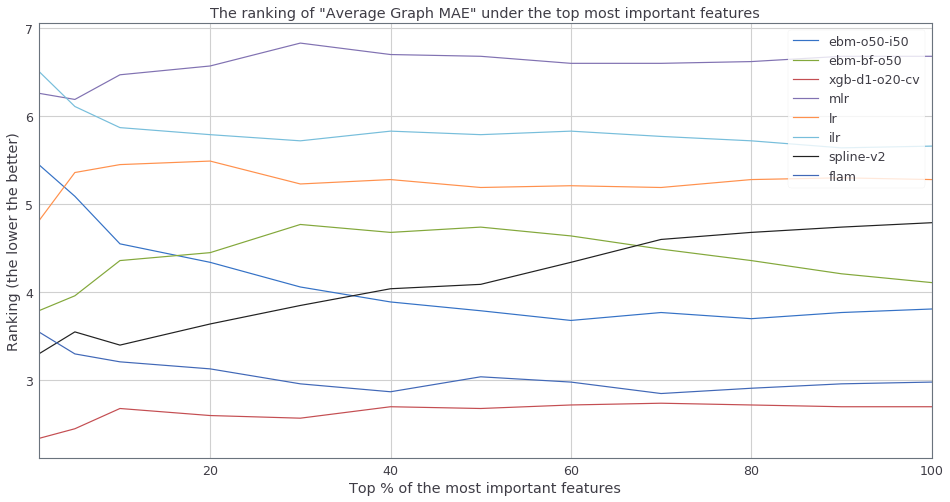

In [272]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(nr_ranks, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Ranking (the lower the better)')
ax.set_title('The ranking of "Average Graph MAE" under the top most important features')

Text(0.5, 1.0, 'The Normalized Score of "Average Graph MAE" under the top most important features')

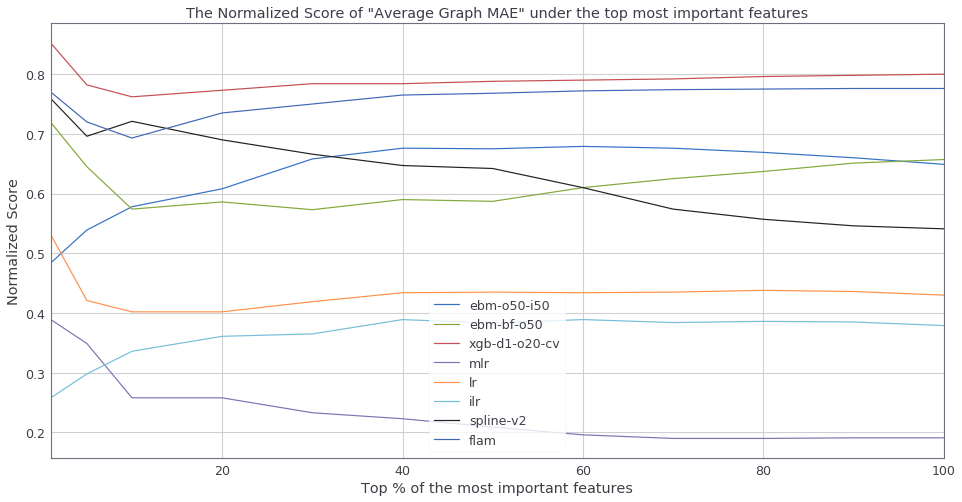

In [273]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(nr_nss, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Normalized Score')
ax.set_title('The Normalized Score of "Average Graph MAE" under the top most important features')

Text(0.5, 1.0, 'The ranking of "Worst Graph MAE" under the top most important features')

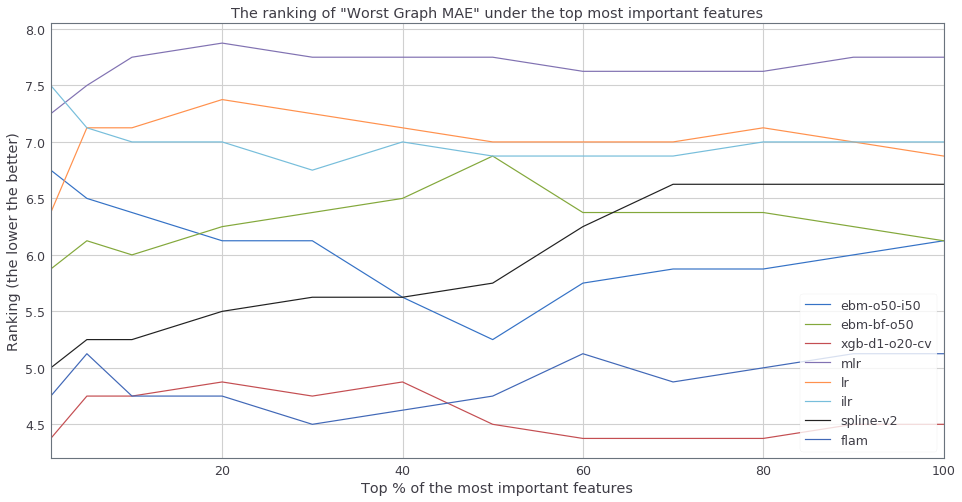

In [274]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(ws_ranks, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Ranking (the lower the better)')
ax.set_title('The ranking of "Worst Graph MAE" under the top most important features')

Text(0.5, 1.0, 'The Normalized Score of "Worst Graph MAE" under the top most important features')

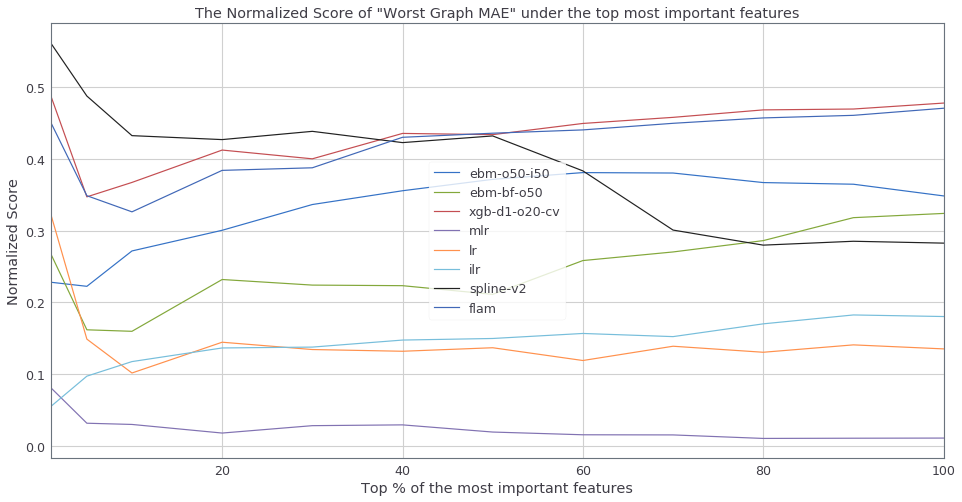

In [275]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(ws_nss, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Normalized Score')
ax.set_title('The Normalized Score of "Worst Graph MAE" under the top most important features')

#### TODO: graph of rank vs. top number of features for the graph MSE

In [ ]:
# top_k = 30

for top_k in [1, 2, 5, 10, 20, 30, 50]:
    print(top_k)
    # The total graph mse
    total_mse = copy.deepcopy(mse)
    for d_name, v2 in total_mse.items():
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name

        for m_name, v1 in v2.items():
            arr = [v1[k1] for k1 in v1 if k1 in feat_rank.iloc[:top_k].values]
            total_mse[d_name][m_name] = np.mean(arr)

    total_mse = pd.DataFrame(total_mse).T
    new_total_mse = cal_statistics(total_mse, 'graph mse', is_metric_higher_better=False)

    display(new_total_mse.style.apply(highlight_min_max, axis=1))

In [ ]:
# top_k = 30

for top_k in [1, 2, 5, 10, 20, 30, 50]:
    print(top_k)
    # The total graph mse
    total_mse = copy.deepcopy(mse)
    for d_name, v2 in total_mse.items():
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name

        for m_name, v1 in v2.items():
            arr = [v1[k1] for k1 in v1 if k1 in feat_rank.iloc[:top_k].values]
            total_mse[d_name][m_name] = np.mean(arr)

    total_mse = pd.DataFrame(total_mse).T
    new_total_mse = cal_statistics(total_mse, 'graph mse', is_metric_higher_better=False)

    display(new_total_mse.style.apply(highlight_min_max, axis=1))

### Test AUC v.s. Graph MAE

#### Raw  

ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
mlr
lr
ilr
spline-v2
flam


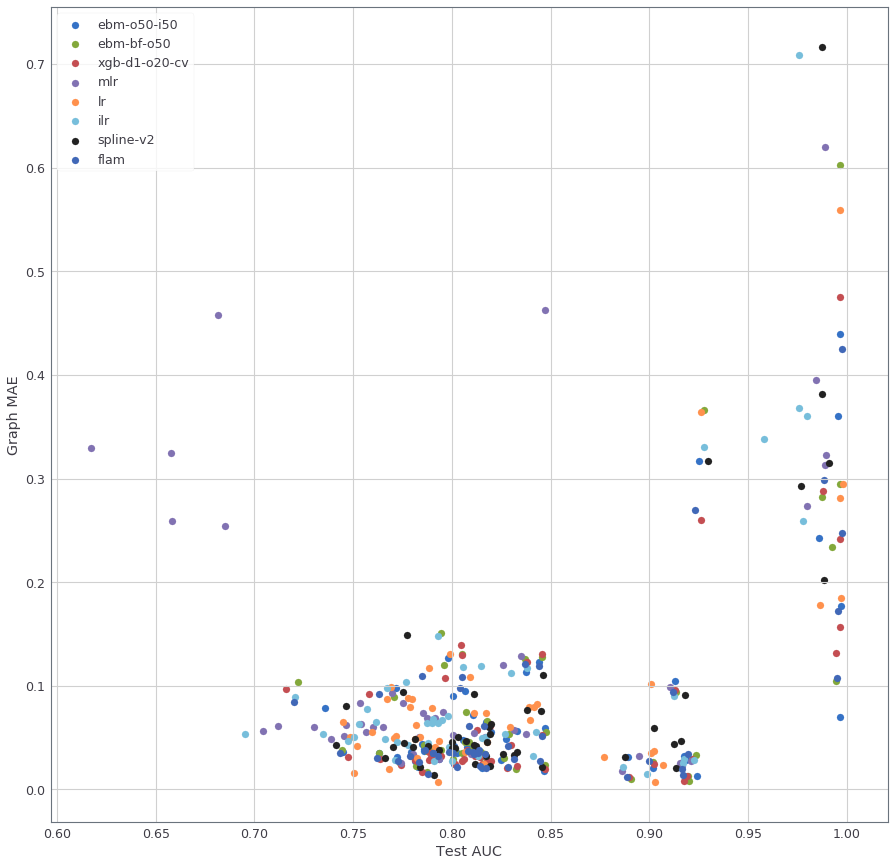

In [277]:
from vis_utils import extract_mean

fig, ax = plt.subplots(figsize=(15, 15))

for model_name in total_mae.columns:
    print(model_name)
    xs, ys = [], []
    for d_name in total_mae.index:
        x = float(extract_mean(all_tables['test_auc'].loc[d_name, model_name]))
        xs.append(x)
        y = new_total_mae.iloc[:-6].loc[d_name, model_name]
        ys.append(y)
    ax.scatter(xs, ys, label=model_name, s=50)

ax.set_xlabel('Test AUC')
ax.set_ylabel('Graph MAE')
ax.legend()
# ax.plot([0, 9], [0, 9], '-', color='gray', alpha=0.3)

#### Rank

In [278]:
from vis_utils import rank, extract_mean

test_auc_rank = all_tables['test_auc'].apply(rank, axis=1)
test_auc_rank

model_name,ebm-bf-o50,ebm-o50-i50,flam,ilr,lr,mlr,spline-v2,xgb-d1-o20-cv
ss_adult_b1_r1377_ebm-bf-o50,1.0,2.0,5.0,4.0,8.0,6.0,7.0,3.0
ss_adult_b1_r1377_ebm-o50-i50,2.0,1.0,6.0,3.0,8.0,5.0,7.0,4.0
ss_adult_b1_r1377_flam,1.0,3.0,4.0,6.0,8.0,7.0,5.0,2.0
ss_adult_b1_r1377_lr,5.0,4.0,6.0,7.0,1.0,8.0,2.0,3.0
ss_adult_b1_r1377_spline-v2,2.0,4.0,6.0,5.0,8.0,7.0,1.0,3.0
ss_adult_b1_r1377_xgb-d1-o20-cv,1.0,3.0,5.0,4.0,8.0,7.0,6.0,2.0
ss_breast_b1_r1377_ebm-bf-o50,4.0,1.0,3.0,8.0,2.0,7.0,6.0,5.0
ss_breast_b1_r1377_ebm-o50-i50,5.0,2.0,1.0,8.0,3.5,6.0,7.0,3.5
ss_breast_b1_r1377_flam,5.0,2.0,1.0,8.0,3.5,6.0,7.0,3.5
ss_breast_b1_r1377_lr,3.0,5.0,1.0,8.0,4.0,6.0,7.0,2.0


In [279]:
graph_mae_rank = new_total_mae.iloc[:-6].apply(rank, is_metric_higher_better=False, axis=1).sort_index()
graph_mae_rank

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,6.0,1.0,2.0,4.0,7.0,5.0,8.0,3.0
ss_adult_b1_r1377_ebm-o50-i50,1.0,6.0,5.0,3.0,2.0,4.0,8.0,7.0
ss_adult_b1_r1377_flam,7.0,1.0,3.0,4.0,6.0,5.0,8.0,2.0
ss_adult_b1_r1377_lr,3.0,5.0,4.0,7.0,1.0,2.0,8.0,6.0
ss_adult_b1_r1377_spline-v2,8.0,4.0,5.0,6.0,7.0,2.0,1.0,3.0
ss_adult_b1_r1377_xgb-d1-o20-cv,5.0,2.0,1.0,4.0,7.0,6.0,8.0,3.0
ss_breast_b1_r1377_ebm-bf-o50,4.0,1.0,3.0,8.0,5.0,7.0,6.0,2.0
ss_breast_b1_r1377_ebm-o50-i50,1.0,5.0,2.0,6.0,4.0,7.0,8.0,3.0
ss_breast_b1_r1377_flam,2.0,5.0,3.0,6.0,4.0,7.0,8.0,1.0
ss_breast_b1_r1377_lr,2.0,4.0,5.0,3.0,1.0,8.0,6.0,7.0


ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
mlr
lr
ilr
spline-v2
flam


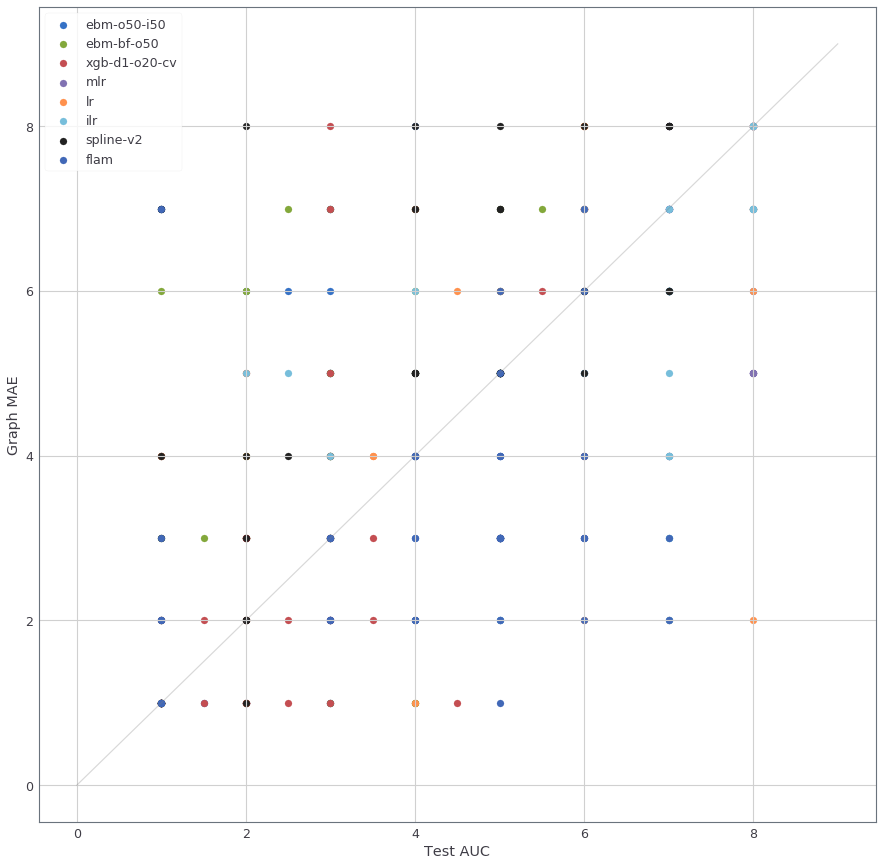

In [281]:
fig, ax = plt.subplots(figsize=(15, 15))

for model_name in total_mae.columns:
    print(model_name)
    xs, ys = [], []
    for d_name in total_mae.index:
        x = float(test_auc_rank.loc[d_name, model_name])
        xs.append(x)
        y = graph_mae_rank.loc[d_name, model_name]
        ys.append(y)
    ax.scatter(xs, ys, label=model_name, s=50)

ax.set_xlabel('Test AUC')
ax.set_ylabel('Graph MAE')
ax.legend()
ax.plot([0, 9], [0, 9], '-', color='gray', alpha=0.3)

### Normalized score

In [282]:
test_auc_normalized_score = all_tables['test_auc'].apply(normalized_score, axis=1)
test_auc_normalized_score

model_name,ebm-bf-o50,ebm-o50-i50,flam,ilr,lr,mlr,spline-v2,xgb-d1-o20-cv
ss_adult_b1_r1377_ebm-bf-o50,1.000000,0.880208,0.838542,0.854167,0.000000,0.828125,0.609375,0.875000
ss_adult_b1_r1377_ebm-o50-i50,0.982353,1.000000,0.729412,0.911765,0.000000,0.829412,0.652941,0.858824
ss_adult_b1_r1377_flam,1.000000,0.899281,0.841727,0.697842,0.000000,0.683453,0.791367,0.935252
ss_adult_b1_r1377_lr,0.860759,0.911392,0.632911,0.481013,1.000000,0.000000,0.949367,0.924051
ss_adult_b1_r1377_spline-v2,0.984733,0.938931,0.854962,0.893130,0.000000,0.740458,1.000000,0.954198
ss_adult_b1_r1377_xgb-d1-o20-cv,1.000000,0.918605,0.825581,0.883721,0.000000,0.767442,0.779070,0.970930
ss_breast_b1_r1377_ebm-bf-o50,0.860104,1.000000,0.891192,0.000000,0.984456,0.326425,0.544041,0.854922
ss_breast_b1_r1377_ebm-o50-i50,0.945205,0.963470,1.000000,0.000000,0.958904,0.598174,0.538813,0.958904
ss_breast_b1_r1377_flam,0.945205,0.963470,1.000000,0.000000,0.958904,0.598174,0.538813,0.958904
ss_breast_b1_r1377_lr,0.973770,0.911475,1.000000,0.000000,0.940984,0.727869,0.613115,0.986885


In [283]:
graph_mae_normalized_score = new_total_mae.iloc[:-6].apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
graph_mae_normalized_score

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,0.318917,1.000000,0.996297,0.611606,0.254297,0.505713,0.000000,0.853794
ss_adult_b1_r1377_ebm-o50-i50,1.000000,0.739487,0.783015,0.810813,0.855526,0.795851,0.000000,0.719774
ss_adult_b1_r1377_flam,0.022082,1.000000,0.905300,0.631286,0.023478,0.480724,0.000000,0.915559
ss_adult_b1_r1377_lr,0.743834,0.626242,0.665039,0.520542,1.000000,0.849022,0.000000,0.615582
ss_adult_b1_r1377_spline-v2,0.000000,0.126558,0.104842,0.068651,0.038333,0.169779,1.000000,0.128600
ss_adult_b1_r1377_xgb-d1-o20-cv,0.548411,0.981304,1.000000,0.631609,0.286219,0.507226,0.000000,0.804029
ss_breast_b1_r1377_ebm-bf-o50,0.748984,1.000000,0.905645,0.000000,0.722275,0.466821,0.663212,0.988585
ss_breast_b1_r1377_ebm-o50-i50,1.000000,0.279538,0.448951,0.221043,0.323333,0.045781,0.000000,0.433021
ss_breast_b1_r1377_flam,0.950710,0.388315,0.826093,0.329802,0.540557,0.026201,0.000000,1.000000
ss_breast_b1_r1377_lr,0.592587,0.344956,0.312908,0.401789,1.000000,0.000000,0.280937,0.244858


In [288]:
test_mse_normalized_score = all_tables['test_mse'].apply(normalized_score, is_metric_higher_better=False, axis=1)
test_logloss_normalized_score = all_tables['test_logloss'].apply(normalized_score, is_metric_higher_better=False, axis=1)

In [289]:
df_scatter_dicts = []
for model_name in graph_mae_normalized_score.columns:
    print(model_name)
    for d_name in graph_mae_normalized_score.index:
        df_scatter_dict = {}
        df_scatter_dict['d_name'] = d_name
        df_scatter_dict['model_name'] = model_name
        df_scatter_dict['gt_model_name'] = d_name.split('_')[-1]
        
        x = float(test_auc_normalized_score.loc[d_name, model_name])
        df_scatter_dict['test_auc_normalized_score'] = x
        y = graph_mae_normalized_score.loc[d_name, model_name]
        df_scatter_dict['graph_mae_normalized_score'] = y
        z = float(test_mse_normalized_score.loc[d_name, model_name])
        df_scatter_dict['test_mse_normalized_score'] = z

        df_scatter_dict['test_logloss_normalized_score'] = float(test_logloss_normalized_score.loc[d_name, model_name])
        
        df_scatter_dicts.append(df_scatter_dict)

df_scatter = pd.DataFrame(df_scatter_dicts)
df_scatter

ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
mlr
lr
ilr
spline-v2
flam


,d_name,model_name,gt_model_name,test_auc_normalized_score,graph_mae_normalized_score,test_mse_normalized_score,test_logloss_normalized_score
0,ss_adult_b1_r1377_ebm-bf-o50,ebm-o50-i50,ebm-bf-o50,0.880208,0.318917,0.941382,0.862974
1,ss_adult_b1_r1377_ebm-o50-i50,ebm-o50-i50,ebm-o50-i50,1.000000,1.000000,1.000000,1.000000
2,ss_adult_b1_r1377_flam,ebm-o50-i50,flam,0.899281,0.022082,0.932692,0.924171
3,ss_adult_b1_r1377_lr,ebm-o50-i50,lr,0.911392,0.743834,0.881773,0.893443
4,ss_adult_b1_r1377_spline-v2,ebm-o50-i50,spline-v2,0.938931,0.000000,0.978589,0.943231
5,ss_adult_b1_r1377_xgb-d1-o20-cv,ebm-o50-i50,xgb-d1-o20-cv,0.918605,0.548411,0.980691,0.930818
6,ss_breast_b1_r1377_ebm-bf-o50,ebm-o50-i50,ebm-bf-o50,1.000000,0.748984,1.000000,1.000000
7,ss_breast_b1_r1377_ebm-o50-i50,ebm-o50-i50,ebm-o50-i50,0.963470,1.000000,0.910889,0.854776
8,ss_breast_b1_r1377_flam,ebm-o50-i50,flam,0.963470,0.950710,0.910889,0.854776
9,ss_breast_b1_r1377_lr,ebm-o50-i50,lr,0.911475,0.592587,0.810032,0.688333


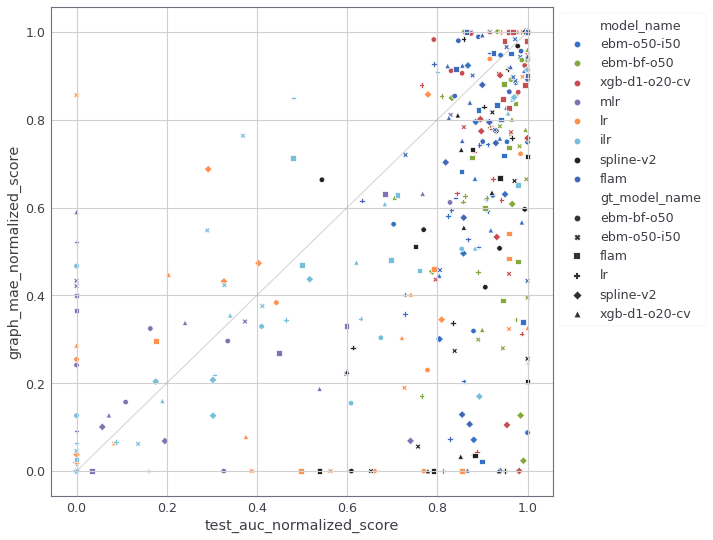

In [286]:
fig, ax = plt.subplots(figsize=(9, 9))

sns.scatterplot(x="test_auc_normalized_score", y="graph_mae_normalized_score", hue='model_name', style='gt_model_name', data=df_scatter, ax=ax)
ax.plot([0, 1], [0, 1], '-', color='gray', alpha=0.3)
ax.legend(loc="upper left", bbox_to_anchor=(1,1))

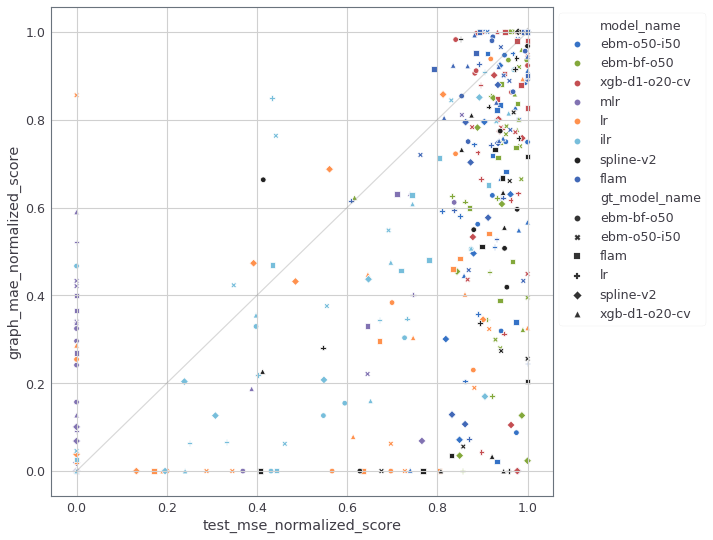

In [287]:
fig, ax = plt.subplots(figsize=(9, 9))

sns.scatterplot(x="test_mse_normalized_score", y="graph_mae_normalized_score", hue='model_name', style='gt_model_name', data=df_scatter, ax=ax)
ax.plot([0, 1], [0, 1], '-', color='gray', alpha=0.3)
ax.legend(loc="upper left", bbox_to_anchor=(1,1))

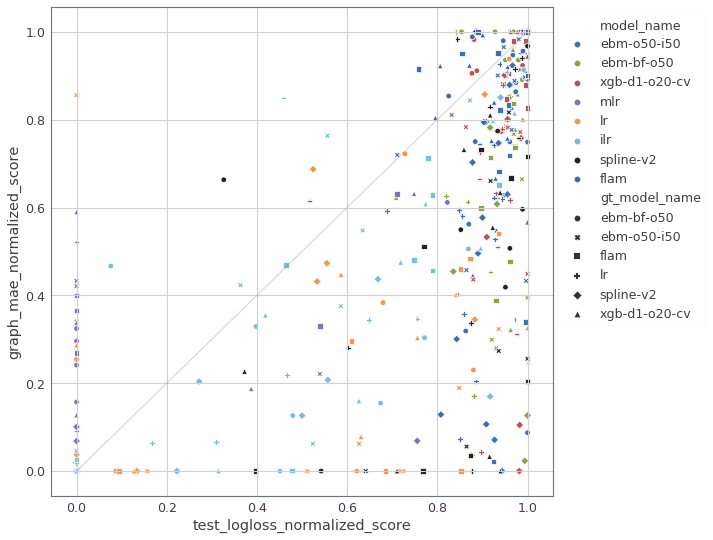

In [290]:
fig, ax = plt.subplots(figsize=(9, 9))

sns.scatterplot(x="test_logloss_normalized_score", y="graph_mae_normalized_score", hue='model_name', style='gt_model_name', data=df_scatter, ax=ax)
ax.plot([0, 1], [0, 1], '-', color='gray', alpha=0.3)
ax.legend(loc="upper left", bbox_to_anchor=(1,1))

### (Think) Summarize the above messy plot by taking worst l2 distance?

In [300]:
worst_graph_mae_rank = df_scatter.set_index('d_name').groupby(lambda x: x.split('_')[1]).graph_mae_normalized_score.agg(cal_worst_case, rank=-1)
worst_graph_mae_rank

TypeError: '<' not supported between instances of 'float' and 'str'

In [ ]:
fig, ax = plt.subplots(figsize=(9, 9))

sns.scatterplot(x="test_logloss_normalized_score", y="graph_mae_normalized_score", hue='model_name', style='gt_model_name', data=df_scatter, ax=ax)
ax.plot([0, 1], [0, 1], '-', color='gray', alpha=0.3)
ax.legend(loc="upper left", bbox_to_anchor=(1,1))

## Caculate the graph metrics
- Show by the mean of all the dfs, is it the right thing? (Like it already did a outer bagging). But if not, no error bar....

In [91]:
# calculate the importance of the features for gnd_truth model
for d_name, df_per_datasets in all_dfs.items():
    all_dfs[d_name]['gnd_truth']['importance'] = df_per_datasets['gnd_truth'].apply(
        lambda row: -1 if row.feat_name == 'offset' else np.average(np.abs(row.y), weights=row.sample_weights), axis=1)

### MSE of the graph, weighted by the samples
1. Here we sum over all the errors. But in the table, we should normalize by number_of_examples and num_features

In [92]:
mses = {}
ommisions = {}
commisions = {}

for d_name, df_per_datasets in all_dfs.items():
    gt_lookup = df_per_datasets['gnd_truth'].set_index('feat_name')
    
    mses[d_name] = {}
    ommisions[d_name] = {}
    commisions[d_name] = {}
    for model_name, model_df in df_per_datasets.items():
        if model_name in ['gnd_truth', 'rspline']:
            continue

        mses[d_name][model_name] = {}
        ommisions[d_name][model_name] = {}
        commisions[d_name][model_name] = {}
            
        for _, row in model_df[model_df.feat_name != 'offset'].iterrows():
            gt_row = gt_lookup.loc[row.feat_name]
            
            error = (row.y - gt_row.y) ** 2
            ''' If |model's score| < |true score|: ommision error '''
            ''' If |model's score| > |true score|: commision error '''
            selector = (np.abs(row.y) < np.abs(gt_row.y))
            ommision = np.dot(error[selector], gt_row.sample_weights[selector])
            commision = np.dot(error[~selector], gt_row.sample_weights[~selector])
            
            all_mse = np.dot(error, gt_row.sample_weights)
            
            mses[d_name][model_name][row.feat_name] = all_mse
            ommisions[d_name][model_name][row.feat_name] = ommision
            commisions[d_name][model_name][row.feat_name] = commision

KeyError: 'gender_Female'

In [217]:
commisions['ss_adult_b1_r1377_ebm-bf-o50']['ebm-o50-i50']['Age'] + ommisions['ss_adult_b1_r1377_ebm-bf-o50']['ebm-o50-i50']['Age'], mses['ss_adult_b1_r1377_ebm-bf-o50']['ebm-o50-i50']['Age']

(1005.74011466579, 1005.7401146657901)

In [218]:
def get_graph_mse_df(top_k=None, d_name_filtered_fn=None):    
    return get_graph_metric_df(top_k=top_k, d_name_filtered_fn=d_name_filtered_fn, metric=mses)

def get_graph_ommision_df(top_k=None, d_name_filtered_fn=None):    
    return get_graph_metric_df(top_k=top_k, d_name_filtered_fn=d_name_filtered_fn, metric=ommisions)

def get_graph_commision_df(top_k=None, d_name_filtered_fn=None):    
    return get_graph_metric_df(top_k=top_k, d_name_filtered_fn=d_name_filtered_fn, metric=commisions)

def get_graph_metric_df(top_k=None, d_name_filtered_fn=None, metric=mses):    
    # The total graph mse
#     total_mse = copy.deepcopy(mse)
    total_metric = {}
    d_names = metric.keys()
    if d_name_filtered_fn is not None:
        d_names = pd.Series(iter(d_names))
        d_names = d_names[d_names.apply(d_name_filtered_fn)].values
    
    for d_name in d_names:
        methods_metric = metric[d_name]
        
        total_metric[d_name] = {}
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name
        num_examples = all_dfs[d_name]['gnd_truth'].sample_weights.iloc[1].sum() # avoid "offset" feature
        
        top_num = top_k
        if top_k is not None and 0. <= top_k < 1.:
            top_num = int(np.ceil(top_k * len(feat_rank)))

        for m_name, feat_metric_dict in methods_metric.items():
            arr = list(feat_metric_dict.values()) if top_k is None else [feat_metric_dict[k1] for k1 in feat_metric_dict if k1 in feat_rank.iloc[:top_num].values]
            total_metric[d_name][m_name] = np.mean(arr) / num_examples  # Avereae across number of features and number of examples

    total_metric = pd.DataFrame(total_metric).T
    return total_metric

def cal_worst_case(col, rank=0):
    # Remove the dataset generated by the same model
    retained_idxes = [dname for dname in col.index if not dname.endswith(col.name)]
    filtered = col.loc[retained_idxes]
    
    # Take the case corresponding to the thing
    return np.sort(filtered)[rank]

#### Average graph MSE

In [219]:
total_mse = get_graph_mse_df(top_k=None)
total_mse = total_mse[[c for c in new_total_mse.columns if c not in ['rspline-v2', 'rspline-v2-s', 'spline-b']]]
new_total_mse = cal_statistics(total_mse, 'graph mse', is_metric_higher_better=False)

display(new_total_mse.style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,0.0119443,0.00171704,0.00271548,0.00611262,0.0398177,0.00811612,0.0362049,0.00516207
ss_adult_b1_r1377_ebm-o50-i50,0.00576651,0.0255438,0.0257293,0.0241466,0.0443665,0.0204157,0.127811,0.029332
ss_adult_b1_r1377_flam,0.00940153,0.00101337,0.00139828,0.0031992,0.037035,0.0047996,0.0234753,0.0016962
ss_adult_b1_r1377_lr,0.0323043,0.0346973,0.0302935,0.0452466,0.00120107,0.0322874,0.0595637,0.03863
ss_adult_b1_r1377_spline-v2,0.156833,0.144814,0.141834,0.153281,0.16511,0.1387,0.0452861,0.154162
ss_adult_b1_r1377_xgb-d1-o20-cv,0.00781639,0.0037869,0.00330005,0.0072368,0.0445376,0.00844474,0.0286967,0.00640367
ss_breast_b1_r1377_ebm-bf-o50,0.0606322,0.03433,0.0407637,0.319763,0.0867012,0.126021,0.105154,0.0339533
ss_breast_b1_r1377_ebm-o50-i50,0.00801696,0.142288,0.103157,0.170284,0.156627,0.225567,0.24758,0.107545
ss_breast_b1_r1377_flam,0.342664,0.673405,0.420254,0.687769,0.60208,0.907548,0.965262,0.325898
ss_breast_b1_r1377_lr,0.133493,0.198452,0.195217,0.183022,0.084203,0.24548,0.227533,0.20125


In [220]:
total_ommision = get_graph_ommision_df(top_k=None)
total_ommision = total_ommision[[c for c in total_ommision.columns if c not in ['rspline-v2', 'rspline-v2-s', 'spline-b']]]
new_total_ommision = cal_statistics(total_ommision, 'graph ommision', is_metric_higher_better=False)

display(new_total_ommision.style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,0.00648112,0.00155543,0.00230425,0.00351116,0.0145783,0.00408681,0.00508567,0.00474995
ss_adult_b1_r1377_ebm-o50-i50,0.00416941,0.0220842,0.0222492,0.0189799,0.0234719,0.0156699,0.00857941,0.026023
ss_adult_b1_r1377_flam,0.00570123,0.000924299,0.00103042,0.00116269,0.00591978,0.00188028,0.00183867,0.00159135
ss_adult_b1_r1377_lr,0.0309548,0.0329883,0.028691,0.0356473,0.000305711,0.0316168,0.000945409,0.0370171
ss_adult_b1_r1377_spline-v2,0.151597,0.143179,0.138679,0.148455,0.155134,0.134691,0.00928976,0.152875
ss_adult_b1_r1377_xgb-d1-o20-cv,0.00178241,0.000467905,0.000161498,0.00191332,0.00696881,0.00175455,0.000866506,0.00269643
ss_breast_b1_r1377_ebm-bf-o50,0.0383985,0.0307558,0.0157769,0.0324077,0.0695681,0.0869774,0.098287,0.0250257
ss_breast_b1_r1377_ebm-o50-i50,0.00104873,0.141572,0.089346,0.116173,0.0965529,0.208568,0.245567,0.0811116
ss_breast_b1_r1377_flam,0.307609,0.67195,0.418547,0.637468,0.567254,0.885204,0.96168,0.325259
ss_breast_b1_r1377_lr,0.0915013,0.180373,0.134773,0.155323,0.0638959,0.206305,0.221961,0.13936


In [221]:
total_commision = get_graph_commision_df(top_k=None)
total_commision = total_commision[[c for c in total_commision.columns if c not in ['rspline-v2', 'rspline-v2-s', 'spline-b']]]
new_total_commision = cal_statistics(total_commision, 'graph commision', is_metric_higher_better=False)

display(new_total_commision.style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,0.00546319,0.000161612,0.000411231,0.00260146,0.0252394,0.00402932,0.0311193,0.000412124
ss_adult_b1_r1377_ebm-o50-i50,0.0015971,0.00345969,0.00348012,0.00516668,0.0208946,0.00474579,0.119231,0.00330905
ss_adult_b1_r1377_flam,0.0037003,8.90708e-05,0.000367865,0.00203651,0.0311152,0.00291932,0.0216366,0.000104849
ss_adult_b1_r1377_lr,0.00134947,0.00170892,0.00160252,0.00959931,0.000895355,0.000670585,0.0586183,0.00161292
ss_adult_b1_r1377_spline-v2,0.00523597,0.00163503,0.00315546,0.00482525,0.00997603,0.00400892,0.0359964,0.00128751
ss_adult_b1_r1377_xgb-d1-o20-cv,0.00603397,0.00331899,0.00313856,0.00532347,0.0375688,0.00669019,0.0278302,0.00370724
ss_breast_b1_r1377_ebm-bf-o50,0.0222337,0.00357426,0.0249867,0.287355,0.0171331,0.0390433,0.0068669,0.00892753
ss_breast_b1_r1377_ebm-o50-i50,0.00696822,0.000716206,0.0138108,0.0541104,0.060074,0.0169992,0.00201225,0.0264329
ss_breast_b1_r1377_flam,0.0350549,0.0014548,0.0017064,0.050301,0.0348256,0.022344,0.00358138,0.000639439
ss_breast_b1_r1377_lr,0.041992,0.0180787,0.060444,0.0276995,0.0203071,0.0391745,0.00557213,0.0618893


#### Worst case graph MSE and compare in rank / normalized score

##### Rank

In [222]:
graph_mse_rank = total_mse.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
display(cal_statistics(graph_mse_rank, 'graph mse rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,6,1,2,4,8,5,7,3
ss_adult_b1_r1377_ebm-o50-i50,1,4,5,3,7,2,8,6
ss_adult_b1_r1377_flam,6,1,2,4,8,5,7,3
ss_adult_b1_r1377_lr,4,5,2,7,1,3,8,6
ss_adult_b1_r1377_spline-v2,7,4,3,5,8,2,1,6
ss_adult_b1_r1377_xgb-d1-o20-cv,5,2,1,4,8,6,7,3
ss_breast_b1_r1377_ebm-bf-o50,4,2,3,8,5,7,6,1
ss_breast_b1_r1377_ebm-o50-i50,1,4,2,6,5,7,8,3
ss_breast_b1_r1377_flam,2,5,3,6,4,7,8,1
ss_breast_b1_r1377_lr,2,5,4,3,1,8,7,6


In [223]:
worst_graph_mse_rank = graph_mse_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_mse_rank, 'worst graph mse rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
adult,7,5,5,7,8,6,8,6
breast,7,5,4,8,5,8,8,6
churn,7,6,7,8,8,6,8,4
heart,4,6,7,8,7,6,7,3
mimicii,5,5,3,8,8,7,5,6
mimiciii,5,6,3,8,7,8,6,4
pneumonia,6,6,3,8,7,8,8,4
support2cls,5,6,3,8,7,7,5,3
average,5.7500,5.6250,4.3750,7.8750,7.1250,7.0000,6.8750,4.5000
average_rank,4,3,1,8,7,6,5,2


In [224]:
graph_ommision_rank = total_ommision.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_ommision_rank, 'graph ommision rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_graph_ommision_rank = graph_ommision_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_ommision_rank, 'worst graph ommision rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
adult,7,6,6,7,8,6,6,8
breast,5,6,3,8,6,7,8,4
churn,7,7,8,8,8,8,8,6
heart,4,7,3,8,8,7,7,4
mimicii,4,5,3,8,8,8,5,6
mimiciii,5,6,3,7,6,8,3,4
pneumonia,7,7,3,6,8,8,1,4
support2cls,5,8,3,8,8,8,2,4
average,5.5000,6.5000,4.0000,7.5000,7.5000,7.5000,5.0000,5.0000
average_rank,4,5,1,7,7,7,2.5,2.5


In [225]:
graph_commision_rank = total_commision.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_commision_rank, 'graph commision rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_graph_commision_rank = graph_commision_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_commision_rank, 'worst graph commision rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
adult,6,6,4,7,8,6,8,5
breast,8,4,7,8,8,7,4,8
churn,6,4,7,8,8,6,8,5
heart,6,5,7,8,6,5,3,6
mimicii,6,3,4,8,8,7,5,5
mimiciii,4,2,6,8,7,6,7,5
pneumonia,5,3,4,8,8,6,8,2
support2cls,5,3,4,8,7,7,7,3
average,5.7500,3.7500,5.3750,7.8750,7.5000,6.2500,6.2500,4.8750
average_rank,4,1,3,8,7,5.5,5.5,2


##### Normalized score

In [226]:
graph_mse_normalized_score = total_mse.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
display(cal_statistics(graph_mse_normalized_score, 'graph mse rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_adult_b1_r1377_ebm-bf-o50,0.731573,1,0.973795,0.884633,0,0.832048,0.0948224,0.909581
ss_adult_b1_r1377_ebm-o50-i50,1,0.83795,0.83643,0.849399,0.683721,0.879968,0,0.80691
ss_adult_b1_r1377_flam,0.767135,1,0.989314,0.939319,0,0.89489,0.376433,0.981044
ss_adult_b1_r1377_lr,0.467071,0.426068,0.501522,0.245313,1,0.467359,0,0.358683
ss_adult_b1_r1377_spline-v2,0.0690768,0.169379,0.194251,0.0987207,0,0.220404,1,0.0913632
ss_adult_b1_r1377_xgb-d1-o20-cv,0.89048,0.988194,1,0.904535,0,0.875243,0.384138,0.924738
ss_breast_b1_r1377_ebm-bf-o50,0.906655,0.998682,0.976172,0,0.815444,0.677872,0.750881,1
ss_breast_b1_r1377_ebm-o50-i50,1,0.439514,0.60286,0.322654,0.379662,0.0918851,0,0.584545
ss_breast_b1_r1377_flam,0.973778,0.45648,0.852423,0.434014,0.568037,0.0902676,0,1
ss_breast_b1_r1377_lr,0.694374,0.291595,0.311655,0.387268,1,0,0.11128,0.274248


In [227]:
worst_case_ns = graph_mse_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_case_ns, 'worst graph mse rank', is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
adult,0.0690768,0.169379,0.194251,0.0987207,0,0.220404,0,0.0913632
breast,0.052038,0.291595,0.311655,0,0.311667,0,0,0.274248
churn,0.148056,0.0777135,0.0385981,0,0,0.227825,0,0.249578
heart,0.859806,0.72064,0.870884,0,0.706622,0.783756,0.819965,0.968228
mimicii,0.796021,0.80976,0.904255,0,0,0.0248427,0.760238,0.783712
mimiciii,0.490584,0.429513,0.771738,0,0.268471,0,0.434675,0.642963
pneumonia,0.345775,0.338724,0.556268,0,0.0926835,0,0,0.465192
support2cls,0.844212,0.768582,0.920481,0,0.437358,0.632713,0.822241,0.878632
average,0.4507,0.4507,0.5710,0.0123,0.2271,0.2362,0.3546,0.5442
average_rank,4,3,1,8,7,6,5,2


In [231]:
graph_ommision_normalized_score = total_ommision.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_ommision_normalized_score, 'graph ommision rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_case_ns = graph_ommision_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_case_ns, 'worst graph ommision rank', is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
adult,0.0242518,0.0819683,0.112828,0.0373132,0,0.140167,0.72892,0
breast,0.725832,0.263103,0.551595,0,0.348065,0.099045,0,0.522572
churn,0.0792511,0.025857,0,0,0,0,0,0.186034
heart,0.547226,0.0553092,0.732943,0,0,0.250747,0.238774,0.524862
mimicii,0.784917,0.758641,0.908532,0,0,0,0.667482,0.767419
mimiciii,0.371044,0.305011,0.610979,0.156636,0.538599,0,0.851856,0.495036
pneumonia,0.217134,0.0816667,0.388606,0.177151,0,0,1,0.267423
support2cls,0.34548,0,0.547487,0,0,0,0.880333,0.356316
average,0.3869,0.1964,0.4816,0.0464,0.1108,0.0612,0.5459,0.3900
average_rank,4,5,2,8,6,7,1,3


In [229]:
graph_commision_normalized_score = total_commision.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
# display(cal_statistics(graph_commision_normalized_score, 'graph commision rank', is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

worst_case_ns = graph_commision_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_case_ns, 'worst graph commision rank', is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
adult,0.828747,0.982081,0.946182,0.845918,0,0.875065,0,0.983483
breast,0,0.777927,0.0256628,0,0,0.403338,0.94076,0
churn,0.737232,0.938021,0.857458,0,0,0.797433,0,0.882983
heart,0.973478,0.957301,0.824352,0,0.949253,0.977413,0.990673,0.962663
mimicii,0.903114,0.955039,0.934796,0,0,0.214127,0.836573,0.90666
mimiciii,0.89983,0.999487,0.896003,0,0.279128,0.62419,0.283783,0.906669
pneumonia,0.783534,0.912646,0.795268,0,0,0.508066,0,0.968976
support2cls,0.907672,0.971235,0.900294,0,0.386641,0.636486,0.767563,0.952077
average,0.7542,0.9367,0.7725,0.1057,0.2019,0.6295,0.4774,0.8204
average_rank,4,1,3,8,7,5,6,2


#### Observe the graph of top feature

In [266]:
nr_ranks = []
nr_nss = []
ws_ranks = []
ws_nss = []
names = []
for top_k in [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, None]:
#     total_mse = get_graph_mse_df(top_k=top_k, d_name_filtered_fn=lambda x: 'support2cls' in x)
    total_mse = get_graph_mse_df(top_k=top_k)

    tmp = cal_statistics(total_mse, 'total_mse', is_metric_higher_better=False)
    nr_ranks.append(tmp.loc['avg_rank'].apply(lambda x: float(x)).to_dict())
    nr_nss.append(tmp.loc['avg_score'].apply(lambda x: float(x)).to_dict())

    graph_mse_rank = total_mse.apply(rank, is_metric_higher_better=False, axis=1).sort_index()
    worst_case_rank = graph_mse_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
    ws_rank = cal_statistics(worst_case_rank, 'worst_case_rank', is_metric_higher_better=False).loc['average'].apply(lambda x: float(x)).to_dict()
    ws_ranks.append(ws_rank)

    graph_mse_normalized_score = total_mse.apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
    worst_case_ns = graph_mse_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
    ws_ns = cal_statistics(worst_case_ns, 'worst_case_ns', is_metric_higher_better=True).loc['average'].apply(lambda x: float(x)).to_dict()
    ws_nss.append(ws_ns)
    
    names.append(top_k * 100 if top_k is not None else 100)

Text(0.5, 1.0, 'The ranking of "Average Graph MSE" under the top most important features')

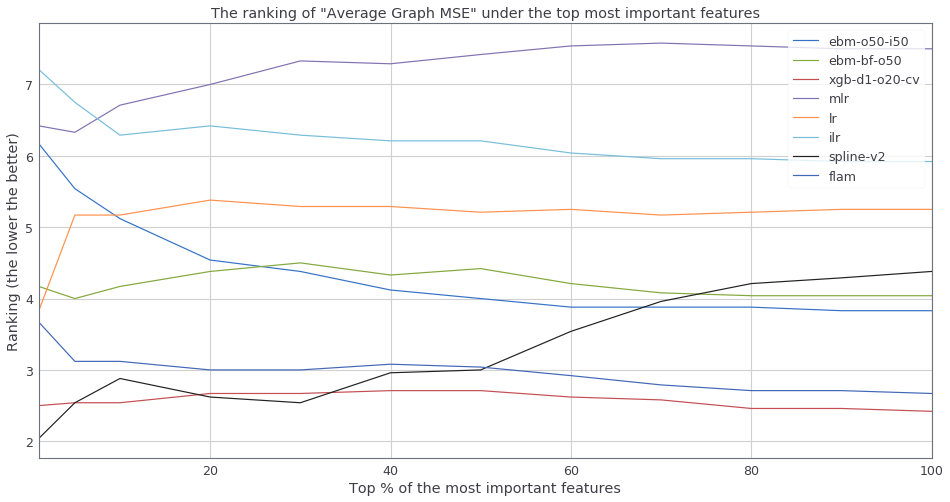

In [267]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(nr_ranks, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Ranking (the lower the better)')
ax.set_title('The ranking of "Average Graph MSE" under the top most important features')

Text(0.5, 1.0, 'The Normalized Score of "Average Graph MSE" under the top most important features')

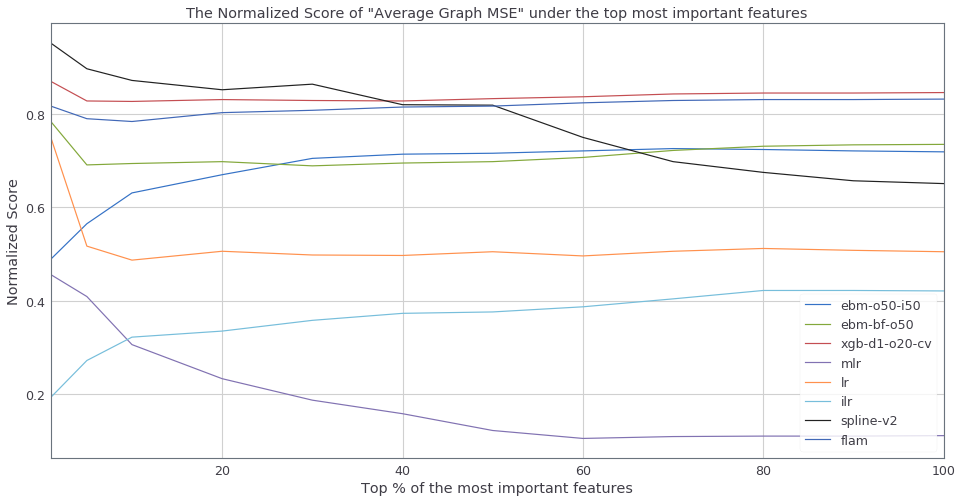

In [268]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(nr_nss, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Normalized Score')
ax.set_title('The Normalized Score of "Average Graph MSE" under the top most important features')

Text(0.5, 1.0, 'The ranking of "Worst Graph MSE" under the top most important features')

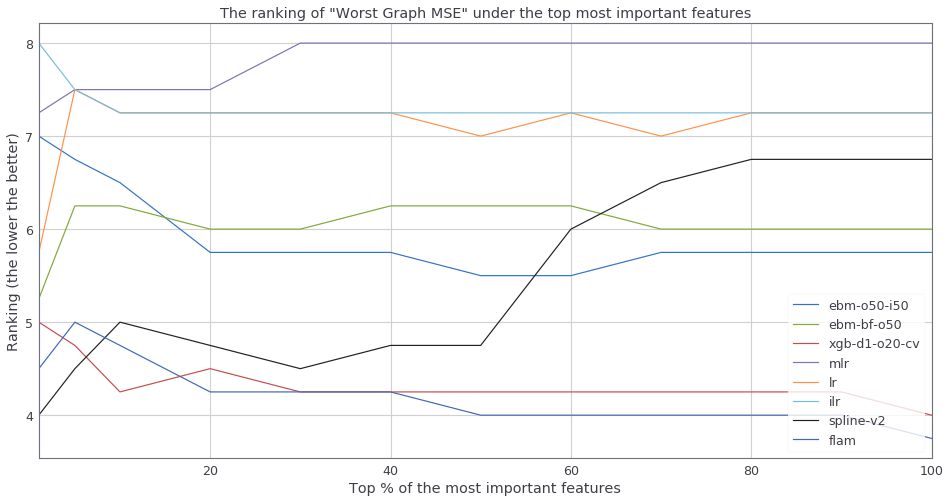

In [269]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(ws_ranks, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Ranking (the lower the better)')
ax.set_title('The ranking of "Worst Graph MSE" under the top most important features')

Text(0.5, 1.0, 'The Normalized Score of "Worst Graph MSE" under the top most important features')

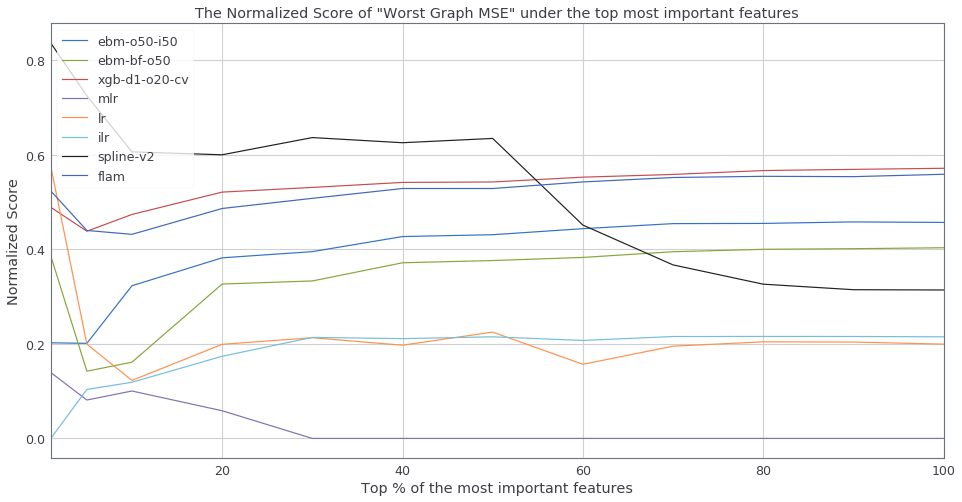

In [270]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(ws_nss, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Normalized Score')
ax.set_title('The Normalized Score of "Worst Graph MSE" under the top most important features')

#### TODO: graph of rank vs. top number of features for the graph MSE

In [125]:
# top_k = 30

for top_k in [1, 2, 5, 10, 20, 30, 50]:
    print(top_k)
    # The total graph mse
    total_mse = copy.deepcopy(mse)
    for d_name, v2 in total_mse.items():
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name

        for m_name, v1 in v2.items():
            arr = [v1[k1] for k1 in v1 if k1 in feat_rank.iloc[:top_k].values]
            total_mse[d_name][m_name] = np.mean(arr)

    total_mse = pd.DataFrame(total_mse).T
    new_total_mse = cal_statistics(total_mse, 'graph mse', is_metric_higher_better=False)

    display(new_total_mse.style.apply(highlight_min_max, axis=1))

1


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.0227988,0.0161339,0.00695809,0.036511,0.00994196,0.052278,0.00404201,0.00962419
ss_mimiciii_b1_r1377_ebm-o50-i50,0.0102325,0.00670058,0.00300787,0.0267446,0.00430133,0.0346662,0.00355997,0.00416381
ss_mimiciii_b1_r1377_flam,0.0242243,0.0166067,0.00773488,0.0405857,0.0158015,0.0668097,0.00791087,0.00961745
ss_mimiciii_b1_r1377_lr,0.00988083,0.00735541,0.00306859,0.023554,0.000536423,0.0407661,0.00508244,0.00500034
ss_mimiciii_b1_r1377_spline-v2,0.190626,0.19141,0.106033,0.216499,0.0396328,0.224578,0.00651045,0.13544
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.0253606,0.015528,0.00835074,0.0432801,0.0105721,0.0763899,0.00582082,0.0108721
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0328102,0.0122068,0.00789979,0.0255623,0.0194492,0.0863992,0.00710539,0.0148547
ss_pneumonia_b1_r1377_ebm-o50-i50,0.0163342,0.0062519,0.0050736,0.0237553,0.0257739,0.0594498,0.00350694,0.00977882
ss_pneumonia_b1_r1377_flam,0.0151015,0.00539868,0.0200342,0.0305945,0.0290107,0.0561544,0.0198089,0.00577631
ss_pneumonia_b1_r1377_lr,0.0817026,0.0361725,0.00692125,0.062526,0.00710926,0.23627,0.0177025,0.0590522


2


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.0146588,0.00969796,0.00469185,0.025284,0.0106435,0.0376716,0.00433141,0.0065694
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00678534,0.00407716,0.00204628,0.017979,0.00707081,0.0253091,0.0033103,0.00330307
ss_mimiciii_b1_r1377_flam,0.0189293,0.0107088,0.00506272,0.0320972,0.0150891,0.0534827,0.00545323,0.00599609
ss_mimiciii_b1_r1377_lr,0.00944743,0.0062147,0.00271682,0.0216159,0.00063273,0.0370065,0.00412076,0.00449334
ss_mimiciii_b1_r1377_spline-v2,0.186107,0.199589,0.122017,0.191417,0.0399777,0.211879,0.0596555,0.149382
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.0182987,0.0112535,0.00519452,0.0317535,0.012052,0.0543442,0.00490246,0.0075273
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0225545,0.0102999,0.00668149,0.0196115,0.0378495,0.0532998,0.00527676,0.0107358
ss_pneumonia_b1_r1377_ebm-o50-i50,0.0123254,0.00639268,0.00430091,0.0175269,0.036758,0.0376893,0.00331861,0.00777018
ss_pneumonia_b1_r1377_flam,0.0156602,0.00839578,0.0131037,0.0236786,0.0585,0.036251,0.0124681,0.00607658
ss_pneumonia_b1_r1377_lr,0.063545,0.0431401,0.0274117,0.0559879,0.0252365,0.1404,0.00975261,0.0516882


5


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00827161,0.00540824,0.00348215,0.0177597,0.00745893,0.0249079,0.00543747,0.00411596
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00417631,0.00330081,0.00247439,0.0146168,0.00837572,0.0164201,0.00637513,0.00306194
ss_mimiciii_b1_r1377_flam,0.0133392,0.00893945,0.00588489,0.0262094,0.013641,0.0339298,0.00723475,0.00541867
ss_mimiciii_b1_r1377_lr,0.0055885,0.00365564,0.0048273,0.0149988,0.00048005,0.0286466,0.00475205,0.00396235
ss_mimiciii_b1_r1377_spline-v2,0.131996,0.13666,0.0932691,0.151603,0.0326772,0.159983,0.0431721,0.113737
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.0133447,0.00925999,0.00325289,0.0233274,0.0179036,0.0376072,0.0111392,0.00626934
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0145997,0.00724174,0.0065674,0.0174738,0.0238571,0.0276703,0.00476852,0.00616521
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00670686,0.00716629,0.00514318,0.011279,0.0175828,0.0181418,0.00290498,0.00491325
ss_pneumonia_b1_r1377_flam,0.0100528,0.0073514,0.00805135,0.0164299,0.0256612,0.0183958,0.00587305,0.00370742
ss_pneumonia_b1_r1377_lr,0.0332851,0.0230383,0.0145344,0.0344533,0.0109526,0.0643425,0.00636766,0.0241825


10


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00639503,0.00488676,0.00336007,0.0151247,0.00942333,0.0184575,0.00626516,0.00372042
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00290249,0.00257399,0.00254922,0.010754,0.00669096,0.0113175,0.00633119,0.00280948
ss_mimiciii_b1_r1377_flam,0.0103075,0.00795123,0.00528493,0.0212945,0.0147663,0.0259529,0.00736435,0.00451426
ss_mimiciii_b1_r1377_lr,0.00636104,0.00692556,0.00470282,0.0165687,0.000383421,0.0246691,0.00442118,0.0043479
ss_mimiciii_b1_r1377_spline-v2,0.0780102,0.0801372,0.0523181,0.0945829,0.0262252,0.103808,0.0238075,0.064747
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00928059,0.00725724,0.00340384,0.0190168,0.0136772,0.0272758,0.00783476,0.00524403
ss_pneumonia_b1_r1377_ebm-bf-o50,0.00821815,0.00516233,0.00531886,0.0130375,0.0155001,0.0163902,0.00331219,0.0046448
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00481336,0.00715684,0.00483391,0.0107124,0.0122544,0.0114283,0.00301418,0.00377669
ss_pneumonia_b1_r1377_flam,0.00727488,0.00740066,0.00694104,0.0162801,0.0200786,0.0122774,0.00645733,0.00417939
ss_pneumonia_b1_r1377_lr,0.0231083,0.0203838,0.0131412,0.023933,0.0095134,0.0377816,0.00484781,0.0174881


20


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00488432,0.00450485,0.00291188,0.0120709,0.00853577,0.0142589,0.00556996,0.00328984
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00274398,0.00376607,0.00280689,0.0101356,0.00812604,0.00972038,0.00540879,0.00303146
ss_mimiciii_b1_r1377_flam,0.00716261,0.00658199,0.00416867,0.0164349,0.0117809,0.0173311,0.00687305,0.00364944
ss_mimiciii_b1_r1377_lr,0.00550007,0.00725698,0.00381088,0.0152571,0.000822297,0.0186081,0.00475995,0.00450058
ss_mimiciii_b1_r1377_spline-v2,0.0441549,0.0455725,0.029575,0.0566659,0.0182299,0.0628374,0.0149599,0.0361004
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00757199,0.0065459,0.00353311,0.0171983,0.0118947,0.0209912,0.0068027,0.00483381
ss_pneumonia_b1_r1377_ebm-bf-o50,0.00507521,0.00371989,0.00399399,0.0105929,0.00970362,0.00919687,0.00266407,0.00316049
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00361739,0.00572095,0.00462739,0.00922235,0.0104773,0.00770435,0.00311899,0.00357532
ss_pneumonia_b1_r1377_flam,0.00467017,0.00577937,0.00516725,0.0120243,0.0120473,0.00765905,0.00451464,0.00354235
ss_pneumonia_b1_r1377_lr,0.0143184,0.0142659,0.00864929,0.017693,0.00521319,0.0203964,0.00437784,0.0098679


30


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00373895,0.00359503,0.0024656,0.0111087,0.00716482,0.0108479,0.00476745,0.00284123
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00242231,0.00361236,0.00253384,0.0104383,0.00738064,0.00819912,0.00454892,0.00299465
ss_mimiciii_b1_r1377_flam,0.00623572,0.0059387,0.00372984,0.0146869,0.0102243,0.0145837,0.00649896,0.00334054
ss_mimiciii_b1_r1377_lr,0.00519781,0.00639584,0.00360017,0.014634,0.00113249,0.0152272,0.00553194,0.00443176
ss_mimiciii_b1_r1377_spline-v2,0.0317741,0.0342585,0.0215083,0.0437942,0.0152944,0.047035,0.0116547,0.0262772
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00653734,0.00616418,0.00323028,0.0158476,0.0101079,0.0171892,0.00586716,0.00468636
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0042651,0.00273059,0.00311466,0.00853673,0.00711418,0.00734202,0.00253916,0.00235973
ss_pneumonia_b1_r1377_ebm-o50-i50,0.0026893,0.0046453,0.00353243,0.0078269,0.00758589,0.00564616,0.00429356,0.00291299
ss_pneumonia_b1_r1377_flam,0.00372467,0.00442192,0.00419382,0.0103881,0.010434,0.00585916,0.0124719,0.00272717
ss_pneumonia_b1_r1377_lr,0.00996849,0.0102504,0.00612194,0.0139474,0.00366591,0.0141076,0.00353535,0.00695312


50


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00295292,0.00239574,0.00196039,0.00927513,0.00552774,0.00794488,0.00555921,0.00219942
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00219836,0.0030625,0.00237901,0.0101934,0.00811329,0.00708857,0.00670105,0.00287637
ss_mimiciii_b1_r1377_flam,0.00493052,0.0045972,0.00318026,0.0132399,0.00780872,0.0106818,0.00673679,0.00298685
ss_mimiciii_b1_r1377_lr,0.00378738,0.00445758,0.00278977,0.0117483,0.000983882,0.00992156,0.00547974,0.00338512
ss_mimiciii_b1_r1377_spline-v2,0.0206251,0.0220449,0.0140189,0.0314627,0.0117437,0.0320297,0.00861889,0.0170186
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00493519,0.0045905,0.00262326,0.0134998,0.00737955,0.0122596,0.0070855,0.00368058
ss_pneumonia_b1_r1377_ebm-bf-o50,0.00295234,0.00178103,0.00207618,0.00557584,0.0050364,0.00497532,0.00211666,0.00156496
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00208079,0.00335203,0.00262414,0.0060069,0.00564301,0.00416042,0.00467099,0.00222048
ss_pneumonia_b1_r1377_flam,0.00272174,0.00296177,0.00286219,0.00713118,0.00719705,0.00407284,0.00879336,0.00186737
ss_pneumonia_b1_r1377_lr,0.00733238,0.00717794,0.0044168,0.0110938,0.0026577,0.00995995,0.00300742,0.00508916


In [116]:
# top_k = 30

for top_k in [1, 2, 5, 10, 20, 30, 50]:
    print(top_k)
    # The total graph mse
    total_mse = copy.deepcopy(mse)
    for d_name, v2 in total_mse.items():
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name

        for m_name, v1 in v2.items():
            arr = [v1[k1] for k1 in v1 if k1 in feat_rank.iloc[:top_k].values]
            total_mse[d_name][m_name] = np.mean(arr)

    total_mse = pd.DataFrame(total_mse).T
    new_total_mse = cal_statistics(total_mse, 'graph mse', is_metric_higher_better=False)

    display(new_total_mse.style.apply(highlight_min_max, axis=1))

1


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.0227988,0.0161339,0.00695809,0.036511,0.00994196,0.052278,0.00404201,0.00962419
ss_mimiciii_b1_r1377_ebm-o50-i50,0.0102325,0.00670058,0.00300787,0.0267446,0.00430133,0.0346662,0.00355997,0.00416381
ss_mimiciii_b1_r1377_flam,0.0242243,0.0166067,0.00773488,0.0405857,0.0158015,0.0668097,0.00791087,0.00961745
ss_mimiciii_b1_r1377_lr,0.00988083,0.00735541,0.00306859,0.023554,0.000536423,0.0407661,0.00508244,0.00500034
ss_mimiciii_b1_r1377_spline-v2,0.190626,0.19141,0.106033,0.216499,0.0396328,0.224578,0.00651045,0.13544
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.0253606,0.015528,0.00835074,0.0432801,0.0105721,0.0763899,0.00582082,0.0108721
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0328102,0.0122068,0.00789979,0.0255623,0.0194492,0.0863992,0.00710539,0.0148547
ss_pneumonia_b1_r1377_ebm-o50-i50,0.0163342,0.0062519,0.0050736,0.0237553,0.0257739,0.0594498,0.00350694,0.00977882
ss_pneumonia_b1_r1377_flam,0.0151015,0.00539868,0.0200342,0.0305945,0.0290107,0.0561544,0.0198089,0.00577631
ss_pneumonia_b1_r1377_lr,0.0817026,0.0361725,0.00692125,0.062526,0.00710926,0.23627,0.0177025,0.0590522


2


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.0146588,0.00969796,0.00469185,0.025284,0.0106435,0.0376716,0.00433141,0.0065694
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00678534,0.00407716,0.00204628,0.017979,0.00707081,0.0253091,0.0033103,0.00330307
ss_mimiciii_b1_r1377_flam,0.0189293,0.0107088,0.00506272,0.0320972,0.0150891,0.0534827,0.00545323,0.00599609
ss_mimiciii_b1_r1377_lr,0.00944743,0.0062147,0.00271682,0.0216159,0.00063273,0.0370065,0.00412076,0.00449334
ss_mimiciii_b1_r1377_spline-v2,0.186107,0.199589,0.122017,0.191417,0.0399777,0.211879,0.0596555,0.149382
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.0182987,0.0112535,0.00519452,0.0317535,0.012052,0.0543442,0.00490246,0.0075273
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0225545,0.0102999,0.00668149,0.0196115,0.0378495,0.0532998,0.00527676,0.0107358
ss_pneumonia_b1_r1377_ebm-o50-i50,0.0123254,0.00639268,0.00430091,0.0175269,0.036758,0.0376893,0.00331861,0.00777018
ss_pneumonia_b1_r1377_flam,0.0156602,0.00839578,0.0131037,0.0236786,0.0585,0.036251,0.0124681,0.00607658
ss_pneumonia_b1_r1377_lr,0.063545,0.0431401,0.0274117,0.0559879,0.0252365,0.1404,0.00975261,0.0516882


5


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00827161,0.00540824,0.00348215,0.0177597,0.00745893,0.0249079,0.00543747,0.00411596
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00417631,0.00330081,0.00247439,0.0146168,0.00837572,0.0164201,0.00637513,0.00306194
ss_mimiciii_b1_r1377_flam,0.0133392,0.00893945,0.00588489,0.0262094,0.013641,0.0339298,0.00723475,0.00541867
ss_mimiciii_b1_r1377_lr,0.0055885,0.00365564,0.0048273,0.0149988,0.00048005,0.0286466,0.00475205,0.00396235
ss_mimiciii_b1_r1377_spline-v2,0.131996,0.13666,0.0932691,0.151603,0.0326772,0.159983,0.0431721,0.113737
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.0133447,0.00925999,0.00325289,0.0233274,0.0179036,0.0376072,0.0111392,0.00626934
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0145997,0.00724174,0.0065674,0.0174738,0.0238571,0.0276703,0.00476852,0.00616521
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00670686,0.00716629,0.00514318,0.011279,0.0175828,0.0181418,0.00290498,0.00491325
ss_pneumonia_b1_r1377_flam,0.0100528,0.0073514,0.00805135,0.0164299,0.0256612,0.0183958,0.00587305,0.00370742
ss_pneumonia_b1_r1377_lr,0.0332851,0.0230383,0.0145344,0.0344533,0.0109526,0.0643425,0.00636766,0.0241825


10


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00639503,0.00488676,0.00336007,0.0151247,0.00942333,0.0184575,0.00626516,0.00372042
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00290249,0.00257399,0.00254922,0.010754,0.00669096,0.0113175,0.00633119,0.00280948
ss_mimiciii_b1_r1377_flam,0.0103075,0.00795123,0.00528493,0.0212945,0.0147663,0.0259529,0.00736435,0.00451426
ss_mimiciii_b1_r1377_lr,0.00636104,0.00692556,0.00470282,0.0165687,0.000383421,0.0246691,0.00442118,0.0043479
ss_mimiciii_b1_r1377_spline-v2,0.0780102,0.0801372,0.0523181,0.0945829,0.0262252,0.103808,0.0238075,0.064747
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00928059,0.00725724,0.00340384,0.0190168,0.0136772,0.0272758,0.00783476,0.00524403
ss_pneumonia_b1_r1377_ebm-bf-o50,0.00821815,0.00516233,0.00531886,0.0130375,0.0155001,0.0163902,0.00331219,0.0046448
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00481336,0.00715684,0.00483391,0.0107124,0.0122544,0.0114283,0.00301418,0.00377669
ss_pneumonia_b1_r1377_flam,0.00727488,0.00740066,0.00694104,0.0162801,0.0200786,0.0122774,0.00645733,0.00417939
ss_pneumonia_b1_r1377_lr,0.0231083,0.0203838,0.0131412,0.023933,0.0095134,0.0377816,0.00484781,0.0174881


20


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00488432,0.00450485,0.00291188,0.0120709,0.00853577,0.0142589,0.00556996,0.00328984
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00274398,0.00376607,0.00280689,0.0101356,0.00812604,0.00972038,0.00540879,0.00303146
ss_mimiciii_b1_r1377_flam,0.00716261,0.00658199,0.00416867,0.0164349,0.0117809,0.0173311,0.00687305,0.00364944
ss_mimiciii_b1_r1377_lr,0.00550007,0.00725698,0.00381088,0.0152571,0.000822297,0.0186081,0.00475995,0.00450058
ss_mimiciii_b1_r1377_spline-v2,0.0441549,0.0455725,0.029575,0.0566659,0.0182299,0.0628374,0.0149599,0.0361004
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00757199,0.0065459,0.00353311,0.0171983,0.0118947,0.0209912,0.0068027,0.00483381
ss_pneumonia_b1_r1377_ebm-bf-o50,0.00507521,0.00371989,0.00399399,0.0105929,0.00970362,0.00919687,0.00266407,0.00316049
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00361739,0.00572095,0.00462739,0.00922235,0.0104773,0.00770435,0.00311899,0.00357532
ss_pneumonia_b1_r1377_flam,0.00467017,0.00577937,0.00516725,0.0120243,0.0120473,0.00765905,0.00451464,0.00354235
ss_pneumonia_b1_r1377_lr,0.0143184,0.0142659,0.00864929,0.017693,0.00521319,0.0203964,0.00437784,0.0098679


30


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00373895,0.00359503,0.0024656,0.0111087,0.00716482,0.0108479,0.00476745,0.00284123
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00242231,0.00361236,0.00253384,0.0104383,0.00738064,0.00819912,0.00454892,0.00299465
ss_mimiciii_b1_r1377_flam,0.00623572,0.0059387,0.00372984,0.0146869,0.0102243,0.0145837,0.00649896,0.00334054
ss_mimiciii_b1_r1377_lr,0.00519781,0.00639584,0.00360017,0.014634,0.00113249,0.0152272,0.00553194,0.00443176
ss_mimiciii_b1_r1377_spline-v2,0.0317741,0.0342585,0.0215083,0.0437942,0.0152944,0.047035,0.0116547,0.0262772
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00653734,0.00616418,0.00323028,0.0158476,0.0101079,0.0171892,0.00586716,0.00468636
ss_pneumonia_b1_r1377_ebm-bf-o50,0.0042651,0.00273059,0.00311466,0.00853673,0.00711418,0.00734202,0.00253916,0.00235973
ss_pneumonia_b1_r1377_ebm-o50-i50,0.0026893,0.0046453,0.00353243,0.0078269,0.00758589,0.00564616,0.00429356,0.00291299
ss_pneumonia_b1_r1377_flam,0.00372467,0.00442192,0.00419382,0.0103881,0.010434,0.00585916,0.0124719,0.00272717
ss_pneumonia_b1_r1377_lr,0.00996849,0.0102504,0.00612194,0.0139474,0.00366591,0.0141076,0.00353535,0.00695312


50


,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.00295292,0.00239574,0.00196039,0.00927513,0.00552774,0.00794488,0.00555921,0.00219942
ss_mimiciii_b1_r1377_ebm-o50-i50,0.00219836,0.0030625,0.00237901,0.0101934,0.00811329,0.00708857,0.00670105,0.00287637
ss_mimiciii_b1_r1377_flam,0.00493052,0.0045972,0.00318026,0.0132399,0.00780872,0.0106818,0.00673679,0.00298685
ss_mimiciii_b1_r1377_lr,0.00378738,0.00445758,0.00278977,0.0117483,0.000983882,0.00992156,0.00547974,0.00338512
ss_mimiciii_b1_r1377_spline-v2,0.0206251,0.0220449,0.0140189,0.0314627,0.0117437,0.0320297,0.00861889,0.0170186
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.00493519,0.0045905,0.00262326,0.0134998,0.00737955,0.0122596,0.0070855,0.00368058
ss_pneumonia_b1_r1377_ebm-bf-o50,0.00295234,0.00178103,0.00207618,0.00557584,0.0050364,0.00497532,0.00211666,0.00156496
ss_pneumonia_b1_r1377_ebm-o50-i50,0.00208079,0.00335203,0.00262414,0.0060069,0.00564301,0.00416042,0.00467099,0.00222048
ss_pneumonia_b1_r1377_flam,0.00272174,0.00296177,0.00286219,0.00713118,0.00719705,0.00407284,0.00879336,0.00186737
ss_pneumonia_b1_r1377_lr,0.00733238,0.00717794,0.0044168,0.0110938,0.0026577,0.00995995,0.00300742,0.00508916


### Test AUC v.s. Graph MSE

#### Raw  

ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
mlr
lr
ilr
spline-v2
flam


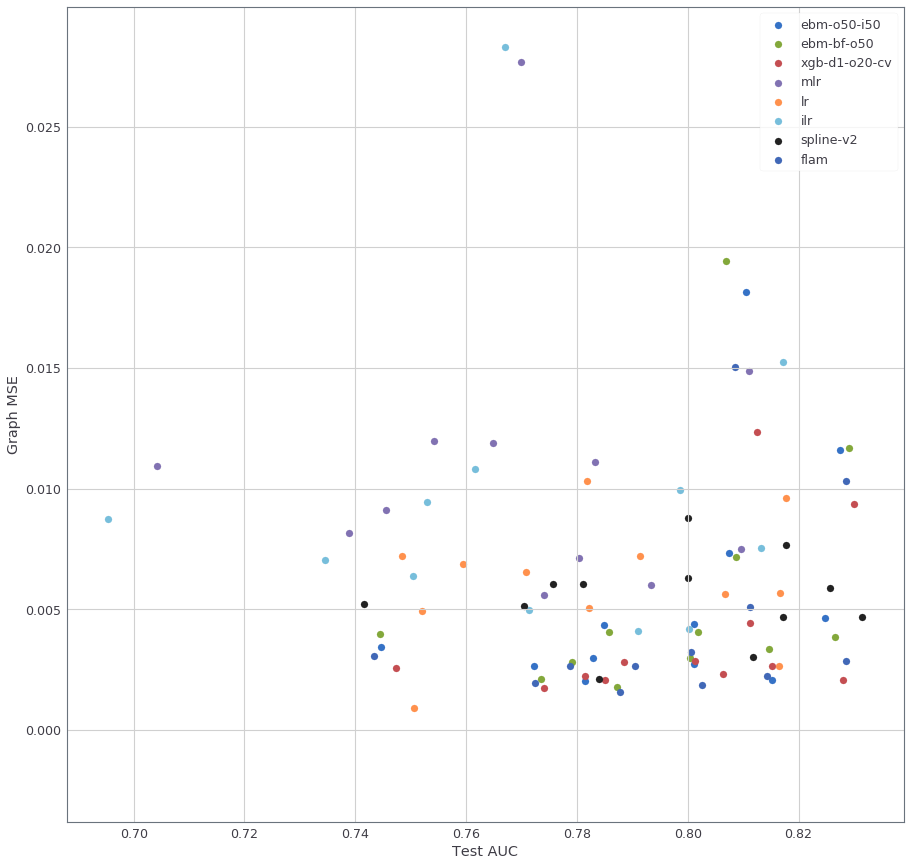

In [170]:
fig, ax = plt.subplots(figsize=(15, 15))

for model_name in total_mse.columns:
    print(model_name)
    xs, ys = [], []
    for d_name in total_mse.index:
        x = float(extract_mean(all_tables['test_auc'].loc[d_name, model_name]))
        xs.append(x)
        y = new_total_mse.iloc[:-6].loc[d_name, model_name]
        ys.append(y)
    ax.scatter(xs, ys, label=model_name, s=50)

ax.set_xlabel('Test AUC')
ax.set_ylabel('Graph MSE')
ax.legend()
# ax.plot([0, 9], [0, 9], '-', color='gray', alpha=0.3)

#### Rank

In [106]:
from vis_utils import rank, extract_mean

test_auc_rank = all_tables['test_auc'].apply(rank, axis=1)
test_auc_rank

model_name,ebm-bf-o50,ebm-o50-i50,flam,ilr,lr,mlr,spline-v2,xgb-d1-o20-cv,xgb-d3-o20-cv
ss_mimiciii_b1_r1377_ebm-bf-o50,2.0,4.0,3.0,9.0,6.0,8.0,5.0,1.0,7.0
ss_mimiciii_b1_r1377_ebm-o50-i50,3.0,1.5,4.0,7.0,8.0,9.0,5.0,1.5,6.0
ss_mimiciii_b1_r1377_flam,3.0,4.0,1.0,9.0,7.0,8.0,5.0,2.0,6.0
ss_mimiciii_b1_r1377_lr,4.0,3.0,5.0,9.0,1.0,8.0,6.0,2.0,7.0
ss_mimiciii_b1_r1377_spline-v2,5.0,3.0,4.0,9.0,7.0,8.0,1.0,2.0,6.0
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,2.0,3.0,4.0,9.0,7.0,8.0,5.0,1.0,6.0
ss_pneumonia_b1_r1377_ebm-bf-o50,2.0,5.0,1.0,8.0,6.0,7.0,4.0,3.0,9.0
ss_pneumonia_b1_r1377_ebm-o50-i50,4.0,3.0,5.0,7.0,6.0,8.0,1.0,2.0,9.0
ss_pneumonia_b1_r1377_flam,4.0,3.0,1.0,7.0,6.0,8.0,5.0,2.0,9.0
ss_pneumonia_b1_r1377_lr,5.0,6.0,4.0,7.0,1.0,8.0,2.0,3.0,9.0


In [121]:
graph_mse_rank = new_total_mse.iloc[:-6].apply(rank, is_metric_higher_better=False, axis=1).sort_index()
graph_mse_rank

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,4.0,3.0,1.0,8.0,5.0,7.0,6.0,2.0
ss_mimiciii_b1_r1377_ebm-o50-i50,1.0,4.0,2.0,8.0,7.0,6.0,5.0,3.0
ss_mimiciii_b1_r1377_flam,4.0,3.0,2.0,8.0,6.0,7.0,5.0,1.0
ss_mimiciii_b1_r1377_lr,4.0,5.0,2.0,8.0,1.0,7.0,6.0,3.0
ss_mimiciii_b1_r1377_spline-v2,5.0,6.0,3.0,7.0,2.0,8.0,1.0,4.0
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,4.0,3.0,1.0,8.0,6.0,7.0,5.0,2.0
ss_pneumonia_b1_r1377_ebm-bf-o50,5.0,2.0,3.0,8.0,7.0,6.0,4.0,1.0
ss_pneumonia_b1_r1377_ebm-o50-i50,1.0,4.0,3.0,8.0,7.0,5.0,6.0,2.0
ss_pneumonia_b1_r1377_flam,2.0,4.0,3.0,6.0,7.0,5.0,8.0,1.0
ss_pneumonia_b1_r1377_lr,6.0,5.0,3.0,8.0,1.0,7.0,2.0,4.0


ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
mlr
lr
ilr
spline-v2
flam


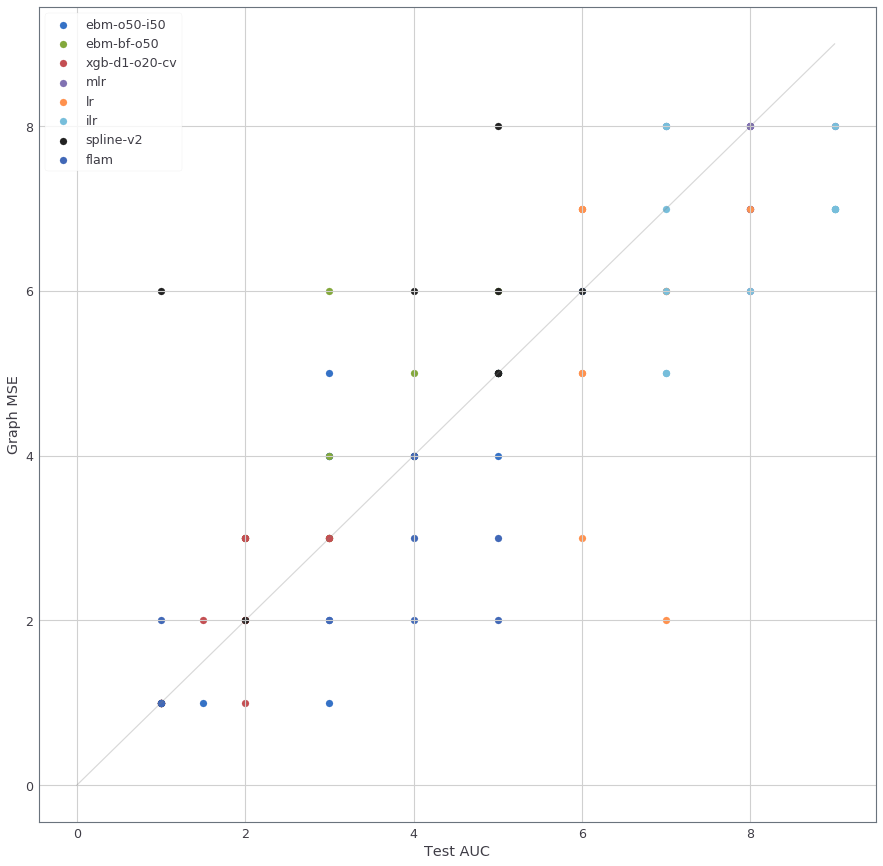

In [131]:
fig, ax = plt.subplots(figsize=(15, 15))

for model_name in total_mse.columns:
    print(model_name)
    xs, ys = [], []
    for d_name in total_mse.index:
        x = float(test_auc_rank.loc[d_name, model_name])
        xs.append(x)
        y = graph_mse_rank.loc[d_name, model_name]
        ys.append(y)
    ax.scatter(xs, ys, label=model_name, s=50)

ax.set_xlabel('Test AUC')
ax.set_ylabel('Graph MSE')
ax.legend()
ax.plot([0, 9], [0, 9], '-', color='gray', alpha=0.3)

### Normalized score

In [171]:
test_auc_normalized_score = all_tables['test_auc'].apply(normalized_score, axis=1)
test_auc_normalized_score

model_name,ebm-bf-o50,ebm-o50-i50,flam,ilr,lr,mlr,spline-v2,xgb-d1-o20-cv
ss_mimiciii_b1_r1377_ebm-bf-o50,0.987342,0.954430,0.959494,0.000000,0.443038,0.108861,0.906329,1.000000
ss_mimiciii_b1_r1377_ebm-o50-i50,0.938719,1.000000,0.927577,0.136490,0.083565,0.000000,0.838440,1.000000
ss_mimiciii_b1_r1377_flam,0.877333,0.853333,1.000000,0.000000,0.176000,0.034667,0.752000,0.949333
ss_mimiciii_b1_r1377_lr,0.889493,0.891304,0.867754,0.000000,1.000000,0.159420,0.835145,0.942029
ss_mimiciii_b1_r1377_spline-v2,0.788955,0.857988,0.818540,0.000000,0.291913,0.057199,1.000000,0.897436
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.899103,0.883408,0.872197,0.000000,0.204036,0.071749,0.858744,1.000000
ss_pneumonia_b1_r1377_ebm-bf-o50,0.963636,0.703030,1.000000,0.000000,0.660606,0.163636,0.769697,0.830303
ss_pneumonia_b1_r1377_ebm-o50-i50,0.890756,0.915966,0.878151,0.289916,0.563025,0.000000,1.000000,0.920168
ss_pneumonia_b1_r1377_flam,0.905830,0.932735,1.000000,0.479821,0.497758,0.000000,0.883408,0.946188
ss_pneumonia_b1_r1377_lr,0.765060,0.728916,0.840361,0.463855,1.000000,0.000000,0.858434,0.843373


In [172]:
graph_mse_normalized_score = new_total_mse.iloc[:-6].apply(normalized_score, is_metric_higher_better=False, axis=1).sort_index()
graph_mse_normalized_score

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_mimiciii_b1_r1377_ebm-bf-o50,0.859278,0.940952,1.000000,0.000000,0.502921,0.174337,0.466343,0.967256
ss_mimiciii_b1_r1377_ebm-o50-i50,1.000000,0.893356,0.972140,0.000000,0.268471,0.388671,0.434675,0.914246
ss_mimiciii_b1_r1377_flam,0.817479,0.849138,0.982367,0.000000,0.546864,0.271998,0.634915,1.000000
ss_mimiciii_b1_r1377_lr,0.745486,0.695909,0.833013,0.000000,1.000000,0.219620,0.571968,0.782529
ss_mimiciii_b1_r1377_spline-v2,0.490584,0.429513,0.771738,0.028748,0.870164,0.000000,1.000000,0.642963
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.784366,0.819497,1.000000,0.000000,0.556361,0.112302,0.582704,0.902927
ss_pneumonia_b1_r1377_ebm-bf-o50,0.654095,0.946127,0.872541,0.000000,0.134494,0.149721,0.862448,1.000000
ss_pneumonia_b1_r1377_ebm-o50-i50,1.000000,0.676208,0.861606,0.000000,0.092684,0.470307,0.340262,0.964422
ss_pneumonia_b1_r1377_flam,0.876643,0.841987,0.856364,0.239992,0.230482,0.681565,0.000000,1.000000
ss_pneumonia_b1_r1377_lr,0.445871,0.464178,0.791478,0.000000,1.000000,0.134404,0.958544,0.711778


In [174]:
test_mse_normalized_score = all_tables['test_mse'].apply(normalized_score, is_metric_higher_better=False, axis=1)
test_mse_normalized_score

model_name,ebm-bf-o50,ebm-o50-i50,flam,ilr,lr,mlr,spline-v2,xgb-d1-o20-cv
ss_mimiciii_b1_r1377_ebm-bf-o50,0.957569,0.951835,0.967890,0.431193,0.699541,0.0,0.954128,1.000000
ss_mimiciii_b1_r1377_ebm-o50-i50,0.953461,0.965394,0.961814,0.461814,0.696897,0.0,0.941527,1.000000
ss_mimiciii_b1_r1377_flam,0.934289,0.952210,1.000000,0.443250,0.671446,0.0,0.898447,0.976105
ss_mimiciii_b1_r1377_lr,0.915596,0.926606,0.931193,0.250459,1.000000,0.0,0.894495,0.962385
ss_mimiciii_b1_r1377_spline-v2,0.843581,0.880259,0.873786,0.196332,0.560949,0.0,1.000000,0.938511
ss_mimiciii_b1_r1377_xgb-d1-o20-cv,0.941597,0.940405,0.930870,0.240763,0.646007,0.0,0.948749,1.000000
ss_pneumonia_b1_r1377_ebm-bf-o50,1.000000,0.889474,0.998246,0.547368,0.566667,0.0,0.880702,0.885965
ss_pneumonia_b1_r1377_ebm-o50-i50,0.928870,0.988842,0.947001,0.691771,0.728033,0.0,1.000000,0.941423
ss_pneumonia_b1_r1377_flam,0.871667,0.938333,1.000000,0.805000,0.635000,0.0,0.831667,0.933333
ss_pneumonia_b1_r1377_lr,0.920694,0.889715,0.945477,0.671623,1.000000,0.0,0.851301,0.978934


In [175]:
df_scatter_dicts = []
for model_name in graph_mse_normalized_score.columns:
    print(model_name)
    for d_name in graph_mse_normalized_score.index:
        df_scatter_dict = {}
        df_scatter_dict['d_name'] = d_name
        df_scatter_dict['model_name'] = model_name
        df_scatter_dict['gt_model_name'] = d_name.split('_')[-1]
        
        x = float(test_auc_normalized_score.loc[d_name, model_name])
        df_scatter_dict['test_auc_normalized_score'] = x
        y = graph_mse_normalized_score.loc[d_name, model_name]
        df_scatter_dict['graph_mse_normalized_score'] = y
        z = float(test_mse_normalized_score.loc[d_name, model_name])
        df_scatter_dict['test_mse_normalized_score'] = z
        
        df_scatter_dicts.append(df_scatter_dict)

df_scatter = pd.DataFrame(df_scatter_dicts)
df_scatter

ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
mlr
lr
ilr
spline-v2
flam


,d_name,model_name,gt_model_name,test_auc_normalized_score,graph_mse_normalized_score,test_mse_normalized_score
0,ss_mimiciii_b1_r1377_ebm-bf-o50,ebm-o50-i50,ebm-bf-o50,0.954430,0.859278,0.951835
1,ss_mimiciii_b1_r1377_ebm-o50-i50,ebm-o50-i50,ebm-o50-i50,1.000000,1.000000,0.965394
2,ss_mimiciii_b1_r1377_flam,ebm-o50-i50,flam,0.853333,0.817479,0.952210
3,ss_mimiciii_b1_r1377_lr,ebm-o50-i50,lr,0.891304,0.745486,0.926606
4,ss_mimiciii_b1_r1377_spline-v2,ebm-o50-i50,spline-v2,0.857988,0.490584,0.880259
5,ss_mimiciii_b1_r1377_xgb-d1-o20-cv,ebm-o50-i50,xgb-d1-o20-cv,0.883408,0.784366,0.940405
6,ss_pneumonia_b1_r1377_ebm-bf-o50,ebm-o50-i50,ebm-bf-o50,0.703030,0.654095,0.889474
7,ss_pneumonia_b1_r1377_ebm-o50-i50,ebm-o50-i50,ebm-o50-i50,0.915966,1.000000,0.988842
8,ss_pneumonia_b1_r1377_flam,ebm-o50-i50,flam,0.932735,0.876643,0.938333
9,ss_pneumonia_b1_r1377_lr,ebm-o50-i50,lr,0.728916,0.445871,0.889715


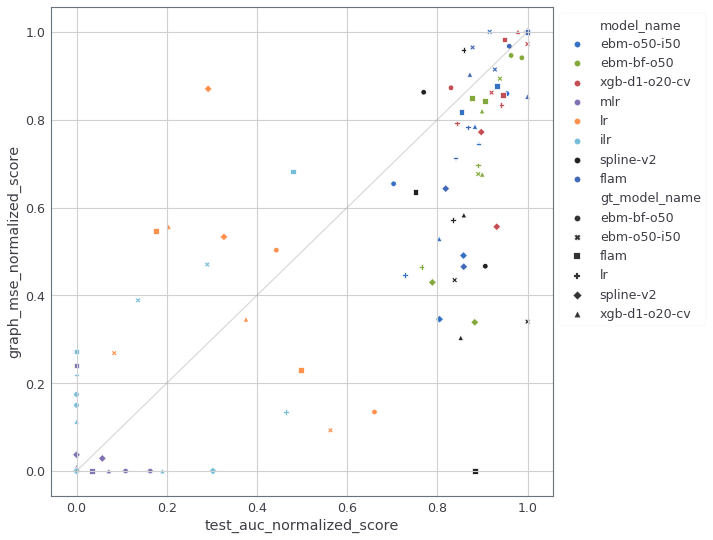

In [176]:
fig, ax = plt.subplots(figsize=(9, 9))

sns.scatterplot(x="test_auc_normalized_score", y="graph_mse_normalized_score", hue='model_name', style='gt_model_name', data=df_scatter, ax=ax)
ax.plot([0, 1], [0, 1], '-', color='gray', alpha=0.3)
ax.legend(loc="upper left", bbox_to_anchor=(1,1))

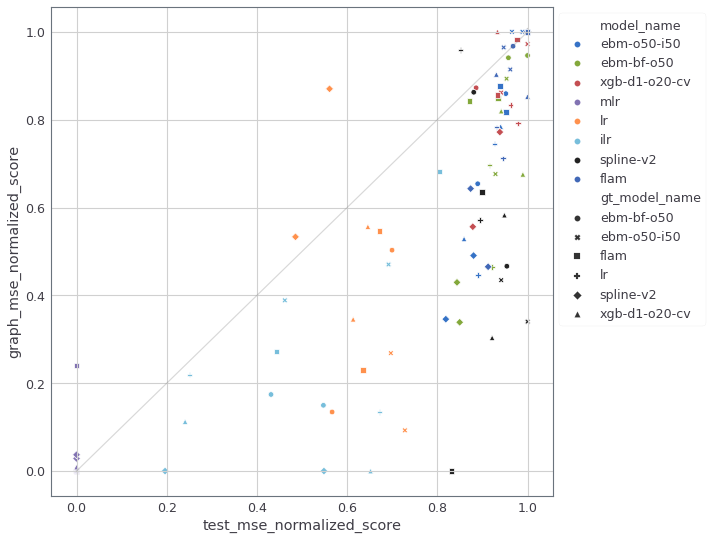

In [177]:
fig, ax = plt.subplots(figsize=(9, 9))

sns.scatterplot(x="test_mse_normalized_score", y="graph_mse_normalized_score", hue='model_name', style='gt_model_name', data=df_scatter, ax=ax)
ax.plot([0, 1], [0, 1], '-', color='gray', alpha=0.3)
ax.legend(loc="upper left", bbox_to_anchor=(1,1))

### Weighted Log-Likelihood -> Examine how good is the variance estimation

In [54]:
wllk = {}
for d_name, df_per_datasets in all_dfs.items():
    gt_lookup = df_per_datasets['gnd_truth'].set_index('feat_name')
    
    wllk[d_name] = {}
    for model_name, model_df in df_per_datasets.items():
        if model_name == 'gnd_truth' or model_name == 'rspline' or model_name == 'spline-b' or model_name == 'rspline-v2':
            continue

        wllk[d_name][model_name] = {}
        for _, row in model_df[model_df.feat_name != 'offset'].iterrows():
            gt_row = gt_lookup.loc[row.feat_name]
            if len(gt_row.x) <= 1:
                continue
            
            if np.any(row.y_std == 0):
                print(d_name, model_name, row.feat_name, gt_row.y, row.y, row.y_std)
                avg_wllk = -np.inf
            else:
                llk = -0.5 * np.log(2 * np.pi * row.y_std) - (row.y - gt_row.y) ** 2 / (2 * (row.y_std ** 2))
                avg_wllk = np.average(llk, weights=gt_row.sample_weights)
            wllk[d_name][model_name][row.feat_name] = avg_wllk

ss_breast_b1_r1377_ebm-bf-o50 flam mean fractal dimension [-0.00470792 -0.00470792 -0.00470792 -0.00470792 -0.00470792 -0.00470792
 -0.00470792 -0.00470792 -0.00470792 -0.00470792 -0.00470792 -0.00470792
 -0.00470792 -0.00470792 -0.00470792 -0.00470792 -0.0605661  -0.0605661
 -0.0605661  -0.0605661  -0.0605661  -0.0605661  -0.0605661  -0.0605661
 -0.0605661  -0.04839857 -0.04839857 -0.04839857 -0.04839857 -0.05100649
 -0.05100649 -0.05100649 -0.03602516 -0.03602516 -0.03602516 -0.03602516
 -0.03602516 -0.03602516 -0.03602516 -0.03546954 -0.03546954 -0.03546954
 -0.03546954 -0.03546954 -0.03546954 -0.03546954 -0.03546954 -0.03546954
 -0.03546954 -0.00850798 -0.00850798 -0.00850798 -0.00850798 -0.00850798
 -0.00850798 -0.00850798 -0.00850798 -0.00850798 -0.00850798 -0.00850798
 -0.00850798 -0.00850798 -0.00850798 -0.00850798 -0.00850798 -0.00850798
 -0.00850798 -0.00850798 -0.00850798 -0.000136   -0.000136   -0.000136
 -0.000136   -0.00147308 -0.00147308 -0.00147308 -0.00147308 -0.001473

ss_breast_b1_r1377_xgb-d1-o20-cv flam fractal dimension error [-0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.13466168
 -0.13466168 -0.13466168 -0.13466168 -0.13466168 -0.08216429 -0.08216429
 -0.08216429 -0.08216429 -0.08216429 -0.08216429 -0.08216429 -0.08216429
 -0.08216429 -0.08216429 -0.08216429 -0.08216429 -0.08216429 -

ss_mimicii_b1_r1377_flam ebm-bf-o50 AIDS [ 2.03234755e-05 -2.94448449e-03] [0. 0.] [0. 0.]
ss_mimicii_b1_r1377_lr ebm-bf-o50 AIDS [ 0.00061992 -0.08981501] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-bf-o50 ebm-bf-o50 first_icu_stay [0. 0.] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-bf-o50 ebm-bf-o50 eth_asian [0. 0.] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-bf-o50 ebm-bf-o50 eth_black [ 0.00881544 -0.08459202] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-bf-o50 ebm-bf-o50 eth_hispanic [ 9.09524457e-05 -2.73239317e-03] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-bf-o50 ebm-bf-o50 eth_white [0. 0.] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-bf-o50 ebm-bf-o50 admType_URGENT [0. 0.] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-o50-i50 ebm-bf-o50 first_icu_stay [ 0.06536907 -0.00600813] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-o50-i50 ebm-bf-o50 eth_asian [ 0.00108776 -0.04704808] [0. 0.] [0. 0.]
ss_mimiciii_b1_r1377_ebm-o50-i50 ebm-bf-o50 eth_hispanic [ 0.01201244 -0.36087764] [0. 0.] [0. 0.]
ss_mimiciii_b

In [55]:
def get_graph_wllk_df(top_k=None, d_name_filtered_fn=None):    
    # The total graph wllk
    total_wllk = {}
    d_names = wllk.keys()
    if d_name_filtered_fn is not None:
        d_names = pd.Series(iter(d_names))
        d_names = d_names[d_names.apply(d_name_filtered_fn)].values
    
    for d_name in d_names:
        v2 = wllk[d_name]
        
        total_wllk[d_name] = {}
        feat_rank = all_dfs[d_name]['gnd_truth'].sort_values('importance', ascending=False).feat_name
        
        top_num = top_k
        if top_k is not None and 0. <= top_k < 1.:
            top_num = int(np.ceil(top_k * len(feat_rank)))
        
        for m_name, v1 in v2.items():
            arr = list(v1.values()) if top_k is None else [v1[k1] for k1 in v1 if k1 in feat_rank.iloc[:top_num].values]
            total_wllk[d_name][m_name] = np.mean(arr)

    total_wllk = pd.DataFrame(total_wllk).T
    return total_wllk

#### Avg WLLK

In [56]:
total_wllk = get_graph_wllk_df(top_k=None)
new_total_wllk = cal_statistics(total_wllk, is_metric_higher_better=True)

display(new_total_wllk.style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_breast_b1_r1377_ebm-bf-o50,-37.2863,-22.1878,-3.8163,-1.98879,-157.645,-35.3687,-90.2113,-inf
ss_breast_b1_r1377_ebm-o50-i50,-0.116956,-404.335,-81.9435,-18.0164,-183.88,-41.8742,-122.709,-1229.38
ss_breast_b1_r1377_flam,-10.7363,-1090.02,-75.6785,-97.2335,-596.631,-134.146,-438.723,-507.509
ss_breast_b1_r1377_lr,-6.35026,-549.684,-35.2893,-50.7197,-1.80045,-39.3739,-165.247,-70.9893
ss_breast_b1_r1377_xgb-d1-o20-cv,-3.71457,-1444.26,-29.8749,-190.214,-129.269,-39.9485,-54.8008,-inf
ss_mimicii_b1_r1377_ebm-bf-o50,-24.0834,-inf,-6.9862,-30.2465,-8148.41,-6.5604,-130.238,-2.61847
ss_mimicii_b1_r1377_ebm-o50-i50,-14.8375,-2437.98,-4.95132,-43.6459,-6558.56,-3.53812,-168.062,-1024.04
ss_mimicii_b1_r1377_flam,-35.3765,-inf,-8.05099,-56.7753,-11967.1,-7.47204,-386.105,-2.56694
ss_mimicii_b1_r1377_lr,-23.702,-inf,-6.08969,-41.0572,-1.26545,-6.29273,-2.01505,-40.6835
ss_mimicii_b1_r1377_spline-v2,-9.09818,-165.526,-3.28353,-39.851,-4697.59,-4.81559,-6.85183,-8.94474


#### Worst case graph MSE and compare in rank / normalized score

In [59]:
graph_wllk_rank = total_wllk.apply(rank, is_metric_higher_better=True, axis=1).sort_index()
display(cal_statistics(graph_wllk_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_breast_b1_r1377_ebm-bf-o50,5,3,2,1,7,4,6,8
ss_breast_b1_r1377_ebm-o50-i50,1,7,4,2,6,3,5,8
ss_breast_b1_r1377_flam,1,8,2,3,7,4,5,6
ss_breast_b1_r1377_lr,2,8,3,5,1,4,7,6
ss_breast_b1_r1377_xgb-d1-o20-cv,1,7,2,6,5,3,4,8
ss_mimicii_b1_r1377_ebm-bf-o50,4,8,3,5,7,2,6,1
ss_mimicii_b1_r1377_ebm-o50-i50,3,7,2,4,8,1,5,6
ss_mimicii_b1_r1377_flam,4,8,3,5,7,2,6,1
ss_mimicii_b1_r1377_lr,5,8,3,7,1,4,2,6
ss_mimicii_b1_r1377_spline-v2,5,7,1,6,8,2,3,4


In [58]:
worst_graph_wllk_rank = graph_wllk_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
display(cal_statistics(worst_graph_wllk_rank, is_metric_higher_better=False).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
breast,5,8,4,6,7,4,7,8
mimicii,5,8,3,7,8,4,6,6
mimiciii,5,8,7.5,3,7,6,4,6
pneumonia,6,8,5,7,7,4,2,7
average,5.25,8,4.875,5.75,7.25,4.5,4.75,6.75
average_rank,4,8,3,5,7,1,2,6
avg_rank,3.25,7.75,3.12,4.25,6.25,2.50,3.25,5.62
avg_rank_rank,3.5,8,2,5,7,1,3.5,6
avg_score,0.571,0.000,0.650,0.467,0.154,0.717,0.613,0.242
avg_score_rank,4,8,2,5,7,1,3,6


In [329]:
graph_wllk_normalized_score = total_wllk.apply(normalized_score, is_metric_higher_better=True, axis=1).sort_index()
display(cal_statistics(graph_wllk_normalized_score, 'graph_wllk_normalized_score', is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
ss_churn_b1_r1377_ebm-bf-o50,0,0.975581,0.969771,0.982441,0.874288,0.45658,1,0.997662
ss_churn_b1_r1377_ebm-o50-i50,0.765366,0.641826,0.927684,1,0.726033,0,0.943677,0.796844
ss_churn_b1_r1377_flam,0,0.992432,0.951526,0.890603,0.816529,0.962162,0.978996,1
ss_churn_b1_r1377_lr,0,0.608501,0.840357,0.950721,1,0.957398,0.99999,0.881531
ss_churn_b1_r1377_spline-v2,0,0.863995,0.89968,0.942879,0.987977,0.958164,1,0.959258
ss_churn_b1_r1377_xgb-d1-o20-cv,0.0626505,0.974791,1,0.960603,0.955882,0,0.98395,0.925314
ss_mimiciii_b1_r1377_ebm-bf-o50,0.944929,0.989549,0.999109,0.991839,0,0.682037,0.997897,1
ss_mimiciii_b1_r1377_ebm-o50-i50,0.949082,0.989652,0.995537,0.975607,0,0.681229,0.993586,1
ss_mimiciii_b1_r1377_flam,0.953983,0.99417,0.998296,0.9822,0,0.606128,0.998499,1
ss_mimiciii_b1_r1377_lr,0.843228,0.971424,0.990756,0.971745,1,0,0.986993,0.991714


In [330]:
worst_case_ns = graph_wllk_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
display(cal_statistics(worst_case_ns, 'worst_case_ns', is_metric_higher_better=True).style.apply(highlight_min_max, axis=1))

,ebm-o50-i50,ebm-bf-o50,xgb-d1-o20-cv,mlr,lr,ilr,spline-v2,flam
churn,0,0.608501,0.840357,0.890603,0.726033,0,0.943677,0.796844
mimiciii,0.773427,0,0.944315,0.867558,0,0,0.986993,0.918891
pneumonia,0.800534,0.915423,0.990379,0.960202,0,0.970329,0.994493,0.998721
support2cls,0,0,0.902576,0.469602,0,0.714838,0.768895,0.858279
average,0.3935,0.3810,0.9194,0.7970,0.1815,0.4213,0.9235,0.8932
average_rank,6,7,2,4,8,5,1,3
avg_rank,6.62,6.50,2.25,4.00,6.75,5.62,1.75,2.50
avg_rank_rank,7,6,2,4,8,5,1,3
avg_score,0.396,0.390,0.960,0.826,0.192,0.441,0.962,0.932
avg_score_rank,6,7,2,4,8,5,1,3


#### Observe the graph of top feature

In [337]:
nr_ranks = []
nr_nss = []
ws_ranks = []
ws_nss = []
names = []
for top_k in [0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, None]:
#     total_wllk = get_graph_wllk_df(top_k=top_k, d_name_filtered_fn=lambda x: 'support2cls' in x)
    total_wllk = get_graph_wllk_df(top_k=top_k)

    tmp = cal_statistics(total_wllk, 'total_wllk', is_metric_higher_better=True)
    nr_ranks.append(tmp.loc['avg_rank'].apply(lambda x: float(x)).to_dict())
    nr_nss.append(tmp.loc['avg_score'].apply(lambda x: float(x)).to_dict())

    graph_wllk_rank = total_wllk.apply(rank, is_metric_higher_better=True, axis=1).sort_index()
    worst_case_rank = graph_wllk_rank.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=-1)
    ws_rank = cal_statistics(worst_case_rank, 'worst_case_rank', is_metric_higher_better=False).loc['average'].apply(lambda x: float(x)).to_dict()
    ws_ranks.append(ws_rank)

    graph_wllk_normalized_score = total_wllk.apply(normalized_score, is_metric_higher_better=True, axis=1).sort_index()
    worst_case_ns = graph_wllk_normalized_score.groupby(lambda idx: idx.split('_')[1], axis=0).agg(cal_worst_case, rank=0)
    ws_ns = cal_statistics(worst_case_ns, 'worst_case_ns', is_metric_higher_better=True).loc['average'].apply(lambda x: float(x)).to_dict()
    ws_nss.append(ws_ns)
    
    names.append(top_k * 100 if top_k is not None else 100)

Text(0.5, 1.0, 'The ranking of "Average Graph WLLK" under the top most important features')

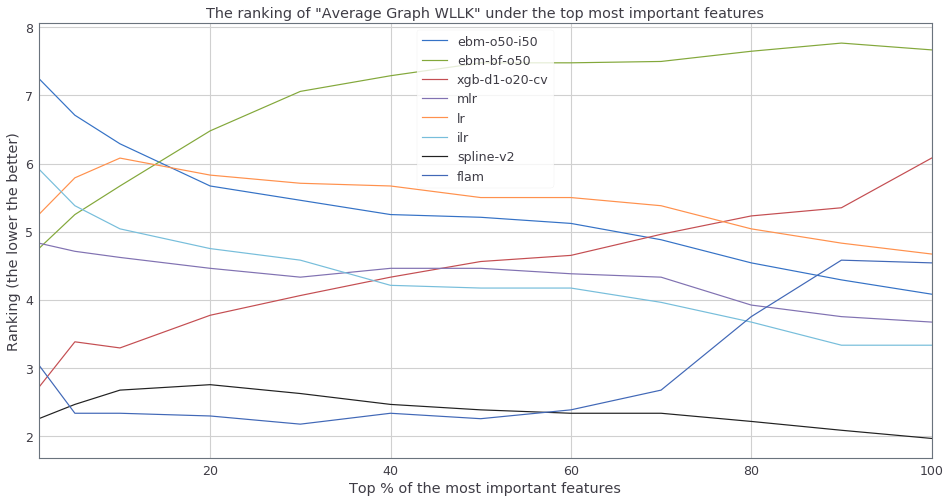

In [338]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(nr_ranks, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Ranking (the lower the better)')
ax.set_title('The ranking of "Average Graph WLLK" under the top most important features')

Text(0.5, 1.0, 'The Normalized Score of "Average Graph WLLK" under the top most important features')

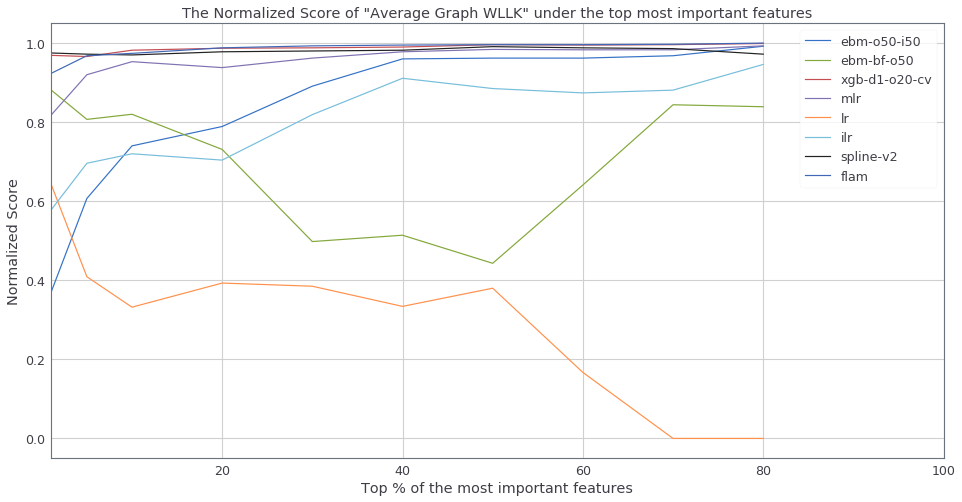

In [339]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(nr_nss, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Normalized Score')
ax.set_title('The Normalized Score of "Average Graph WLLK" under the top most important features')

Text(0.5, 1.0, 'The ranking of "Worst Graph WLLK" under the top most important features')

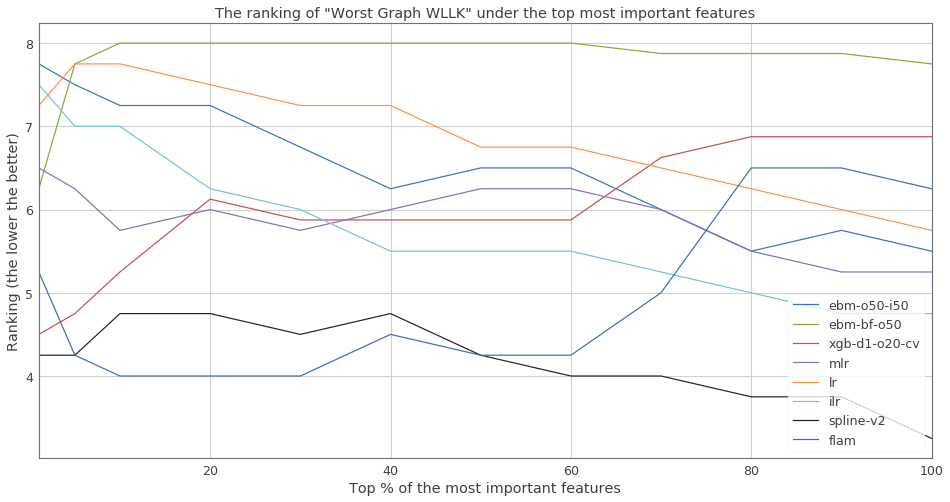

In [340]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(ws_ranks, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Ranking (the lower the better)')
ax.set_title('The ranking of "Worst Graph WLLK" under the top most important features')

Text(0.5, 1.0, 'The Normalized Score of "Worst Graph WLLK" under the top most important features')

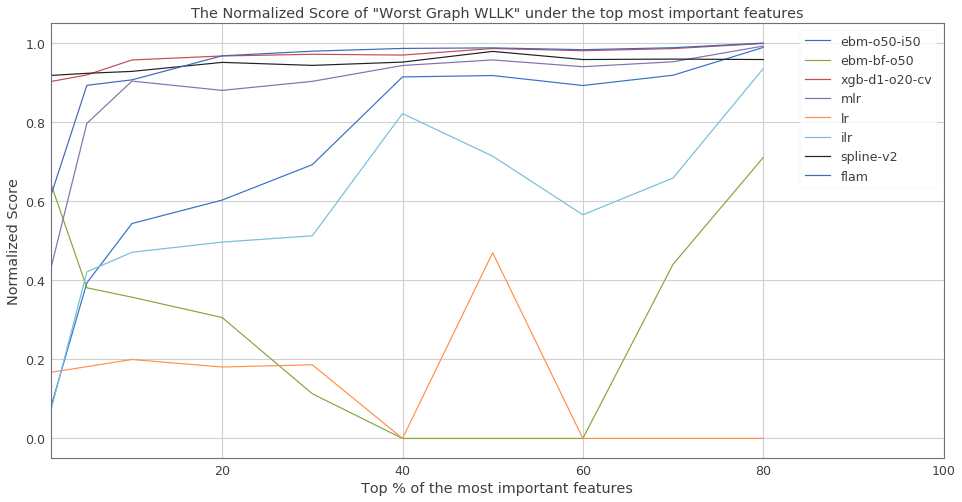

In [341]:
fig, ax = plt.subplots(figsize=(16, 8))
pd.DataFrame(ws_nss, index=names).plot(ax=ax)
ax.set_xlabel('Top % of the most important features')
ax.set_ylabel('Normalized Score')
ax.set_title('The Normalized Score of "Worst Graph WLLK" under the top most important features')

### Bumpiness

In [ ]:
all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o16-i16'].keys()

In [ ]:
def cal_imp_diff(row):
    if row.x is None or len(row.x) <= 2:
        return None
    
    # Numerator is the difference of risk
    num = (row.y[1:] - row.y[:-1])
    if 'sample_weights' in row: # For ground truth
        den = np.sqrt(1. / row.sample_weights[1:] + 1. / row.sample_weights[:-1])
    elif 'y_std' in row: # For model. Use the t-test
        den = np.sqrt((row.y_std[1:] ** 2 + row.y_std[:-1] ** 2) / 2)
    
    result = np.divide(num, den, out=np.zeros_like(num), where=(num != 0))
    
    if np.sum(np.isnan(result)) > 0:
        print(row)
        print(den)
        print(num)
        raise Exception('Dies!')
        
    return np.abs(result)

for k, v in all_dfs.items():
    for k2, v2 in v.items():
        all_dfs[k][k2]['jump_imp'] = v2.apply(cal_imp_diff, axis=1)

#### Run the scatter plot: the x is gnd truth, the y is each jump imp

In [ ]:
def visualize_binary_vars(all_dfs, num_cols=4, baseline_model='ebm-o8', model_names=['skgbt-o8', 'xgb-d1-o8', 'spline', 'ebm-bf-o8', 'spline']):
    num_rows = int(np.ceil(len(all_dfs) / num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(9 * num_cols, 9 * num_rows))

    fig_idx = 0
    for d_name in all_dfs:
        # Plot baseline models
        gnd_truth_df = all_dfs[d_name][baseline_model]
        gt_lookup = gnd_truth_df.set_index('feat_name')

        # Take out the binary feature only
        gnd_truth_df = gnd_truth_df[gnd_truth_df.x.apply(lambda x: x is not None and len(x) == 2)]
        gnd_truth_diff = gnd_truth_df.y.apply(lambda y: y[1] - y[0])

        # Plot Models
        for model_name in model_names:
            if model_name not in all_dfs[d_name]:
                print('%s does not have visualization or does not exist. Skip.' % model_name)
                continue
            
            the_df = all_dfs[d_name][model_name].set_index('feat_name')
            the_df = the_df[the_df.x.apply(lambda x: x is not None and len(x) == 2)]
            model_diff = the_df.y.apply(lambda y: y[1] - y[0])

            axes.flat[fig_idx].scatter(gnd_truth_diff, model_diff, label=model_name)

        axes.flat[fig_idx].set_title(d_name)
        the_limit = np.abs(axes.flat[fig_idx].get_xlim()).max() * np.array([-1, 1])
        axes.flat[fig_idx].plot(the_limit, the_limit, '-', color='grey', alpha=0.5)
        axes.flat[fig_idx].legend()
        axes.flat[fig_idx].set_xlabel(baseline_model + ' Binary Diff')
        axes.flat[fig_idx].set_ylabel('Model Binary Diff')
        fig_idx += 1

    #         fig.suptitle(d_name + 'b%d' % binarize, fontsize=30)
    plt.show()

In [ ]:
plt.figure(figsize=(12, 12))
x = all_dfs[k]['gnd_truth']['jump_imp'].iloc[1]
x /= x.max()

for k2 in ['spline', 'xgb-d1-o20', 'ebm-o30-i30']:
    y = all_dfs[k][k2]['jump_imp'].iloc[1]
    y /= y.max()

    plt.scatter(x, y, label=k2)

plt.plot([0, 1], [0, 1], '-', c='grey', alpha=0.3, )

plt.xlabel('Gnd Truth Jump Imp')
plt.ylabel('Model Jump Imp')
plt.legend()

#### Run spearman

In [ ]:
from scipy.stats import spearmanr

def cal_spearman(row):
    if row.x is None or len(row.x) <= 2:
        return None
    
    gnd_truth_jump_imp = v['gnd_truth'][v['gnd_truth']['feat_name'] == row.feat_name].jump_imp.iloc[0]
    return spearmanr(gnd_truth_jump_imp, row.jump_imp)[1]

for k, v in all_dfs.items():
    for k2, v2 in v.items():
        if k2 == 'gnd_truth':
            continue
        
        all_dfs[k][k2]['spearman'] = v2.apply(cal_spearman, axis=1)

In [ ]:
all_dfs[k][k2].head()

#### Run NDCG

In [ ]:
def DCG_at_k(r, k):
    r = np.asfarray(r)[:k]
    if r.size:
        return np.sum( r / np.log2(np.arange(2, r.size + 2)))
#         return np.sum( (2**r - 1) / np.log2(np.arange(2, r.size + 2)))
    return 0

def NDCG_at_k(r, k):
    IDCG_at_k = DCG_at_k(sorted(r, reverse=True), k)
    if not IDCG_at_k:
        return 0.
    return DCG_at_k(r, k) / IDCG_at_k

In [ ]:
def cal_NDCG(row, k):
    if row.x is None or len(row.x) <= 2:
        return None
    
    gnd_truth_jump_imp = v['gnd_truth'][v['gnd_truth']['feat_name'] == row.feat_name].jump_imp.iloc[0]
    
    sort_idx = np.argsort(row.jump_imp)[::-1]
    r = gnd_truth_jump_imp[sort_idx]
    return NDCG_at_k(r, k)

for k, v in all_dfs.items():
    for k2, v2 in v.items():
        if k2 == 'gnd_truth':
            continue
        
        for the_ndcg_k in [1, 2, 5, 10, 15]:
            all_dfs[k][k2]['ndcg_%d' % the_ndcg_k] = v2.apply(cal_NDCG, k=the_ndcg_k, axis=1)

In [ ]:
v2['ndcg_%d' % the_ndcg_k].tail()

In [ ]:
ndcg = {}

for the_ndcg_k in [1, 2, 5, 10, 15]:
    ndcg['ndcg_%d' % the_ndcg_k] = {}
    for d_name, v1 in all_dfs.items():
        ndcg['ndcg_%d' % the_ndcg_k][d_name] = {}
        for m_name, v2 in v1.items():
            if m_name == 'gnd_truth':
                continue
                
            ndcg['ndcg_%d' % the_ndcg_k][d_name][m_name] = np.nanmean(v2['ndcg_%d' % the_ndcg_k])

In [ ]:
pd.DataFrame(ndcg['ndcg_1']).T

#### Annoying analysis: NDCG might not work

In [ ]:
# k = 'ss_pneumonia_b1_r1377_xgb-d1-o16'
k = 'ss_pneumonia_b1_r1377_ebm-o16-i16'

fig, axes = plt.subplots(3, 1, figsize=(16, 24))

gth_record = all_dfs[k]['gnd_truth'].loc[1]
axes.flat[0].plot(gth_record.x, gth_record.y, label='gnd truth')

gth_rel_rank = pd.Series(gth_record.jump_imp).rank(ascending=True).values
gth_rel_rank /= gth_rel_rank.max()
axes.flat[1].scatter(gth_record.x[1:], gth_rel_rank, label='gnd truth', s=10)

print_results = []
for k2 in ['lr', 'xgb-d1-o20', 'ebm-o30-i30']:
    record = all_dfs[k][k2].loc[1]
    
    axes.flat[0].errorbar(record.x, record.y, record.y_std, label=k2)
    
    jump_imp_rel_rank = pd.Series(record.jump_imp).rank(ascending=True).values
    jump_imp_rel_rank /= jump_imp_rel_rank.max()
    axes.flat[1].scatter(record.x[1:], jump_imp_rel_rank, label=k2, s=10)
    
    print_results.append({
        'model': k2, 
        'spearman': '%.3f' % record.spearman, 
        'ndcg_1': '%.3f' % record.ndcg_1,
        'ndcg_2': '%.3f' % record.ndcg_2,
        'ndcg_5': '%.3f' % record.ndcg_5,
        'ndcg_10': '%.3f' % record.ndcg_10,
    })
    
    axes.flat[2].scatter(gth_rel_rank, jump_imp_rel_rank, label=k2, s=10)

axes.flat[0].legend()
axes.flat[0].set_xticks(np.arange(20, 110, 10))
axes.flat[1].set_ylabel('Relative rank')
axes.flat[2].legend()
axes.flat[2].set_xlabel('Gnd Truth Rel Rank')

pd.DataFrame(print_results)

In [ ]:
# k = 'ss_pneumonia_b1_r1377_xgb-d1-o16'
k = 'ss_pneumonia_b1_r1377_ebm-o16-i16'

fig, axes = plt.subplots(3, 1, figsize=(16, 24))

gth_record = all_dfs[k]['gnd_truth'].loc[1]
axes.flat[0].plot(gth_record.x, gth_record.y, label='gnd truth')

gth_rel_rank = pd.Series(gth_record.jump_imp).rank(ascending=True).values
gth_rel_rank /= gth_rel_rank.max()
axes.flat[1].scatter(gth_record.x[1:], gth_rel_rank, label='gnd truth', s=10)

print_results = []
for k2 in ['lr', 'xgb-d1-o20', 'ebm-o30-i30']:
    record = all_dfs[k][k2].loc[1]
    
    axes.flat[0].errorbar(record.x, record.y, record.y_std, label=k2)
    
    jump_imp_rel_rank = pd.Series(record.jump_imp).rank(ascending=True).values
    jump_imp_rel_rank /= jump_imp_rel_rank.max()
    axes.flat[1].scatter(record.x[1:], jump_imp_rel_rank, label=k2, s=10)
    
    print_results.append({
        'model': k2, 
        'spearman': '%.3f' % record.spearman, 
        'ndcg_1': '%.3f' % record.ndcg_1,
        'ndcg_2': '%.3f' % record.ndcg_2,
        'ndcg_5': '%.3f' % record.ndcg_5,
        'ndcg_10': '%.3f' % record.ndcg_10,
    })
    
    axes.flat[2].scatter(gth_rel_rank, jump_imp_rel_rank, label=k2, s=10)

axes.flat[0].legend()
axes.flat[0].set_xticks(np.arange(20, 110, 10))
axes.flat[1].set_ylabel('Relative rank')
axes.flat[2].legend()
axes.flat[2].set_xlabel('Gnd Truth Rel Rank')

pd.DataFrame(print_results)

In [ ]:

from pandas_utils import rank, normalized_score, add_new_row, highlight_min_max
from general_utils import vector_in

is_metric_higher_better = True

for the_ndcg_k in [1, 2, 5, 10, 15]:
    df_ndcg = pd.DataFrame(ndcg['ndcg_%d' % the_ndcg_k]).T
    mean_score = df_ndcg.apply(lambda x: '%f' % (x.apply(lambda s: float(s[:s.index(' +-')] if isinstance(s, str) and ' +-' in s else s)).mean()), axis=0)
    df_ndcg = add_new_row(df_ndcg, mean_score, 'average')

    average_rank = mean_score.rank(ascending=(not is_metric_higher_better))
    df_ndcg = add_new_row(df_ndcg, average_rank, 'average_rank')

    mean_rank = df_ndcg.apply(rank, axis=1, is_metric_higher_better=is_metric_higher_better).mean()
    df_ndcg = add_new_row(df_ndcg, mean_rank.apply(lambda x: '%.2f' % x), 'avg_rank')

    avg_rank_rank = mean_rank.rank(ascending=True)
    df_ndcg = add_new_row(df_ndcg, avg_rank_rank, 'avg_rank_rank')

    mean_normalized_score = df_ndcg.apply(normalized_score, axis=1, is_metric_higher_better=is_metric_higher_better).mean()
    df_ndcg = add_new_row(df_ndcg, mean_normalized_score.apply(lambda x: '%.3f' % x), 'avg_score')

    avg_score_rank = mean_normalized_score.rank(ascending=(not is_metric_higher_better))
    df_ndcg = add_new_row(df_ndcg, avg_score_rank, 'avg_score_rank')
    
    print('NDCG at k = %d' % the_ndcg_k)
    display(df_ndcg.style.apply(highlight_min_max, axis=1))

#### My own playing

In [ ]:
sort_idx = np.argsort(record.jump_imp)[::-1]
record.jump_imp[sort_idx]

In [ ]:
r = y_imp_gth[sort_idx]

In [ ]:
NDCG_at_k(r, k=10)

In [ ]:
x = all_dfs[k][k2].loc[18]['jump_imp']
y = all_dfs[k]['gnd_truth'].loc[18]['jump_imp']
plt.scatter(x, y)

spearmanr(x, y)[1]

In [ ]:
# Filter the features to be only continuous
age_graph = all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['gnd_truth'].iloc[1]
age_graph

In [ ]:
np.sqrt(1. / (1. / age_graph.sample_weights[1:] + 1. / age_graph.sample_weights[:-1]))

In [ ]:
age_graph.y[1:] - age_graph.y[:-1]

In [ ]:
(age_graph.y[1:] - age_graph.y[:-1]) / np.sqrt(1. / age_graph.sample_weights[1:] + 1. / age_graph.sample_weights[:-1])

In [ ]:
def cal_imp_diff(row):
    if row.x is None or len(row.x) <= 2:
        return None
    
    # Numerator is the difference of risk
    num = (row.y[1:] - row.y[:-1])
    if 'sample_weights' in row: # For ground truth
        den = np.sqrt(1. / row.sample_weights[1:] + 1. / row.sample_weights[:-1])
    elif 'y_std' in row: # For model. Use the t-test
        den = np.sqrt(row.y_std[1:] ** 2 + row.y_std[:-1] ** 2)
    
    return num / den

all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['gnd_truth']['jump_imp'] = \
    all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['gnd_truth'].apply(cal_imp_diff, axis=1)
all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['gnd_truth'].head()

In [ ]:
df = all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['gnd_truth']
plt.scatter(df.loc[1].x[:-1], df.loc[1].jump_imp)

In [ ]:
df.loc[1].jump_imp

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df.loc[1].x, df.loc[1].y)
plt.scatter(df.loc[1].x[:-1], np.abs(df.loc[1].jump_imp))

In [ ]:
all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['ebm-o30-i30'].head()

In [ ]:
def cal_imp_diff(row):
    if row.x is None or len(row.x) <= 2:
        return None
    
    # Get the t-statistics. See wiki https://en.wikipedia.org/wiki/Student%27s_t-test#Independent_two-sample_t-test    
    num = (row.y[1:] - row.y[:-1])
    den = np.sqrt(row.y_std[1:] ** 2 + row.y_std[:-1] ** 2)
    
    return num / den

model_name = 'ebm-o30-i30'

sample_counts = all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']['gnd_truth'].sample_weights
all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16'][model_name]['sample_counts'] = sample_counts

all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16'][model_name]['jump_imp'] = \
    all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16'][model_name].apply(cal_imp_diff, axis=1)
all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16'][model_name].head()

In [ ]:
df = all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16'][model_name]

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(df.loc[1].x, df.loc[1].y)
plt.scatter(df.loc[1].x[:-1], np.abs(df.loc[1].jump_imp) / np.abs(df.loc[1].jump_imp).max())

In [ ]:
plt.errorbar(df.loc[1].x, df.loc[1].y, df.loc[1].y_std)

In [ ]:
the_dfs = all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']
model_names = ['spline', 'ebm-o30-i30', 'ebm-bf-o30', 'skgbt-o20', 'xgb-d1-o20', 'gnd_truth']
# model_names = ['lr', 'ilr', 'mlr', 'ebm-o30-i30']

# feat_name = 'BUN_level'
# feat_name = 'age'
# feat_name = 'bun'

# feat_name = 'BUN_level'
# feat_name = 'asthma'
feat_name = 'age'
# feat_name = 'pCO2'
# feat_name = 'history_of_chest_pain'
# feat_name = 'lobe_or_lung_collapse'

call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

fig, axes = plt.subplots(figsize=(10, 6))
    
for model_name in model_names:
    if model_name not in the_dfs:
        print('%s not in the the_df' % model_name)
        continue

    the_df = the_dfs[model_name]
    the_df_lookup = the_df.set_index('feat_name')

    print(model_name)
    errorbar = 0. if 'y_std' not in the_df_lookup.columns else the_df_lookup.loc[feat_name].y_std
    axes.errorbar(the_df_lookup.loc[feat_name].x, the_df_lookup.loc[feat_name].y, errorbar, label=model_name)
    axes.set_title(feat_name)
    axes.legend()
    
    if feat_name in call_backs:
        call_backs[feat_name](axes)

# plt.xticks(np.arange(20, 110, 10))
# axes.set_ylim(-2, 2)

### Plot the distribution error of features

In [ ]:
cls_record_df.head()

In [ ]:
from pandas_utils import rank, normalized_score, add_new_row, highlight_min_max
from general_utils import vector_in

cls_record_df = all_record_df[~vector_in(all_record_df.d_name, ['calhousing', 'bikeshare'])]
# cls_record_df = cls_record_df[cls_record_df.d_name != 'diabetes']

for metric in ['test_auc', 'test_mse', 'test_aupr', 'test_logloss', 'test_acc']:
# for metric in ['avg_test_auc', 'error_test_mse', 'avg_test_aupr', 'avg_test_logloss', 'avg_test_acc']:

# for metric in ['test_auc', 'test_mse', 'test_aupr', 'test_logloss', 'test_acc', 'train_auc', 'train_aupr', 'train_logloss', 'train_acc']:
    print(metric)
    the_format = '%.4f +- %.4f' if 'mse' not in metric else '%.5f +- %.5f'
    tmp = cls_record_df.groupby(['d_name', 'model_name'], as_index=False)[metric].agg(['mean', 'std']).apply(lambda x: the_format % (x['mean'], x['std']), axis=1)
    
    results = []
    for d_name in tmp.index.levels[0]:
        tmp_df = pd.DataFrame(tmp[d_name]).T
        tmp_df.index = [d_name]
        results.append(tmp_df)
    table = pd.concat(results, axis=0, sort=False)
    
    is_metric_higher_better = (metric in ['test_auc', 'test_aupr', 'test_acc'])
    # Add two rows
    mean_score = table.apply(
        lambda x: x.apply(
            lambda s: float(s[:s.index(' +-')] if (isinstance(s, str) and ' +-' in s) else s)).mean(), axis=0)
    new_table = add_new_row(table, mean_score, 'average')
    avg_rank_rank = mean_rank.rank(ascending=True)

    mean_rank = table.apply(rank, axis=1, is_metric_higher_better=is_metric_higher_better).mean()
    new_table = add_new_row(new_table, mean_rank.apply(lambda x: '%.2f' % x), 'avg_rank')
    
    avg_rank_rank = mean_rank.rank(ascending=True)
    new_table = add_new_row(new_table, avg_rank_rank, 'avg_rank_rank')

    mean_normalized_score = table.apply(normalized_score, axis=1, is_metric_higher_better=is_metric_higher_better).mean()
    new_table = add_new_row(new_table, mean_normalized_score.apply(lambda x: '%.3f' % x), 'avg_score')
    
    avg_score_rank = mean_normalized_score.rank(ascending=False)
    new_table = add_new_row(new_table, avg_score_rank, 'avg_score_rank')
    
    if 'auc' in metric:
        mean_normalized_score_b = table.apply(normalized_score, axis=1, min_value=0.5, is_metric_higher_better=is_metric_higher_better).mean()
        new_table = add_new_row(new_table, mean_normalized_score_b.apply(lambda x: '%.3f' % x), 'avg_score_b0.5')

        avg_score_rank_b = mean_normalized_score_b.rank(ascending=False)
        new_table = add_new_row(new_table, avg_score_rank_b, 'avg_score_b0.5_rank')

    display(new_table.style.apply(highlight_min_max, axis=1))


## Binary plots

In [ ]:
def visualize_binary_vars(all_dfs, num_cols=4, baseline_model='ebm-o8', model_names=['skgbt-o8', 'xgb-d1-o8', 'spline', 'ebm-bf-o8', 'spline']):
    num_rows = int(np.ceil(len(all_dfs) / num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(9 * num_cols, 9 * num_rows))

    fig_idx = 0
    for d_name in all_dfs:
        # Plot baseline models
        gnd_truth_df = all_dfs[d_name][baseline_model]
        gt_lookup = gnd_truth_df.set_index('feat_name')

        # Take out the binary feature only
        gnd_truth_df = gnd_truth_df[gnd_truth_df.x.apply(lambda x: x is not None and len(x) == 2)]
        gnd_truth_diff = gnd_truth_df.y.apply(lambda y: y[1] - y[0])

        # Plot Models
        for model_name in model_names:
            if model_name not in all_dfs[d_name]:
                print('%s does not have visualization or does not exist. Skip.' % model_name)
                continue
            
            the_df = all_dfs[d_name][model_name].set_index('feat_name')
            the_df = the_df[the_df.x.apply(lambda x: x is not None and len(x) == 2)]
            model_diff = the_df.y.apply(lambda y: y[1] - y[0])

            axes.flat[fig_idx].scatter(gnd_truth_diff, model_diff, label=model_name)

        axes.flat[fig_idx].set_title(d_name)
        the_limit = np.abs(axes.flat[fig_idx].get_xlim()).max() * np.array([-1, 1])
        axes.flat[fig_idx].plot(the_limit, the_limit, '-', color='grey', alpha=0.5)
        axes.flat[fig_idx].legend()
        axes.flat[fig_idx].set_xlabel(baseline_model + ' Binary Diff')
        axes.flat[fig_idx].set_ylabel('Model Binary Diff')
        fig_idx += 1

    #         fig.suptitle(d_name + 'b%d' % binarize, fontsize=30)
    plt.show()

In [ ]:
visualize_binary_vars(all_dfs, num_cols=4, baseline_model='gnd_truth', model_names=['lr', 'ebm-o30-i30', 'ebm-bf-o30', 'skgbt-o20', 'spline', 'xgb-d1-o20'])

# Main Effects Visualization

## Overall summary in pneumonia

ebm-o50-i50
ebm-bf-o50
xgb-d1-o20-cv
flam
spline-v2
gnd_truth


ValueError: The lengths of the data (353) and the error 256 do not match

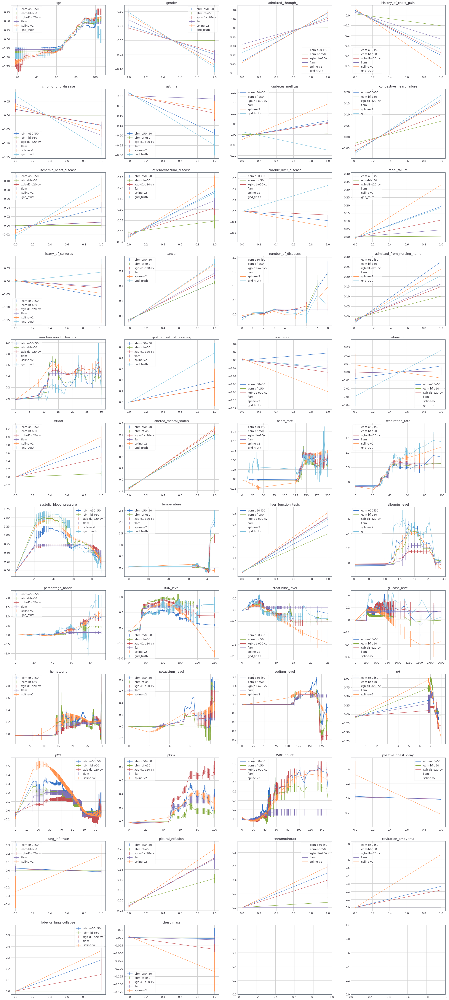

In [232]:
fig, axes = vis_main_effects(all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50'], model_names=['ebm-o50-i50', 'ebm-bf-o50', 'xgb-d1-o20-cv', 'flam', 'spline-v2', 'gnd_truth'], call_backs=None)


In [130]:
from vis_utils import vis_main_effects

In [ ]:
all_dfs.keys()

In [ ]:
all_dfs['ss_pneumonia_b1_r1377_spline'].keys()

## Rspline-v2 v.s. spline-v2 has a huge wierd MSE

In [147]:
all_tables['test_auc'].loc['ss_adult_b1_r1377_ebm-bf-o50', ['rspline-v2', 'spline-v2']]

model_name
rspline-v2    0.9180 +- 0.0050
spline-v2     0.9125 +- 0.0049
Name: ss_adult_b1_r1377_ebm-bf-o50, dtype: object

In [138]:
all_tables['test_auc'].loc['ss_breast_b1_r1377_ebm-bf-o50', ['rspline-v2', 'spline-v2']]

model_name
rspline-v2    0.9832 +- 0.0201
spline-v2     0.9886 +- 0.0108
Name: ss_breast_b1_r1377_ebm-bf-o50, dtype: object

In [137]:
all_tables['test_mse'].loc['ss_breast_b1_r1377_ebm-bf-o50', ['rspline-v2', 'spline-v2']]

model_name
rspline-v2    0.03748 +- 0.02121
spline-v2     0.04311 +- 0.01415
Name: ss_breast_b1_r1377_ebm-bf-o50, dtype: object

In [142]:
all_dfs['ss_breast_b1_r1377_ebm-bf-o50']['rspline-v2'].loc[1, 'feat_name'], all_dfs['ss_breast_b1_r1377_ebm-bf-o50']['rspline-v2'].loc[1, 'x'].shape

('mean radius', (456,))

spline-v2
rspline-v2
gnd_truth


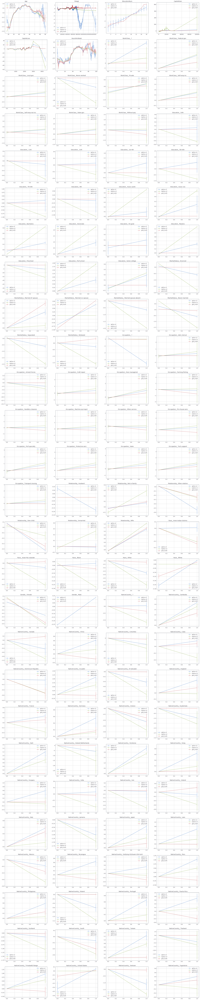

In [146]:
fig, axes = vis_main_effects(all_dfs['ss_adult_b1_r1377_ebm-bf-o50'], model_names=['spline-v2', 'rspline-v2', 'gnd_truth'], call_backs=None)

In [172]:
from vis_utils import vis_main_effects

spline-v2
rspline-v2
rspline-v2-s
gnd_truth


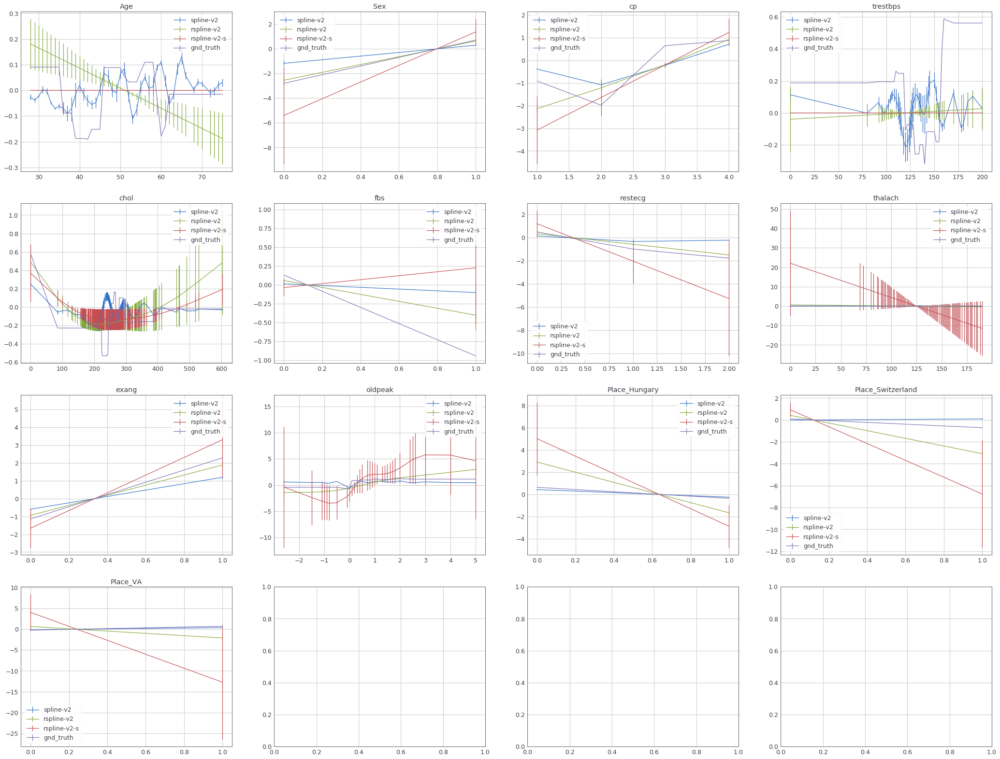

In [173]:
fig, axes = vis_main_effects(all_dfs['ss_heart_b1_r1377_flam'], model_names=['spline-v2', 'rspline-v2', 'rspline-v2-s', 'gnd_truth'], call_backs=None)

## Spline gnd truth

In [9]:
all_dfs.keys()

dict_keys(['ss_adult_b1_r1377_flam', 'ss_adult_b1_r1377_lr', 'ss_adult_b1_r1377_spline-v2', 'ss_breast_b1_r1377_ebm-o50-i50', 'ss_breast_b1_r1377_flam', 'ss_breast_b1_r1377_lr', 'ss_breast_b1_r1377_spline-v2', 'ss_churn_b1_r1377_ebm-o50-i50-q', 'ss_churn_b1_r1377_flam', 'ss_churn_b1_r1377_lr', 'ss_churn_b1_r1377_spline-v2', 'ss_heart_b1_r1377_ebm-o50-i50-q', 'ss_heart_b1_r1377_flam', 'ss_heart_b1_r1377_lr', 'ss_heart_b1_r1377_spline-v2', 'ss_mimicii_b1_r1377_ebm-o50-i50', 'ss_mimicii_b1_r1377_flam', 'ss_mimicii_b1_r1377_lr', 'ss_mimicii_b1_r1377_spline-v2', 'ss_mimiciii_b1_r1377_ebm-o50-i50', 'ss_mimiciii_b1_r1377_flam', 'ss_mimiciii_b1_r1377_lr', 'ss_mimiciii_b1_r1377_spline-v2', 'ss_pneumonia_b1_r1377_ebm-o50-i50', 'ss_pneumonia_b1_r1377_flam', 'ss_pneumonia_b1_r1377_lr', 'ss_pneumonia_b1_r1377_spline-v2'])

spline-v2
flam
ebm-o50-i50
xgb-d1-o20-cols1
gnd_truth


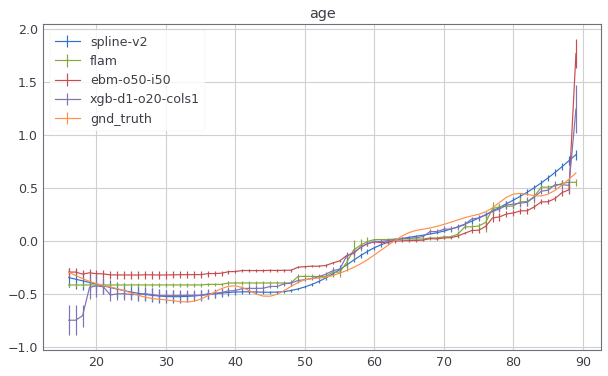

In [15]:
the_dfs = all_dfs['ss_mimiciii_b1_r1377_spline-v2']
model_names = ['spline-v2', 'flam', 'ebm-o50-i50', 'xgb-d1-o20-cols1', 'gnd_truth']
# model_names = ['lr', 'ilr', 'mlr', 'ebm-o30-i30']

# feat_name = 'BUN_level'
# feat_name = 'age'
# feat_name = 'bun'

# feat_name = 'BUN_level'
# feat_name = 'asthma'
feat_name = 'age'
# feat_name = 'pCO2'
# feat_name = 'history_of_chest_pain'
# feat_name = 'lobe_or_lung_collapse'

call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

fig, axes = plt.subplots(figsize=(10, 6))
    
for model_name in model_names:
    if model_name not in the_dfs:
        print('%s not in the the_df' % model_name)
        continue

    the_df = the_dfs[model_name]
    the_df_lookup = the_df.set_index('feat_name')

    print(model_name)
    errorbar = 0. if 'y_std' not in the_df_lookup.columns else the_df_lookup.loc[feat_name].y_std
    axes.errorbar(the_df_lookup.loc[feat_name].x, the_df_lookup.loc[feat_name].y, errorbar, label=model_name)
    axes.set_title(feat_name)
    axes.legend()
    
    if feat_name in call_backs:
        call_backs[feat_name](axes)

# plt.xticks(np.arange(20, 110, 10))
# axes.set_ylim(-2, 2)

# Paper graph

In [10]:
from vis_utils import vis_main_effects

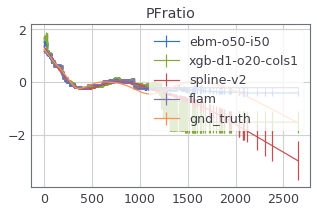

In [81]:
gnd_truth='spline-v2'

# feat_name = 'AIDS'
feat_name = 'PFratio'
# feat_name = 'SBP'
# feat_name = 'Age'

fig, axes = vis_main_effects(all_dfs['ss_mimicii_b1_r1377_%s' % gnd_truth], model_names=['ebm-o50-i50', 'xgb-d1-o20-cols1', 'spline-v2', 'flam', 'gnd_truth'], feature_names=[feat_name], figsize =(5, 3), num_cols=1)

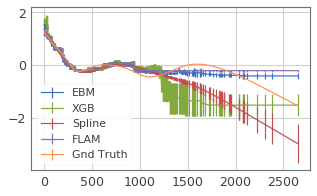

In [82]:
axes.legend(['EBM', 'XGB', 'Spline', 'FLAM', 'Gnd Truth'], fontsize=11, loc = 'lower left')
# axes.legend(['EBM', 'XGB', 'Spline', 'FLAM', 'Gnd Truth'], fontsize=12)
axes.set_title('')
fig.savefig('notebooks/figures/SS_Spline_%s.pdf' % feat_name, bbox_inches='tight', dpi=300)
fig

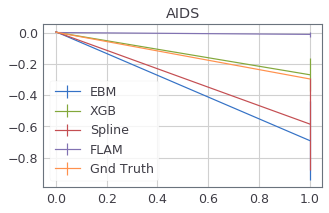

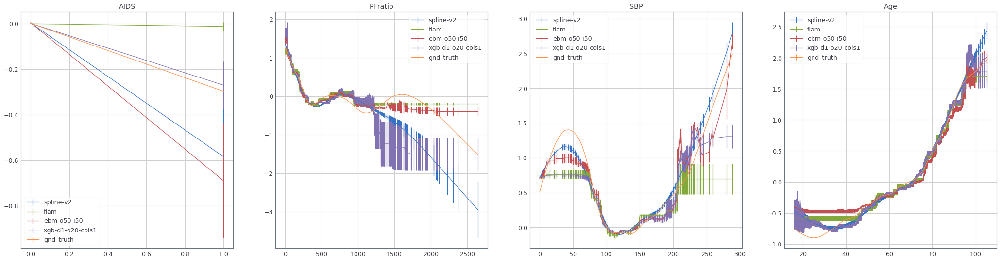

In [30]:
fig, axes = vis_main_effects(all_dfs['ss_mimicii_b1_r1377_spline-v2'], model_names=['spline-v2', 'flam', 'ebm-o50-i50', 'xgb-d1-o20-cols1', 'gnd_truth'], call_backs=call_backs, feature_names=['AIDS', 'PFratio', 'SBP', 'Age'])

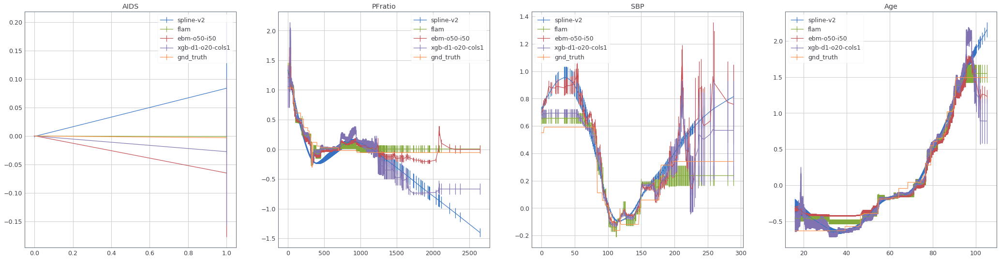

In [31]:
fig, axes = vis_main_effects(all_dfs['ss_mimicii_b1_r1377_flam'], model_names=['spline-v2', 'flam', 'ebm-o50-i50', 'xgb-d1-o20-cols1', 'gnd_truth'], call_backs=call_backs, feature_names=['AIDS', 'PFratio', 'SBP', 'Age'])

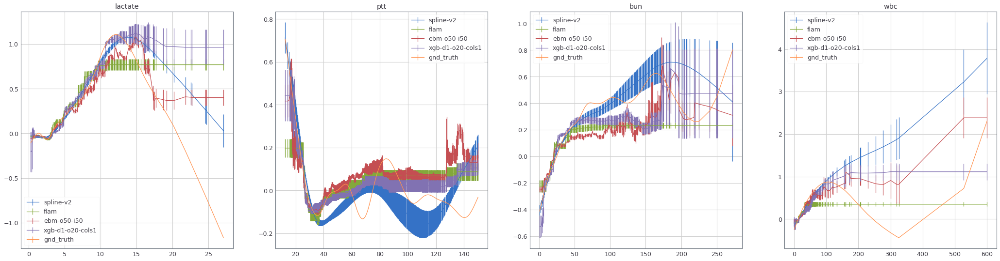

In [26]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

fig, axes = vis_main_effects(all_dfs['ss_mimicii_b1_r1377_spline-v2'], model_names=['spline-v2', 'flam', 'ebm-o50-i50', 'xgb-d1-o20-cols1', 'gnd_truth'], call_backs=call_backs, feature_names=['lactate', 'ptt', 'bun', 'wbc'])

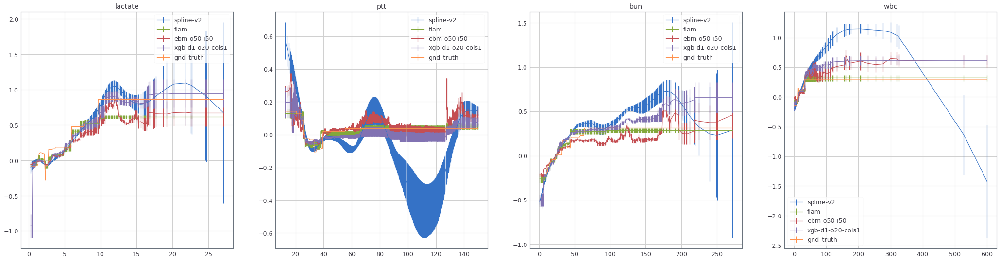

In [27]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

fig, axes = vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_flam'], model_names=['spline-v2', 'flam', 'ebm-o50-i50', 'xgb-d1-o20-cols1', 'gnd_truth'], call_backs=call_backs, feature_names=['lactate', 'ptt', 'bun', 'wbc'])

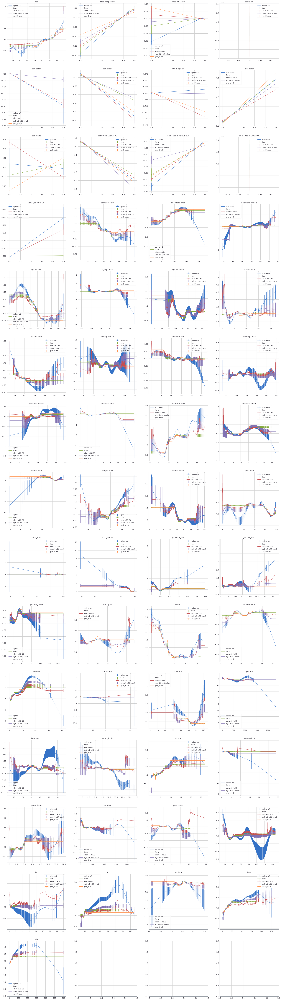

In [28]:
fig, axes = vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_flam'], model_names=['spline-v2', 'flam', 'ebm-o50-i50', 'xgb-d1-o20-cols1', 'gnd_truth'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_spline'], model_names=['ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=None)

## EBM ground truth

In [ ]:
the_dfs = all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16']
model_names = ['spline', 'ebm-o30-i30', 'ebm-bf-o30', 'skgbt-o20', 'xgb-d1-o20', 'gnd_truth']
# model_names = ['lr', 'ilr', 'mlr', 'ebm-o30-i30']

# feat_name = 'BUN_level'
# feat_name = 'age'
# feat_name = 'bun'

# feat_name = 'BUN_level'
# feat_name = 'asthma'
feat_name = 'age'
# feat_name = 'pCO2'
# feat_name = 'history_of_chest_pain'
# feat_name = 'lobe_or_lung_collapse'

call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

fig, axes = plt.subplots(1, 2, figsize=(10, 6))
    
for model_name in model_names:
    if model_name not in the_dfs:
        print('%s not in the the_df' % model_name)
        continue

    the_df = the_dfs[model_name]
    the_df_lookup = the_df.set_index('feat_name')

    print(model_name)
    errorbar = 0. if 'y_std' not in the_df_lookup.columns else the_df_lookup.loc[feat_name].y_std
    axes.flat[0].errorbar(the_df_lookup.loc[feat_name].x, the_df_lookup.loc[feat_name].y, errorbar, label=model_name)
    axes.flat[0].set_title(feat_name)
    axes.flat[0].legend()
    
    if feat_name in call_backs:
        call_backs[feat_name](axes.flat[0])
    
# plt.xticks(np.arange(20, 110, 10))
# axes.set_ylim(-2, 2)

In [ ]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

vis_main_effects(all_dfs['ss_pneumonia_b1_r1377_ebm-o16-i16'], model_names=['ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_ebm-o16-i16'], model_names=['ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=None)

## EBM-BF

In [ ]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

vis_main_effects(all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o16-i16'], model_names=['ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_ebm-bf-o16-i16'], model_names=['ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=None)

## XGB-D1

In [ ]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

vis_main_effects(all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o16'], model_names=['spline', 'ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_ebm-o16-i16'], model_names=['ebm-o16', 'ebm-bf-o16', 'xgb-d1-o16', 'skgbt-o16', 'gnd_truth'], call_backs=None)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b0_r1377_ebm-o16-i16'], model_names=['ebm-o16', 'ebm-bf-o16', 'xgb-d1-o16', 'skgbt-o16', 'gnd_truth'], call_backs=None)

## LR

In [ ]:
the_dfs = all_dfs['ss_pneumonia_b1_r1377_lr']
model_names = ['lr', 'spline', 'ebm-o30-i30', 'ebm-bf-o30', 'skgbt-o20', 'xgb-d1-o20', 'gnd_truth']
# model_names = ['lr', 'ilr', 'mlr', 'ebm-o30-i30']

# feat_name = 'BUN_level'
# feat_name = 'age'
# feat_name = 'bun'

# feat_name = 'BUN_level'
# feat_name = 'asthma'
feat_name = 'age'
# feat_name = 'pCO2'
# feat_name = 'history_of_chest_pain'
# feat_name = 'lobe_or_lung_collapse'

call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

fig, axes = plt.subplots(figsize=(10, 6))
    
for model_name in model_names:
    if model_name not in the_dfs:
        print('%s not in the the_df' % model_name)
        continue

    the_df = the_dfs[model_name]
    the_df_lookup = the_df.set_index('feat_name')

    print(model_name)
    errorbar = 0. if 'y_std' not in the_df_lookup.columns else the_df_lookup.loc[feat_name].y_std
    axes.errorbar(the_df_lookup.loc[feat_name].x, the_df_lookup.loc[feat_name].y, errorbar, label=model_name)
    axes.set_title(feat_name)
    axes.legend()
    
    if feat_name in call_backs:
        call_backs[feat_name](axes)

# plt.xticks(np.arange(20, 110, 10))
# axes.set_ylim(-2, 2)

In [ ]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

vis_main_effects(all_dfs['ss_pneumonia_b1_r1377_lr'], model_names=['lr', 'spline', 'ebm-o30-i30', 'ebm-bf-o30', 'xgb-d1-o20', 'skgbt-o20', 'gnd_truth'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['ss_pneumonia_b0_r1377_lr'], model_names=['ebm-o16', 'ebm-bf-o16', 'xgb-d1-o16', 'skgbt-o16', 'gnd_truth'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b1_r1377_lr'], model_names=['ebm-o16', 'ebm-bf-o16', 'xgb-d1-o16', 'skgbt-o16', 'gnd_truth'], call_backs=None)

In [ ]:
vis_main_effects(all_dfs['ss_mimiciii_b0_r1377_lr'], model_names=['ebm-o16', 'ebm-bf-o16', 'xgb-d1-o16', 'skgbt-o16', 'gnd_truth'], call_backs=None)

## Compare the same model on different ground truth dataets

### XGB-d1

In [ ]:
datasets = ['ss_pneumonia_b1_r1377_spline', 'ss_pneumonia_b1_r1377_ebm-o16-i16', 'ss_pneumonia_b1_r1377_ebm-bf-o16-i16', 'ss_pneumonia_b1_r1377_xgb-d1-o16', 'ss_pneumonia_b1_r1377_lr']
tmp = {k: all_dfs[k]['xgb-d1-o16'] for k in datasets}
vis_main_effects(tmp, model_names=datasets, call_backs=call_backs)

# Compare with shuffling

In [64]:
shuffle_record_df = pd.read_csv('./results/0201_ss_shuffle.csv')
shuffle_record_df.tail()

,d_name,model_name,split_idx,n_splits,random_state,fit_time,test_size,test_auc,test_aupr,test_mse,test_acc,test_logloss,train_auc,train_aupr,train_mse,train_acc,train_logloss,model_path
110,ss_pneumonia_b1_r1377_ebm-bf-o50_sh,ebm-bf-o50,0,5,1377,26.338264,0.15,0.689701,0.176781,0.072906,0.917371,0.268108,0.725158,0.224585,0.071434,0.917309,0.261580,models/0201_ss_shuffle/ss_pneumonia_b1_r1377_e...
111,ss_pneumonia_b1_r1377_ebm-bf-o50_sh,ebm-bf-o50,1,5,1377,18.314651,0.15,0.715188,0.219256,0.071505,0.917371,0.262490,0.719353,0.215532,0.071818,0.917309,0.263385,models/0201_ss_shuffle/ss_pneumonia_b1_r1377_e...
112,ss_pneumonia_b1_r1377_ebm-bf-o50_sh,ebm-bf-o50,2,5,1377,16.938782,0.15,0.666875,0.172678,0.073220,0.917371,0.270824,0.724108,0.219584,0.071556,0.917143,0.262065,models/0201_ss_shuffle/ss_pneumonia_b1_r1377_e...
113,ss_pneumonia_b1_r1377_ebm-bf-o50_sh,ebm-bf-o50,3,5,1377,22.364311,0.15,0.683653,0.198578,0.072473,0.917371,0.267745,0.726156,0.220331,0.071499,0.917143,0.261629,models/0201_ss_shuffle/ss_pneumonia_b1_r1377_e...
114,ss_pneumonia_b1_r1377_ebm-bf-o50_sh,ebm-bf-o50,4,5,1377,24.033149,0.15,0.677500,0.191514,0.072610,0.917371,0.268509,0.727362,0.224914,0.071430,0.917226,0.261503,models/0201_ss_shuffle/ss_pneumonia_b1_r1377_e...


In [65]:
for d_name in np.sort(shuffle_record_df.d_name.unique()):
    path = 'results/0201-0201_ss_shuffle-df/%s.pkl' % d_name
    if os.path.exists(path):
        print(d_name)
        all_dfs[d_name] = pickle.load(open(path, 'rb'))        

ss_pneumonia_b1_r1377_ebm-bf-o50_sh
ss_pneumonia_b1_r1377_ebm-bf-o50_sh0.2
ss_pneumonia_b1_r1377_ebm-bf-o50_sh0.5
ss_pneumonia_b1_r1377_ebm-bf-o50_sh0.8
ss_pneumonia_b1_r1377_ebm-o50-i50_sh
ss_pneumonia_b1_r1377_flam_sh
ss_pneumonia_b1_r1377_spline-v2_sh
ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh
ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh0.2
ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh0.5
ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh0.8


## Results

In [66]:
all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh'].keys()

dict_keys(['ebm-o50-i50', 'xgb-d1-o20-cv', 'flam', 'spline-v2', 'gnd_truth'])

### EBM-BF no correlation vs correlation

ebmbf-pneumonia-no-corr
ebmbf-pneumonia-no-corr-0.5
ebmbf-pneumonia
gnd_truth


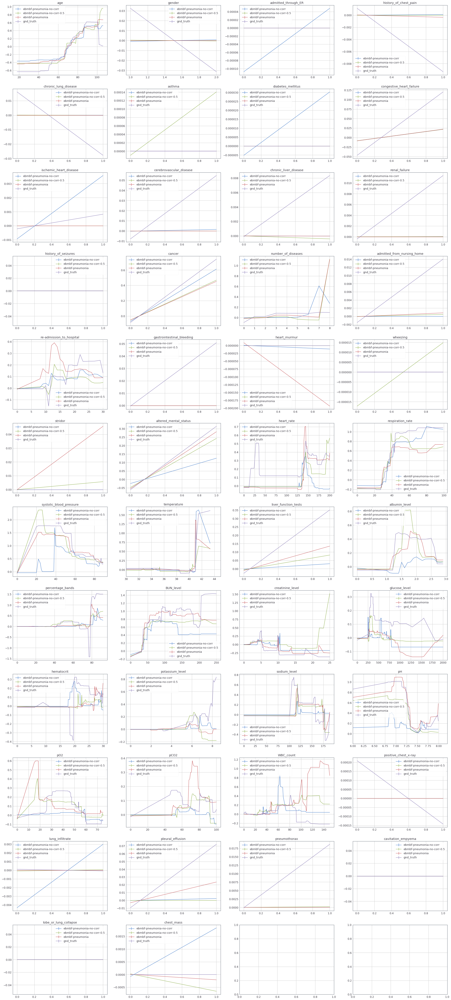

In [63]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

new_df = {
    'ebmbf-pneumonia-no-corr': all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o50_sh']['ebm-bf-o50'],
#     'ebmbf-pneumonia-no-corr-0.8': all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o50_sh0.8']['ebm-bf-o50'],
    'ebmbf-pneumonia-no-corr-0.5': all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o50_sh0.5']['ebm-bf-o50'],
#     'ebmbf-pneumonia-no-corr-0.2': all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o50_sh0.2']['ebm-bf-o50'],
    'ebmbf-pneumonia': all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o50']['ebm-bf-o50'],
    'gnd_truth': all_dfs['ss_pneumonia_b1_r1377_ebm-bf-o50']['gnd_truth'],
}

vis_main_effects(new_df, call_backs=call_backs)

### XGB no correlation vs correlation

xgb-pneumonia-no-corr
xgb-pneumonia-no-corr-0.5
xgb-pneumonia
gnd_truth


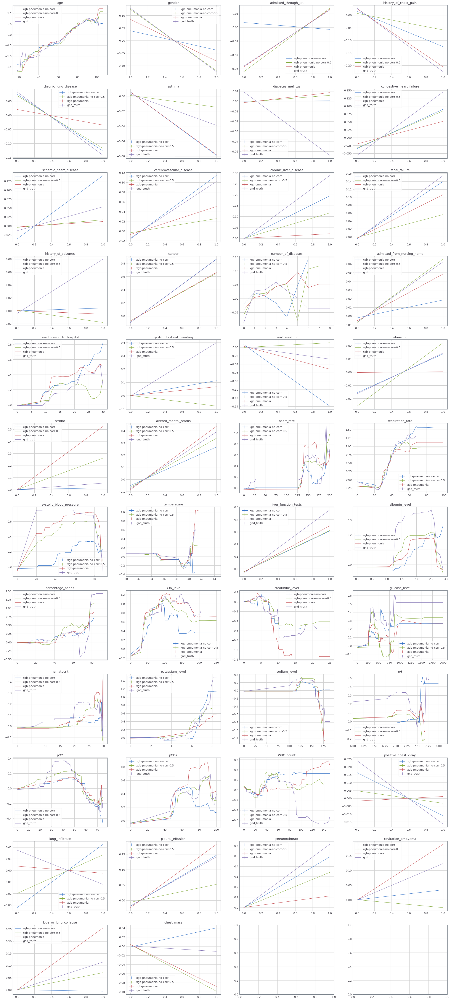

In [67]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

new_df = {
    'xgb-pneumonia-no-corr': all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh']['xgb-d1-o20-cv'],
#     'xgb-pneumonia-no-corr-0.8': all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh0.8']['xgb-d1-o20-cv'],
    'xgb-pneumonia-no-corr-0.5': all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh0.5']['xgb-d1-o20-cv'],
#     'xgb-pneumonia-no-corr-0.2': all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv_sh0.2']['xgb-d1-o20-cv'],
    'xgb-pneumonia': all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv']['xgb-d1-o20-cv'],
    'gnd_truth': all_dfs['ss_pneumonia_b1_r1377_xgb-d1-o20-cv']['gnd_truth'],
}

vis_main_effects(new_df, call_backs=call_backs)

### EBM no correlation vs correlation

In [69]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

new_df = {
    'ebm-pneumonia-no-corr': all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50_sh']['ebm-o50-i50'],
#     'ebm-pneumonia-no-corr-0.8': all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50_sh0.8']['ebm-o50-i50'],
    'ebm-pneumonia-no-corr-0.5': all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50_sh0.5']['ebm-o50-i50'],
#     'ebm-pneumonia-no-corr-0.2': all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50_sh0.2']['ebm-o50-i50'],
    'ebm-pneumonia': all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50']['ebm-o50-i50'],
    'gnd_truth': all_dfs['ss_pneumonia_b1_r1377_ebm-o50-i50']['gnd_truth'],
}

vis_main_effects(new_df, call_backs=call_backs)

[autoreload of models_utils failed: Traceback (most recent call last):
  File "/home/intelligible/miniconda3/envs/kingsley/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/home/intelligible/miniconda3/envs/kingsley/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/home/intelligible/miniconda3/envs/kingsley/lib/python3.7/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/home/intelligible/miniconda3/envs/kingsley/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 728, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/media/intdisk/kingsley/ebm-internship/models_utils.py", line 12, in <module>
    from

KeyError: 'ss_pneumonia_b1_r1377_ebm-o50-i50_sh0.5'

# OLD

## Pneumonia

In [ ]:
pneumonia_df = all_record_df[all_record_df.d_name.apply(lambda x: 'pneumonia' in x)]
pneumonia_df.head()

### Performance

In [ ]:
tmp = pneumonia_df.groupby('model_name', as_index=False).agg(['mean', 'std'])[['test_auc', 'test_aupr', 'test_mse', 'train_auc', 'train_aupr', 'train_mse', 'fit_time']]
table = tmp.groupby(level=0, axis=1).apply(lambda x: x.apply(lambda x: '%.3f +- %.3f' % (x[0], x[1]), axis=1))
table.style.apply(highlight_min_max)

In [ ]:
import seaborn as sns

fig, axes = plt.subplots(2, 3, figsize=(35, 20))
    
sns.barplot(data=pneumonia_df, x='model_name', y='test_auc', ax=axes.flat[0])    
sns.barplot(data=pneumonia_df, x='model_name', y='test_mse', ax=axes.flat[1])
sns.barplot(data=pneumonia_df, x='model_name', y='test_aupr', ax=axes.flat[2])

sns.barplot(data=pneumonia_df, x='model_name', y='train_auc', ax=axes.flat[3])    
sns.barplot(data=pneumonia_df, x='model_name', y='train_mse', ax=axes.flat[4])
sns.barplot(data=pneumonia_df, x='model_name', y='train_aupr', ax=axes.flat[5])

for ax in axes.flat:
    ax.xaxis.set_tick_params(rotation=45)
plt.show()

### Qualitative analysis

In [ ]:
def vis_main_effects(all_dfs, num_cols = 4, model_names=['ebm-o8', 'skgbt-o8', 'xgb-d1-o8', 'spline', 'ebm-bf-o8', 'spline'], call_backs=None):
    the_vis_names = all_dfs[next(iter(all_dfs))].feat_name.unique()
    the_vis_names = the_vis_names[the_vis_names != 'offset']

    num_rows = int(np.ceil(len(the_vis_names) / num_cols))
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(9 * num_cols, 7 * num_rows))
    
    for model_name in model_names:
        if model_name not in all_dfs:
            print('%s not in the all_dfs' % model_name)
            continue
        
        the_df = all_dfs[model_name]
        the_df_lookup = the_df.set_index('feat_name')
        
        print(model_name)
        for f_idx, feat_name in enumerate(the_vis_names):
            axes.flat[f_idx].errorbar(the_df_lookup.loc[feat_name].x, the_df_lookup.loc[feat_name].y, the_df_lookup.loc[feat_name].y_std, label=model_name)

            axes.flat[f_idx].set_title(feat_name)
            axes.flat[f_idx].legend()
    
            if call_backs is not None and feat_name in call_backs:
                call_backs[feat_name](axes.flat[f_idx])

#### Linear model comprisons

In [ ]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

vis_main_effects(all_dfs['pneumonia'], model_names=['ilr', 'lr', 'mlr', 'ebm-o16-i16'], call_backs=call_backs)

#### Bagging comparison

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['ebm', 'ebm-o8', 'ebm-o16-i16'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['ebm-bf', 'ebm-bf-o8', 'ebm-bf-o16-i16'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs, model_names=['xgb-d1', 'xgb-d1-o8', 'xgb-d1-o16'], call_backs=call_backs)

#### ebm vs ebm-bf

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['ebm-bf', 'ebm'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['ebm-bf-o8', 'ebm-o16-i16'], call_backs=call_backs)

#### skgbt vs ebm-bf vs xgb

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['skgbt', 'ebm-bf', 'xgb-d1'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['skgbt-o8', 'ebm-bf-o8', 'xgb-d1-o16'], call_backs=call_backs)

#### Best models

In [ ]:
vis_main_effects(all_dfs['pneumonia'], model_names=['ebm-bf-o8', 'ebm-o16-i16', 'rf-n1000', 'skgbt-o8', 'spline', 'xgb-d1-o16'])

## MIMIC

In [ ]:
mimiciii_df = all_record_df[all_record_df.d_name == 'mimiciii']
mimiciii_df.head()

### Performance

In [ ]:
tmp = mimiciii_df.groupby('model_name', as_index=False).agg(['mean', 'std'])[['test_auc', 'test_aupr', 'test_mse', 'train_auc', 'train_aupr', 'train_mse', 'fit_time']]
table = tmp.groupby(level=0, axis=1).apply(lambda x: x.apply(lambda x: '%.3f +- %.3f' % (x[0], x[1]), axis=1))
table.style.apply(highlight_min_max)

In [ ]:
import seaborn as sns

fig, axes = plt.subplots(2, 3, figsize=(35, 20))
    
sns.barplot(data=mimiciii_df, x='model_name', y='test_auc', ax=axes.flat[0])    
sns.barplot(data=mimiciii_df, x='model_name', y='test_mse', ax=axes.flat[1])
sns.barplot(data=mimiciii_df, x='model_name', y='test_aupr', ax=axes.flat[2])

sns.barplot(data=mimiciii_df, x='model_name', y='train_auc', ax=axes.flat[3])    
sns.barplot(data=mimiciii_df, x='model_name', y='train_mse', ax=axes.flat[4])
sns.barplot(data=mimiciii_df, x='model_name', y='train_aupr', ax=axes.flat[5])

for ax in axes.flat:
    ax.xaxis.set_tick_params(rotation=45)
plt.show()

### Qualitative analysis

#### Linear model comprisons

In [ ]:
call_backs = {
    'temperature': lambda ax: ax.set_xlim(30, 45), 
    'pH': lambda ax: ax.set_xlim(6, 8.2), 
}

vis_main_effects(all_dfs['mimiciii'], model_names=['ilr', 'lr', 'mlr', 'ebm-o16-i16'], call_backs=call_backs)

#### Bagging comparison

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['ebm', 'ebm-o8', 'ebm-o16-i16'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['ebm-bf', 'ebm-bf-o8', 'ebm-bf-o16-i16'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['xgb-d1', 'xgb-d1-o8', 'xgb-d1-o16'], call_backs=call_backs)

#### ebm vs ebm-bf

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['ebm-bf', 'ebm'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['ebm-bf-o8', 'ebm-o16-i16'], call_backs=call_backs)

#### skgbt vs ebm-bf vs xgb

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['skgbt', 'ebm-bf', 'xgb-d1'], call_backs=call_backs)

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['skgbt-o8', 'ebm-bf-o8', 'xgb-d1-o16'], call_backs=call_backs)

#### Best models

In [ ]:
vis_main_effects(all_dfs['mimiciii'], model_names=['ebm-bf-o8', 'ebm-o16-i16', 'rf-n1000', 'skgbt-o8', 'spline', 'xgb-d1-o16'])

## Small Experiment

### XGB CW=0 vs 1

In [ ]:
the_vis_names = all_dfs[next(iter(all_dfs))].feat_name.unique()
the_vis_names = the_vis_names[the_vis_names != 'offset']
num_cols = 4

num_rows = int(np.ceil(len(the_vis_names) / num_cols))
fig, axes = plt.subplots(num_rows, num_cols, figsize=(9 * num_cols, 7 * num_rows))

for model_name, the_df in all_dfs.items():
    if model_name not in ['xgb-d1', 'xgb-d1-cw0']:
        continue
#     if model_name in ['ebm-o8', 'skgbt-o8', 'xgb-d1-o8']:
#         continue
    
    print(model_name)
    for f_idx, feat_name in enumerate(the_vis_names):
        axes.flat[f_idx].errorbar(the_df.loc[f_idx].x, the_df.loc[f_idx].y, the_df.loc[f_idx].y_std, label=model_name)

        axes.flat[f_idx].set_title(feat_name)
        axes.flat[f_idx].legend()

In [ ]:
import pickle
model = 
# model = pickle.load(open('models/082319_datasets/diabetes_ebm-o16-i16_r1377_0_10.pkl', 'rb'))

In [ ]:
def tmp(x):
    model = pickle.load(open(x, 'rb'))
    if 'feature_names' in model.__dict__ and len(model.feature_names) == 1156:
        os.remove(x)
        return 1
    return 0

is_old = all_record_df[all_record_df.d_name == 'diabetes'].model_path.apply(tmp)
is_old.sum()

In [ ]:
all_record_df[all_record_df.d_name == 'diabetes'][is_old == 1]

In [ ]:
# all_dfs = {}
# for d_name, df2 in all_record_df.groupby('d_name'):
#     for model_name, df in df2.groupby('model_name'):
#         print(d_name, model_name)
#         if d_name not in all_dfs:
#             all_dfs[d_name] = {}
        
#         models = df.model_path.apply(lambda x: pickle.load(open(x, 'rb')))
#         all_dfs[d_name][model_name] = get_GAM_plot_dataframe_by_models(models.tolist())

# pickle.dump(all_dfs, open('results/082319_datasets_all_dfs.pkl', 'wb'))

In [ ]:
all_dfs = pickle.load(open('results/082319_datasets_all_dfs.pkl', 'rb'))

## Modify some records

In [ ]:
# for rid, row in all_record_df.iterrows():
#     if row.model_name in ['skgbt']:
#         if os.path.exists(row.model_path):
#             os.remove(row.model_path)

# all_record_df = all_record_df[all_record_df.model_name.apply(lambda x: x not in ['skgbt'])]

In [ ]:
# all_record_df['test_size'] = all_record_df.apply(lambda x: 0.3065004577787168 if x.d_name == 'pneumonia' else 0.33, axis=1)

In [ ]:
all_record_df.head()

In [ ]:
loaddata_utils.load_pneumonia_data()['test_size']

In [ ]:
all_record_df.head()

In [ ]:
# all_record_df.to_csv('./results/082319_datasets.csv', index=None)

# Test Bench

In [ ]:
np.concatenate(tmp)

In [ ]:
np.concatenate([tmp])

In [ ]:
from models import MyEnsembleModels

In [ ]:
models = record_df.model.iloc[:2]

gnd_truth_df = models[0].get_GAM_plot_dataframe(x_values_lookup)

all_ys, all_imps = [], []
for model in models:
    the_gnd_truth_df = model.get_GAM_plot_dataframe(x_values_lookup)

    all_ys.append(np.concatenate(the_gnd_truth_df.y))
    all_imps.append(the_gnd_truth_df.importance)

In [ ]:
len(np.split(np.mean(all_ys, axis=0), split_pts))

In [ ]:
gnd_truth_df.shape

In [ ]:
split_pts = the_gnd_truth_df.y.apply(lambda x: len(x)).cumsum()
gnd_truth_df['y'] = np.split(np.mean(all_ys, axis=0), split_pts[:-1])

In [ ]:
np.mean(all_ys, axis=0).shape

In [ ]:
visualize_plot(record_df, num_cols=4)

### OLD